In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px

In [2]:
df = pd.read_csv("S:\\UOB\\CourseWork\\SEM3\\Dissertation\\Data_File_Batch_2\\Raw_data.csv")

In [3]:
df.head(5)

,RecordedDate1,Survey,Tags,Textbox37,English_QuestionText,Textbox19,ResponseText1
0,31/08/2021,Bradford District and Craven CCG data,"NHS Bradford District Care Trust, Mental Heal...",22915e0b / 2021-08,Please enter the comment below.,Publishable,The CAMHS service needs to be proactive and no...
1,03/04/2018,Care Opinion,"Community, Inpatient, Secondary care services...",C491725E / 2018-04,Please enter the comment below.,Publishable,"My Mother was in Airedale District hospital, b..."
2,03/04/2018,Care Opinion,"Inpatient, Secondary care services, NHS Aired...",3DD38002 / 2018-04,Please enter the comment below.,Publishable,I attended the emergency department at Airedal...
3,10/05/2018,Care Opinion,"Ambulance, Inpatient, Secondary care services...",B1C1AEDB / 2018-05,Please enter the comment below.,Publishable,from 999 call and calming helpful operator to ...
4,01/06/2018,Care Opinion,"NHS Bradford CCG, The Lister Surgery (Westbou...",dffe9ea2 / 2018-06,Please enter the comment below.,Publishable,jekafbiqajkfc bajc b


In [4]:
df.shape

(7513, 7)

In [5]:
df.iloc[980]

RecordedDate1                                                  12/01/2022
Survey                                                       Care Opinion
Tags                     NHS Bradford CCG, Fisher Medical Centre, GP, ...
Textbox37                                              5f2c25bb / 2022-01
English_QuestionText                      Please enter the comment below.
Textbox19                                                     Publishable
ResponseText1           e consult does not work, it just pushes yourse...
Name: 980, dtype: object

In [6]:
df.tail()

,RecordedDate1,Survey,Tags,Textbox37,English_QuestionText,Textbox19,ResponseText1
7508,01/09/2021,Voluntary and community sector data,NHS Bradford Teaching Hospitals Foundation Tr...,f57b6016 / 2021-09,Please enter the comment below.,Publishable,Midwives in the birth centre were lovely. They...
7509,01/10/2021,Voluntary and community sector data,NHS Bradford Teaching Hospitals Foundation Tr...,32a2518b / 2021-10,Please enter the comment below.,Publishable,no interpretation provided by the hospital for...
7510,01/11/2021,Voluntary and community sector data,NHS Bradford Teaching Hospitals Foundation Tr...,b9536a19 / 2021-11,Please enter the comment below.,Publishable,"Felt not heard to, made to feel she is worryin..."
7511,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7512,,NaN,NaN,NaN,NaN,NaN,NaN


**Droping English_QuestionText as it doesn't have any information**

In [7]:
df = df.drop('English_QuestionText',axis=1)

In [8]:
df.shape

(7513, 6)

In [9]:
df.nunique()

RecordedDate1    1022
Survey             11
Tags             2838
Textbox37        7511
Textbox19           1
ResponseText1    7245
dtype: int64

**Dropping Textbox19 feature as it doesn't have any valuable information**

In [10]:
df.drop('Textbox19',axis=1,inplace=True)

In [11]:
df.shape

(7513, 5)

**Renaming Features names**

In [12]:
df.columns=['date','survey','services','reference','patient_feedback']

In [13]:
df.head()

,date,survey,services,reference,patient_feedback
0,31/08/2021,Bradford District and Craven CCG data,"NHS Bradford District Care Trust, Mental Heal...",22915e0b / 2021-08,The CAMHS service needs to be proactive and no...
1,03/04/2018,Care Opinion,"Community, Inpatient, Secondary care services...",C491725E / 2018-04,"My Mother was in Airedale District hospital, b..."
2,03/04/2018,Care Opinion,"Inpatient, Secondary care services, NHS Aired...",3DD38002 / 2018-04,I attended the emergency department at Airedal...
3,10/05/2018,Care Opinion,"Ambulance, Inpatient, Secondary care services...",B1C1AEDB / 2018-05,from 999 call and calming helpful operator to ...
4,01/06/2018,Care Opinion,"NHS Bradford CCG, The Lister Surgery (Westbou...",dffe9ea2 / 2018-06,jekafbiqajkfc bajc b


**Checking null values**

In [14]:
df.isnull()

,date,survey,services,reference,patient_feedback
0,False,False,False,False,False
1,False,False,False,False,False
2,False,False,False,False,False
3,False,False,False,False,False
4,False,False,False,False,False
...,...,...,...,...,...
7508,False,False,False,False,False
7509,False,False,False,False,False
7510,False,False,False,False,False
7511,True,True,True,True,True


In [15]:
df.isnull().value_counts()

date   survey  services  reference  patient_feedback
False  False   False     False      False               7511
       True    True      True       True                   1
True   True    True      True       True                   1
dtype: int64

In [16]:
nan_in_col  = df[df['services'].isnull()]

**Droping NaN rows**

In [17]:
df = df.drop(df.index[[7511,7512]])

In [18]:
#4th,1162 and 1163rd feedback content is invalid, so dropping it
df = df.drop(df.index[[4,1162,1163]])

In [19]:
df.head()

,date,survey,services,reference,patient_feedback
0,31/08/2021,Bradford District and Craven CCG data,"NHS Bradford District Care Trust, Mental Heal...",22915e0b / 2021-08,The CAMHS service needs to be proactive and no...
1,03/04/2018,Care Opinion,"Community, Inpatient, Secondary care services...",C491725E / 2018-04,"My Mother was in Airedale District hospital, b..."
2,03/04/2018,Care Opinion,"Inpatient, Secondary care services, NHS Aired...",3DD38002 / 2018-04,I attended the emergency department at Airedal...
3,10/05/2018,Care Opinion,"Ambulance, Inpatient, Secondary care services...",B1C1AEDB / 2018-05,from 999 call and calming helpful operator to ...
5,03/07/2018,Care Opinion,NHS Bradford Teaching Hospitals Foundation Tr...,0323_20180607 / 2018-07,I am currently 33 weeks and the service I have...


In [20]:
df.shape

(7508, 5)

In [21]:
df.isnull().value_counts()

date   survey  services  reference  patient_feedback
False  False   False     False      False               7508
dtype: int64

In [22]:
#df[['reference','year']] = df.reference.str.split('/',expand=True)

In [23]:
df.head()

,date,survey,services,reference,patient_feedback
0,31/08/2021,Bradford District and Craven CCG data,"NHS Bradford District Care Trust, Mental Heal...",22915e0b / 2021-08,The CAMHS service needs to be proactive and no...
1,03/04/2018,Care Opinion,"Community, Inpatient, Secondary care services...",C491725E / 2018-04,"My Mother was in Airedale District hospital, b..."
2,03/04/2018,Care Opinion,"Inpatient, Secondary care services, NHS Aired...",3DD38002 / 2018-04,I attended the emergency department at Airedal...
3,10/05/2018,Care Opinion,"Ambulance, Inpatient, Secondary care services...",B1C1AEDB / 2018-05,from 999 call and calming helpful operator to ...
5,03/07/2018,Care Opinion,NHS Bradford Teaching Hospitals Foundation Tr...,0323_20180607 / 2018-07,I am currently 33 weeks and the service I have...


**Extracting Year and Month information from the data column**

In [24]:
df['date'] = pd.to_datetime(df['date'],dayfirst = True)

In [25]:
df['year'] = df['date'].dt.year

In [26]:
df['month'] = df['date'].dt.month

In [27]:
month_info = {1:'January',2:'February',3:'March',4:'April',5:'May',6:'June',
              7:'July',8:'August',9:'September',10:'October',11:'November',12:'December'}

In [28]:
df['month'] = df['month'].map(month_info)

In [29]:
df.dtypes

date                datetime64[ns]
survey                      object
services                    object
reference                   object
patient_feedback            object
year                         int64
month                       object
dtype: object

In [30]:
df.head()

,date,survey,services,reference,patient_feedback,year,month
0,2021-08-31,Bradford District and Craven CCG data,"NHS Bradford District Care Trust, Mental Heal...",22915e0b / 2021-08,The CAMHS service needs to be proactive and no...,2021,August
1,2018-04-03,Care Opinion,"Community, Inpatient, Secondary care services...",C491725E / 2018-04,"My Mother was in Airedale District hospital, b...",2018,April
2,2018-04-03,Care Opinion,"Inpatient, Secondary care services, NHS Aired...",3DD38002 / 2018-04,I attended the emergency department at Airedal...,2018,April
3,2018-05-10,Care Opinion,"Ambulance, Inpatient, Secondary care services...",B1C1AEDB / 2018-05,from 999 call and calming helpful operator to ...,2018,May
5,2018-07-03,Care Opinion,NHS Bradford Teaching Hospitals Foundation Tr...,0323_20180607 / 2018-07,I am currently 33 weeks and the service I have...,2018,July


**There is no relation between reference number and feedback. So removing it for now**

In [31]:
df.drop('reference',axis=1,inplace=True)

In [32]:
df.head()

,date,survey,services,patient_feedback,year,month
0,2021-08-31,Bradford District and Craven CCG data,"NHS Bradford District Care Trust, Mental Heal...",The CAMHS service needs to be proactive and no...,2021,August
1,2018-04-03,Care Opinion,"Community, Inpatient, Secondary care services...","My Mother was in Airedale District hospital, b...",2018,April
2,2018-04-03,Care Opinion,"Inpatient, Secondary care services, NHS Aired...",I attended the emergency department at Airedal...,2018,April
3,2018-05-10,Care Opinion,"Ambulance, Inpatient, Secondary care services...",from 999 call and calming helpful operator to ...,2018,May
5,2018-07-03,Care Opinion,NHS Bradford Teaching Hospitals Foundation Tr...,I am currently 33 weeks and the service I have...,2018,July


In [33]:
#df['date'] = pd.to_datetime(df['date'])

In [34]:
df.shape

(7508, 6)

**Creating new features according to the information from the services features like Organisation, GP, priority area and so on**

In [35]:
Organisations = ['Eccleshill Treatment Centre','NHS Airedale Hospital Foundation Trust','NHS Bradford CCG','NHS Bradford District Care Trust',
                 'NHS Bradford Teaching Hospitals Foundation Trust','Optegra','The Yorkshire clinic',
                 'Yorkshire Ambulance Services','Yorkshire Eye clinic']

In [36]:
Third_Sector = ["Barnardo's","Barnardo's WRAP","Bradford and Airedale Mental Health Advocacy Group","Bradford Bereavement Support",
                "Bradford Cancer Support","Bradford Counselling Services","Bradford Disability Services Limited","Bradford People First (healthy living project (5 days))",
                "Bradford Rape Crisis & Sexual Abuse Survivors Service","Bradford Talking Media","Carers Resource","Choice Advocacy","CNET",
                "Community Transport","Crisis Call Service","Crossroads Craven","Cruse Bereavement Care (Craven & Bradford Area)",
                "Cygnet hospital","Dementia Forward","Domestic Violence Services Keighley","Family Action (Alma Street Project)",
                "Family Action (Building Bridges)","Family Action Children & Loss","Girlington Community Association",
                "Health Action Local Engagement (HALE)","Horton Housing Association","Keighley & Craven","Little Lane Tai Chi Group",
                "Local Authority","Local Care Direct","Locala","Making Space","MIND in Bradford","MOSAIC II","NHS CCG not specified",
                "NHS England","Other NHS service","Other service","People First Keighley & Craven","Prism Youth Project","REACT",
                "Relate Bradford","Relate Pennine","Roshni Ghar","Sacar","Sharing Voices Bradford (SVB)","The Cellar Trust",
                "The Isis Project for Women and Children Limited","Yorkshire MESMAC","Young Carers"]

In [37]:
practices_list = '''*Bingley Medical Practice - Canalside Health Care Centre,*Bowling Highfield Med Practiced - Bowling Hall Practice,*Clarendon Medical Centre,*Dr Akbar - Hillside Bridge,*Dr Gilkar - Little Horton Lane Medical Centre,*Grange Medical Centre - Dr Syed Zaidi,*Hollyns Health and Wellbeing - Clayton ,*Horton Park Med Practice - Horton Park Surgery,*Ilkley Moor & Grassington Med Practice- Ilkley Moor Practice,*Kensington Partnership - Kensington Street Health Centre ,*Kilmeny Group Medical Practice - Kilmeny Surgery,*Leylands Medical Practice - Leylands Lane,*Manor Medical Practice - Girlington Health centre,*Picton Medical Centre - Westbourne Green,*Rockwell & Wrose Practice - Rockwell Medical Centre ,*Saltaire & Windhill Med Partnership- Saltaire Med Practice,*Shipley Medical Practice - Alexandra Road,*Silsden & steeton Medical Practice - Silsden Surgery,*The Ridge- Great Horton Surgery,*The Wilsden Medical practice,*Thornton & Denholme Med Practice- Thornton Med Centre ,*Tong Medical Practice - Highfield Health Centre,*Townhead Surgery - Townhead -Settle,*Wibsey & Queensbury Med Practice- Wibsey Med Centre,Addingham Medical Centre ,Ashcroft Surgery ,Ashwell Medical Centre ,Avicenna Medical Practice,Baildon Medical Practice- formerly Newton Way Practice,Bevan Healthcare CIC,Bilton Medical Centre,Bingley Medical Practice - Crossflatts Surgery,Bowling Highfield Med Practiced - Highfield Medical Practice,Bradford Student Health Service,Clarendon At Manningham Health Centre,Cowgill Surgery,Cross Hills Group Practice ,Dr Akbar's Surgery - Bakerend Health Centre,Dr Gilkar - Woodroyd Centre Birch Medical Practice,Dr I M Raja & Partner (formerly LHL - Mall),Dyneley House Surgery ,Eccleshill Village Surgery - Dr Hamdani,Farfield Group Practice ,Farrow Medical Centre (Dr John Bargh),Fisher Medical Centre,Frizinghall medical Centre ,Grange Park Surgery ,Haigh Hall Medical Centre,Haworth Medical Practice ,Hollyns Health and Wellbeing - Allerton Health Centre,Holycroft Surgery ,Horton Bank Top Practice ,Horton Park Medical Practice - New Hey Surgery ,Idle Medical Practice,Ilkley & Wharfedale Medical Practice ,Ilkley Moor & Grassington Med Practice- Grassington Practice,Kensington Partnership - Lower Grange Medical Centre ,Kensington Partnership - Mughal Medical Practice,Kensington Partnership - Woodroyd Medical Centre ,Kensington Street Surgery,Kilmeny Group Medical Practice - Long Lee Surgery,Leylands Medical Practice - Heaton Medical Practice,Leylands Medical Practice - Wrose Medical Practice,Ling House Medical Centre,Low Moor Medical Practice ,Manor Medical Practice - Allerton Health Centre ,Mayfield Medical Centre,Moor Park Medical Practice - Dr I Malik,Moorside Surgery ,North Street Surgery ,Oak Glen Surgery,Oak Lane Surgery - Dr Syed Zaidi,Oakworth Medical Practice,Park Grange Medical Centre,Parklands Medical Practice - Buttershaw Lane ,Parklands Medical Practice - Park Road surgery,Parkside Medical Practice,Peel Park Surgery - Dr Poonam Jha,Picton Medical Centre - Whetley Medical Centre,Primrose Surgery,Rooley Lane Medical Centre,Saltaire & Windhill Med Partnership- Cliffe Avenue Surgery,Saltaire & Windhill Med Partnership- Cottingley Surgery ,Saltaire & Windhill Med Partnership- Windhill Green Med Centre,Shipley Medical Practice - Westcliffe Medical Centre,Silsden & steeton Medical Practice - Steeton Surgery,Springfield Surgery,Sunnybank Medical Centre ,The Bradford Moor Practice ,The City Medical Practice (Westbourne Green),The Family practice,The Grange Medical Centre,The Lister Surgery (Westbourne Green) ,The Ridge - Buttershaw Surgery ,The Ridge -Wibsey Surgery,The Wilsden Medcal Practice - Cullingworth Medical Practice,Thornbury Medical Centre,Thornton & Denholme Med Practice- Denholme Surgery,Tong Medical Practice - Holmewood Health Centre,Townhead Surgery - Hellifield Surgery - Skipton,Valley View Surgery,Wibsey and Queensbury Med Practice- Queensbury Med centre'''
practices = practices_list.split(',')

In [38]:
services = 'Accident and Emergency,Ageing Well,Ambulance,Ambulance and Emergency,Commissioning,Community,Dental,GP,Inpatient,Maternity,Mental Health,Outpatient,Respiratory'
services = services.split(',')

In [39]:
priority = "Access to services,Asthma,Cancer,Carers Support,Children & Young People,Community Care,Complaints / Procedural,Continuing Health Care,Coronary Health Disease,Covid 19,Cross-cutting primary & secondary themes,Dementia,Diabetes,End of Life Care - Palliative Care,Hospital Services,Integrated care service,Learning Disabilities,Long Term Conditions,Maternity,Mental Health,Obesity,Podiatry,Primary care services,Secondary care services,SEND,Social Prescribing,Urgent and Emergency Care,Voluntary & Community Sector,Women's Health"
priority = priority.split(',')

In [40]:
primary = "Affinity Care Primary Care Networt,Bingley Bubble,Bradford 4 Plus Network,Bradford City 4 car,Bradford City 5 Primary Care Network,Bradford City 6,Bradford North Network,Bradford North West Network,Bradford South Network,Five Lane Ends Network,Modality,WACA"
primary =primary.split(',')

In [41]:
df.head()

,date,survey,services,patient_feedback,year,month
0,2021-08-31,Bradford District and Craven CCG data,"NHS Bradford District Care Trust, Mental Heal...",The CAMHS service needs to be proactive and no...,2021,August
1,2018-04-03,Care Opinion,"Community, Inpatient, Secondary care services...","My Mother was in Airedale District hospital, b...",2018,April
2,2018-04-03,Care Opinion,"Inpatient, Secondary care services, NHS Aired...",I attended the emergency department at Airedal...,2018,April
3,2018-05-10,Care Opinion,"Ambulance, Inpatient, Secondary care services...",from 999 call and calming helpful operator to ...,2018,May
5,2018-07-03,Care Opinion,NHS Bradford Teaching Hospitals Foundation Tr...,I am currently 33 weeks and the service I have...,2018,July


In [42]:
df['services'][0].split(',')

[' NHS Bradford District Care Trust',
 ' Mental Health',
 ' Children & Young People',
 ' Mental Health',
 ' Secondary care services',
 ' SEND']

In [43]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7508 entries, 0 to 7510
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   date              7508 non-null   datetime64[ns]
 1   survey            7508 non-null   object        
 2   services          7508 non-null   object        
 3   patient_feedback  7508 non-null   object        
 4   year              7508 non-null   int64         
 5   month             7508 non-null   object        
dtypes: datetime64[ns](1), int64(1), object(4)
memory usage: 668.6+ KB


In [44]:
def org(x):
    dummy=[]
    for i in x.split(','):
        if i.strip() in Organisations:
            dummy.append(i.strip())
        else:
            pass
    return dummy

In [45]:
df['organisation'] = df['services'].apply(org)

In [46]:
df.head()

,date,survey,services,patient_feedback,year,month,organisation
0,2021-08-31,Bradford District and Craven CCG data,"NHS Bradford District Care Trust, Mental Heal...",The CAMHS service needs to be proactive and no...,2021,August,[NHS Bradford District Care Trust]
1,2018-04-03,Care Opinion,"Community, Inpatient, Secondary care services...","My Mother was in Airedale District hospital, b...",2018,April,[NHS Airedale Hospital Foundation Trust]
2,2018-04-03,Care Opinion,"Inpatient, Secondary care services, NHS Aired...",I attended the emergency department at Airedal...,2018,April,[NHS Airedale Hospital Foundation Trust]
3,2018-05-10,Care Opinion,"Ambulance, Inpatient, Secondary care services...",from 999 call and calming helpful operator to ...,2018,May,[NHS Airedale Hospital Foundation Trust]
5,2018-07-03,Care Opinion,NHS Bradford Teaching Hospitals Foundation Tr...,I am currently 33 weeks and the service I have...,2018,July,[NHS Bradford Teaching Hospitals Foundation Tr...


In [47]:
df['organisation'] = df['organisation'].apply(lambda x: ','.join(x))

In [48]:
df.head()

,date,survey,services,patient_feedback,year,month,organisation
0,2021-08-31,Bradford District and Craven CCG data,"NHS Bradford District Care Trust, Mental Heal...",The CAMHS service needs to be proactive and no...,2021,August,NHS Bradford District Care Trust
1,2018-04-03,Care Opinion,"Community, Inpatient, Secondary care services...","My Mother was in Airedale District hospital, b...",2018,April,NHS Airedale Hospital Foundation Trust
2,2018-04-03,Care Opinion,"Inpatient, Secondary care services, NHS Aired...",I attended the emergency department at Airedal...,2018,April,NHS Airedale Hospital Foundation Trust
3,2018-05-10,Care Opinion,"Ambulance, Inpatient, Secondary care services...",from 999 call and calming helpful operator to ...,2018,May,NHS Airedale Hospital Foundation Trust
5,2018-07-03,Care Opinion,NHS Bradford Teaching Hospitals Foundation Tr...,I am currently 33 weeks and the service I have...,2018,July,NHS Bradford Teaching Hospitals Foundation Trust


In [49]:
df.loc[df['organisation']=='']

,date,survey,services,patient_feedback,year,month,organisation
27,2018-08-01,Care Opinion,"Ambulance, Primary care services, Secondary c...",more than three months ago I presented at the ...,2018,August,
429,2020-10-08,Care Opinion,Other service,He was very polite and comforted me when I was...,2020,October,
444,2020-10-23,Care Opinion,"Moorside Surgery , GP, Primary care services,...",I recently had an appointment for a blood test...,2020,October,
638,2021-03-24,Care Opinion,Tong Medical Practice - Holmewood Health Cent...,"27 times I rang this morning,only to be told n...",2021,March,
647,2021-03-26,Care Opinion,"GP, Primary care services, Bingley Medical Pr...","Have just moved to this practice, and so impr...",2021,March,
...,...,...,...,...,...,...,...
7494,2021-01-14,Social Media,"Community, Community Care, Covid 19",“It was an excellent experience under difficul...,2021,January,
7495,2021-01-14,Social Media,"Community, Community Care, Covid 19","Very efficient, cannot fault the process for p...",2021,January,
7496,2021-01-14,Social Media,"Community, Community Care, Covid 19",“I brought my elderly Nanna in for her Covid v...,2021,January,
7497,2021-01-14,Social Media,"Community, Community Care, Covid 19",“I have had my Covid vaccine…it was all very w...,2021,January,


In [50]:
df['organisation']=df['organisation'].apply(lambda x: 'not mentioned' if x =='' else x)

In [51]:
df.head()

,date,survey,services,patient_feedback,year,month,organisation
0,2021-08-31,Bradford District and Craven CCG data,"NHS Bradford District Care Trust, Mental Heal...",The CAMHS service needs to be proactive and no...,2021,August,NHS Bradford District Care Trust
1,2018-04-03,Care Opinion,"Community, Inpatient, Secondary care services...","My Mother was in Airedale District hospital, b...",2018,April,NHS Airedale Hospital Foundation Trust
2,2018-04-03,Care Opinion,"Inpatient, Secondary care services, NHS Aired...",I attended the emergency department at Airedal...,2018,April,NHS Airedale Hospital Foundation Trust
3,2018-05-10,Care Opinion,"Ambulance, Inpatient, Secondary care services...",from 999 call and calming helpful operator to ...,2018,May,NHS Airedale Hospital Foundation Trust
5,2018-07-03,Care Opinion,NHS Bradford Teaching Hospitals Foundation Tr...,I am currently 33 weeks and the service I have...,2018,July,NHS Bradford Teaching Hospitals Foundation Trust


In [52]:
def third(x):
    dummy=[]
    for i in x.split(','):
        if i.strip() in Third_Sector:
            dummy.append(i.strip())
        else:
            pass
    return dummy

In [53]:
df['third_party'] = df['services'].apply(third)

In [54]:
df['third_party'] = df['third_party'].apply(lambda x: ','.join(x))

In [55]:
df['third_party']=df['third_party'].apply(lambda x: 'not mentioned' if x =='' else x)

In [56]:
def gp_ser(x):
    dummy=[]
    for i in x.split(','):
        if i.strip() in practices_list:
            dummy.append(i.strip())
        else:
            pass
    return dummy

In [57]:
df['GP'] = df['services'].apply(gp_ser)

In [58]:
df['GP'] = df['GP'].apply(lambda x: ','.join(x))

In [59]:
df['GP']=df['GP'].apply(lambda x: 'not mentioned' if x =='' else x)

In [60]:
df.head(10)

,date,survey,services,patient_feedback,year,month,organisation,third_party,GP
0,2021-08-31,Bradford District and Craven CCG data,"NHS Bradford District Care Trust, Mental Heal...",The CAMHS service needs to be proactive and no...,2021,August,NHS Bradford District Care Trust,not mentioned,not mentioned
1,2018-04-03,Care Opinion,"Community, Inpatient, Secondary care services...","My Mother was in Airedale District hospital, b...",2018,April,NHS Airedale Hospital Foundation Trust,not mentioned,not mentioned
2,2018-04-03,Care Opinion,"Inpatient, Secondary care services, NHS Aired...",I attended the emergency department at Airedal...,2018,April,NHS Airedale Hospital Foundation Trust,not mentioned,not mentioned
3,2018-05-10,Care Opinion,"Ambulance, Inpatient, Secondary care services...",from 999 call and calming helpful operator to ...,2018,May,NHS Airedale Hospital Foundation Trust,not mentioned,not mentioned
5,2018-07-03,Care Opinion,NHS Bradford Teaching Hospitals Foundation Tr...,I am currently 33 weeks and the service I have...,2018,July,NHS Bradford Teaching Hospitals Foundation Trust,not mentioned,not mentioned
6,2018-07-05,Care Opinion,NHS Bradford Teaching Hospitals Foundation Tr...,I went To the EnT day care unit I was treated ...,2018,July,NHS Bradford Teaching Hospitals Foundation Trust,not mentioned,not mentioned
7,2018-07-06,Care Opinion,"Inpatient, Secondary care services, NHS Aired...",On Wednesday 27th June I was admitted to the A...,2018,July,NHS Airedale Hospital Foundation Trust,not mentioned,not mentioned
8,2018-07-06,Care Opinion,"Outpatient, Secondary care services, NHS Aire...",I have recently been referred to the Rheumatol...,2018,July,NHS Airedale Hospital Foundation Trust,not mentioned,not mentioned
9,2018-07-09,Care Opinion,NHS Bradford Teaching Hospitals Foundation Tr...,I was referred by a GP for a rhinoplasty and s...,2018,July,NHS Bradford Teaching Hospitals Foundation Trust,not mentioned,not mentioned
10,2018-07-11,Care Opinion,NHS Bradford Teaching Hospitals Foundation Tr...,I Came to see specialist in December with susp...,2018,July,NHS Bradford Teaching Hospitals Foundation Trust,not mentioned,not mentioned


In [61]:
df['GP'].unique()

array(['not mentioned', 'Ling House Medical Centre',
       'Thornton & Denholme Med Practice- Denholme Surgery',
       '*Thornton & Denholme Med Practice- Thornton Med Centre',
       '*Tong Medical Practice - Highfield Health Centre',
       'Tong Medical Practice - Holmewood Health Centre',
       'Ashwell Medical Centre', 'Parkside Medical Practice',
       'The Ridge - Buttershaw Surgery', 'The Ridge -Wibsey Surgery',
       '*Dr Gilkar - Little Horton Lane Medical Centre',
       'Dr I M Raja & Partner (formerly LHL - Mall)',
       'Sunnybank Medical Centre', 'Bilton Medical Centre',
       'The Wilsden Medcal Practice - Cullingworth Medical Practice',
       '*The Wilsden Medical practice',
       '*Bingley Medical Practice - Canalside Health Care Centre',
       '*Bowling Highfield Med Practiced - Bowling Hall Practice',
       'Kensington Partnership - Woodroyd Medical Centre',
       'Kensington Partnership - Lower Grange Medical Centre',
       'Thornbury Medical Centre', 

In [62]:
def serv(x):
    dummy=[]
    for i in x.split(','):
        if i.strip() in services:
            dummy.append(i.strip())
        else:
            pass
    return dummy

In [63]:
df['service'] = df['services'].apply(serv)
df['service'] = df['service'].apply(lambda x: ','.join(x))
df['service']=df['service'].apply(lambda x: 'not mentioned' if x =='' else x)

In [64]:
def pri(x):
    dummy=[]
    for i in x.split(','):
        if i.strip() in priority:
            dummy.append(i.strip())
        else:
            pass
    return dummy

In [65]:
df['priority_area'] = df['services'].apply(pri)
df['priority_area'] = df['priority_area'].apply(lambda x: ','.join(x))
df['priority_area']=df['priority_area'].apply(lambda x: 'not mentioned' if x =='' else x)

In [66]:
def area(x):
    dummy=[]
    for i in x.split(','):
        if i.strip() in primary:
            dummy.append(i.strip())
        else:
            pass
    return dummy

In [67]:
df['primary_care'] = df['services'].apply(area)
df['primary_care'] = df['primary_care'].apply(lambda x: ','.join(x))
df['primary_care']=df['primary_care'].apply(lambda x: 'not mentioned' if x =='' else x)

In [68]:
df.iloc[2500:2505]

,date,survey,services,patient_feedback,year,month,organisation,third_party,GP,service,priority_area,primary_care
2503,2021-07-30,Healthwatch,NHS Bradford Teaching Hospitals Foundation Tr...,Bradford Royal Infirmary. I was taken in an am...,2021,July,NHS Bradford Teaching Hospitals Foundation Tru...,not mentioned,not mentioned,GP,"Cross-cutting primary & secondary themes,Acces...",not mentioned
2504,2021-09-30,Healthwatch,"NHS Bradford CCG, *Shipley Medical Practice -...",Shipley Medical Practice. I made a telephone a...,2021,September,NHS Bradford CCG,not mentioned,*Shipley Medical Practice - Alexandra Road,GP,"Primary care services,Access to services",Affinity Care Primary Care Networt
2505,2021-09-30,Healthwatch,"NHS England, Dental, Secondary care services,...",I require a dentist which is currently taking...,2021,September,not mentioned,NHS England,not mentioned,Dental,"Secondary care services,Access to services",not mentioned
2506,2021-09-30,Healthwatch,"NHS Bradford CCG, *Leylands Medical Practice ...","Leylands Lane Medical Practice. Awful, aggress...",2021,September,NHS Bradford CCG,not mentioned,*Leylands Medical Practice - Leylands Lane,GP,Primary care services,Bradford North West Network
2507,2021-09-30,Healthwatch,"NHS England, Dental, Secondary care services,...",I am desperately trying to locate a Dentist. M...,2021,September,not mentioned,NHS England,not mentioned,Dental,"Secondary care services,Access to services",not mentioned


In [69]:
df['primary_care'].unique()

array(['not mentioned', 'WACA', 'Affinity Care Primary Care Networt',
       'Bradford 4 Plus Network', 'Bradford North West Network',
       'Bradford City 6', 'Bradford South Network', 'Bradford City 4 car',
       'Bingley Bubble', 'Bradford City 5 Primary Care Network',
       'Bradford North Network', 'Five Lane Ends Network',
       'Bradford City 4 car,Bradford City 5 Primary Care Network',
       'Modality', 'Bingley Bubble,Bradford North Network',
       'Modality,WACA',
       'Affinity Care Primary Care Networt,Bradford South Network',
       'Bradford City 4 car,Bradford North West Network',
       'Bradford City 4 car,Bradford City 6',
       'Bradford City 5 Primary Care Network,Five Lane Ends Network',
       'Bradford North West Network,Bradford South Network'], dtype=object)

In [70]:
df[(df['third_party'] != 'not mentioned') & (df['GP'] != 'not mentioned') & (df['service'] != 'not mentioned')].head()

,date,survey,services,patient_feedback,year,month,organisation,third_party,GP,service,priority_area,primary_care
495,2020-12-07,Care Opinion,NHS Bradford Teaching Hospitals Foundation Tr...,I was diagnosed with mouth cancer in march 200...,2020,December,NHS Bradford Teaching Hospitals Foundation Tru...,NHS England,Shipley Medical Practice - Westcliffe Medical ...,"Dental,GP,Inpatient","Cross-cutting primary & secondary themes,Cancer",Affinity Care Primary Care Networt
496,2020-12-07,Care Opinion,NHS Bradford Teaching Hospitals Foundation Tr...,I was diagnosed with mouth cancer in march 200...,2020,December,NHS Bradford Teaching Hospitals Foundation Tru...,NHS England,Shipley Medical Practice - Westcliffe Medical ...,"Dental,Inpatient","Cross-cutting primary & secondary themes,Cancer",Affinity Care Primary Care Networt
1800,2019-05-09,Healthwatch,"NHS Bradford CCG, Sharing Voices Bradford (SV...",The practice is good a referring to other serv...,2019,May,NHS Bradford CCG,Sharing Voices Bradford (SVB),Leylands Medical Practice - Heaton Medical Pra...,"Mental Health,Mental Health","Mental Health,Mental Health",Bradford North West Network
1864,2019-08-27,Healthwatch,"NHS Bradford CCG, Local Authority, Oak Glen S...",They live in a housing association tenancy and...,2019,August,NHS Bradford CCG,Local Authority,Oak Glen Surgery,GP,"Primary care services,Community Care",Bingley Bubble
1923,2019-11-01,Healthwatch,"Community, GP, Mental Health, Mental Health, ...",Email received via Healthwatch Info inbox with...,2019,November,NHS Bradford CCG,Other service,Primrose Surgery,"Community,GP,Mental Health,Mental Health","Mental Health,Mental Health,Cross-cutting prim...",Bradford City 5 Primary Care Network


# Data Cleansing and Data Wrangling

In [71]:
import re
import string

**Apply a first round of text cleaning techniques**

In [72]:
def clean_text_round1(text):
    '''Make text lowercase, remove text in square brackets, remove dots, remove punctuation, remove words containing numbers,
    and remove double spacing.'''
    text = text.lower()
    text = re.sub('\[*?\]', '', text)
    text = re.sub('\.', ' ', text)
    #text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub('\s+', ' ', text)
    return text

#round1 = lambda x: clean_text_round1(x)

In [73]:
df['cleaned_feedback']=df['patient_feedback'].apply(lambda x: clean_text_round1(x))

In [74]:
df['patient_feedback'].iloc[0]

'The CAMHS service needs to be proactive and not reactive.  If they took this approach I feel there would be less issues.’'

In [75]:
df['cleaned_feedback'].iloc[0]

'the camhs service needs to be proactive and not reactive if they took this approach i feel there would be less issues ’'

In [76]:
df.head()

,date,survey,services,patient_feedback,year,month,organisation,third_party,GP,service,priority_area,primary_care,cleaned_feedback
0,2021-08-31,Bradford District and Craven CCG data,"NHS Bradford District Care Trust, Mental Heal...",The CAMHS service needs to be proactive and no...,2021,August,NHS Bradford District Care Trust,not mentioned,not mentioned,"Mental Health,Mental Health","Mental Health,Children & Young People,Mental H...",not mentioned,the camhs service needs to be proactive and no...
1,2018-04-03,Care Opinion,"Community, Inpatient, Secondary care services...","My Mother was in Airedale District hospital, b...",2018,April,NHS Airedale Hospital Foundation Trust,not mentioned,not mentioned,"Community,Inpatient",Secondary care services,not mentioned,"my mother was in airedale district hospital, b..."
2,2018-04-03,Care Opinion,"Inpatient, Secondary care services, NHS Aired...",I attended the emergency department at Airedal...,2018,April,NHS Airedale Hospital Foundation Trust,not mentioned,not mentioned,Inpatient,Secondary care services,not mentioned,i attended the emergency department at airedal...
3,2018-05-10,Care Opinion,"Ambulance, Inpatient, Secondary care services...",from 999 call and calming helpful operator to ...,2018,May,NHS Airedale Hospital Foundation Trust,not mentioned,not mentioned,"Ambulance,Inpatient",Secondary care services,not mentioned,from call and calming helpful operator to firs...
5,2018-07-03,Care Opinion,NHS Bradford Teaching Hospitals Foundation Tr...,I am currently 33 weeks and the service I have...,2018,July,NHS Bradford Teaching Hospitals Foundation Trust,not mentioned,not mentioned,"Inpatient,Maternity","Maternity,Secondary care services",not mentioned,i am currently weeks and the service i have re...


**Expanding contraction words like didn't to did not**

In [77]:
!pip install contractions

In [78]:
import contractions

In [79]:
df['patient_feedback'].iloc[55]

"Was admitted to Bri early in the week and from the first minute there i was looked after. The staff were excellent. Was told to go to Ward 20 by my doctors and with hand on heart i cannot fault their service. They were friendly..very polite and were there to comfort you no matter what your situation. The Same Can be said for all the Staff on Ward 8. Absolutely without Fault. From seeing them put up with patients that are rude, obnoxious and bad mannered, they are truly worth their weight worth in gold. I personally witnessed one particular patient being extremely rude and threatening towards a female nurse and if i hadn't have been so ill, i'd have personally got out of bed and floored the guy! How dare someone treat another human being with such ignorance. If he had been desperately ill they would have been there for him, but the fact he insisted on everything and swore so profoundly,  the nurses must have another layer, as i personally wouldn't be able stand for it myself.So in my p

In [80]:
df['cleaned_feedback'] = df['cleaned_feedback'].apply(lambda x:contractions.fix(x))

In [81]:
df['cleaned_feedback'].iloc[55]

'was admitted to bri early in the week and from the first minute there i was looked after the staff were excellent was told to go to ward by my doctors and with hand on heart i cannot fault their service they were friendly very polite and were there to comfort you no matter what your situation the same can be said for all the staff on ward absolutely without fault from seeing them put up with patients that are rude, obnoxious and bad mannered, they are truly worth their weight worth in gold i personally witnessed one particular patient being extremely rude and threatening towards a female nurse and if i had not have been so ill, i would have personally got out of bed and floored the guy! how dare someone treat another human being with such ignorance if he had been desperately ill they would have been there for him, but the fact he insisted on everything and swore so profoundly, the nurses must have another layer, as i personally would not be able stand for it myself so in my personal o

In [82]:
df.head()

,date,survey,services,patient_feedback,year,month,organisation,third_party,GP,service,priority_area,primary_care,cleaned_feedback
0,2021-08-31,Bradford District and Craven CCG data,"NHS Bradford District Care Trust, Mental Heal...",The CAMHS service needs to be proactive and no...,2021,August,NHS Bradford District Care Trust,not mentioned,not mentioned,"Mental Health,Mental Health","Mental Health,Children & Young People,Mental H...",not mentioned,the camhs service needs to be proactive and no...
1,2018-04-03,Care Opinion,"Community, Inpatient, Secondary care services...","My Mother was in Airedale District hospital, b...",2018,April,NHS Airedale Hospital Foundation Trust,not mentioned,not mentioned,"Community,Inpatient",Secondary care services,not mentioned,"my mother was in airedale district hospital, b..."
2,2018-04-03,Care Opinion,"Inpatient, Secondary care services, NHS Aired...",I attended the emergency department at Airedal...,2018,April,NHS Airedale Hospital Foundation Trust,not mentioned,not mentioned,Inpatient,Secondary care services,not mentioned,i attended the emergency department at airedal...
3,2018-05-10,Care Opinion,"Ambulance, Inpatient, Secondary care services...",from 999 call and calming helpful operator to ...,2018,May,NHS Airedale Hospital Foundation Trust,not mentioned,not mentioned,"Ambulance,Inpatient",Secondary care services,not mentioned,from call and calming helpful operator to firs...
5,2018-07-03,Care Opinion,NHS Bradford Teaching Hospitals Foundation Tr...,I am currently 33 weeks and the service I have...,2018,July,NHS Bradford Teaching Hospitals Foundation Trust,not mentioned,not mentioned,"Inpatient,Maternity","Maternity,Secondary care services",not mentioned,i am currently weeks and the service i have re...


**Apply a second round of text cleaning techniques**

In [83]:
def clean_text_round2(text):
    '''Get rid of some additional punctuation and non-sensical text that was missed the first time around.'''
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('[‘’“”…]', '', text)
    text = re.sub('\n', '', text)
       
    return text
#round2 = lambda x: clean_text_round2(x)

In [84]:
df['cleaned_feedback']=df['cleaned_feedback'].apply(lambda x: clean_text_round2(x))

In [85]:
df['cleaned_feedback'].iloc[55]

'was admitted to bri early in the week and from the first minute there i was looked after the staff were excellent was told to go to ward by my doctors and with hand on heart i cannot fault their service they were friendly very polite and were there to comfort you no matter what your situation the same can be said for all the staff on ward absolutely without fault from seeing them put up with patients that are rude obnoxious and bad mannered they are truly worth their weight worth in gold i personally witnessed one particular patient being extremely rude and threatening towards a female nurse and if i had not have been so ill i would have personally got out of bed and floored the guy how dare someone treat another human being with such ignorance if he had been desperately ill they would have been there for him but the fact he insisted on everything and swore so profoundly the nurses must have another layer as i personally would not be able stand for it myself so in my personal opinion 

In [86]:
contractions.fix("I'd")

'I would'

In [87]:
df['patient_feedback'].iloc[0]

'The CAMHS service needs to be proactive and not reactive.  If they took this approach I feel there would be less issues.’'

In [88]:
df['cleaned_feedback'].iloc[0]

'the camhs service needs to be proactive and not reactive if they took this approach i feel there would be less issues '

**Removing Whitespaces**

In [89]:
df['cleaned_feedback']=df['cleaned_feedback'].apply(lambda x:" ".join(x.split()))

In [90]:
df['patient_feedback'].iloc[0]

'The CAMHS service needs to be proactive and not reactive.  If they took this approach I feel there would be less issues.’'

In [91]:
df['cleaned_feedback'].iloc[0]

'the camhs service needs to be proactive and not reactive if they took this approach i feel there would be less issues'

In [92]:
df['cleaned_feedback'].iloc[55]

'was admitted to bri early in the week and from the first minute there i was looked after the staff were excellent was told to go to ward by my doctors and with hand on heart i cannot fault their service they were friendly very polite and were there to comfort you no matter what your situation the same can be said for all the staff on ward absolutely without fault from seeing them put up with patients that are rude obnoxious and bad mannered they are truly worth their weight worth in gold i personally witnessed one particular patient being extremely rude and threatening towards a female nurse and if i had not have been so ill i would have personally got out of bed and floored the guy how dare someone treat another human being with such ignorance if he had been desperately ill they would have been there for him but the fact he insisted on everything and swore so profoundly the nurses must have another layer as i personally would not be able stand for it myself so in my personal opinion 

# **Finding Duplicates**

In [93]:
df['cleaned_feedback'].duplicated().sum()

325

In [94]:
repeated=df[df['cleaned_feedback'].duplicated()]
repeated.head()

,date,survey,services,patient_feedback,year,month,organisation,third_party,GP,service,priority_area,primary_care,cleaned_feedback
91,2019-04-23,Care Opinion,"Secondary care services, NHS Airedale Hospita...",Its really bad when you can't actually write a...,2019,April,NHS Airedale Hospital Foundation Trust,not mentioned,not mentioned,not mentioned,Secondary care services,not mentioned,its really bad when you cannot actually write ...
131,2019-10-18,Care Opinion,"NHS Bradford CCG, GP, Primary care services, ...",My sister left a form to fill in regarding met...,2019,October,NHS Bradford CCG,not mentioned,Thornton & Denholme Med Practice- Denholme Sur...,GP,Primary care services,Affinity Care Primary Care Networt,my sister left a form to fill in regarding met...
132,2019-10-18,Care Opinion,"NHS Bradford CCG, *Thornton & Denholme Med Pr...",My sister left a form to fill in regarding met...,2019,October,NHS Bradford CCG,not mentioned,*Thornton & Denholme Med Practice- Thornton Me...,GP,Primary care services,Affinity Care Primary Care Networt,my sister left a form to fill in regarding met...
134,2019-10-20,Care Opinion,"NHS Bradford CCG, Tong Medical Practice - Hol...",We moved to this practice in march 2019 .My wi...,2019,October,NHS Bradford CCG,not mentioned,Tong Medical Practice - Holmewood Health Centre,GP,"Primary care services,Long Term Conditions",Bradford 4 Plus Network,we moved to this practice in march my wife has...
136,2019-10-21,Care Opinion,"NHS Bradford CCG, GP, Primary care services, ...",Rang for an app. Got a telephone consultation ...,2019,October,NHS Bradford CCG,not mentioned,Thornton & Denholme Med Practice- Denholme Sur...,GP,"Primary care services,Secondary care services",Affinity Care Primary Care Networt,rang for an app got a telephone consultation r...


In [95]:
df.shape

(7508, 13)

In [96]:
df.drop_duplicates(subset=['cleaned_feedback'],inplace=True)

In [97]:
df.shape

(7183, 13)

In [98]:
df['patient_feedback'].head()

0    The CAMHS service needs to be proactive and no...
1    My Mother was in Airedale District hospital, b...
2    I attended the emergency department at Airedal...
3    from 999 call and calming helpful operator to ...
5    I am currently 33 weeks and the service I have...
Name: patient_feedback, dtype: object

In [99]:
df['cleaned_feedback'].head()

0    the camhs service needs to be proactive and no...
1    my mother was in airedale district hospital bu...
2    i attended the emergency department at airedal...
3    from call and calming helpful operator to firs...
5    i am currently weeks and the service i have re...
Name: cleaned_feedback, dtype: object

# Exploratory Data Analysis

In [100]:
df.describe()

,year
count,7183.000000
mean,2019.933593
std,1.275878
min,2018.000000
25%,2019.000000
50%,2020.000000
75%,2021.000000
max,2022.000000


In [101]:
df['survey'].nunique()

10

In [102]:
df['survey'].unique()

array(['Bradford District and Craven CCG data', 'Care Opinion',
       'Healthwatch', 'Healthwatch – engaging people', 'NHS Choices',
       'Other', 'Patient support team', 'Social Media',
       'Voluntary & Community Sector data – People’s Voice',
       'Voluntary and community sector data'], dtype=object)

In [103]:
survey_info = {'Bradford District and Craven CCG data':'CCG',
               'Care Opinion':'Care',
               'Data Import Survey':'DIS',
               'Healthwatch':'Healthwatch',
               'Healthwatch – engaging people':'Healthwatch_EP',
               'NHS Choices':'Choices',
               'Patient support team':'Support',
               'Social Media':'Social',
               'Voluntary & Community Sector data – People’s Voice':'VC_voice',
               'Voluntary and community sector data':'VC',
               'Other':'Other'}

In [104]:
df['survey'] = df['survey'].map(survey_info)

In [105]:
df['survey'].nunique()

10

In [106]:
df['survey'].unique()

array(['CCG', 'Care', 'Healthwatch', 'Healthwatch_EP', 'Choices', 'Other',
       'Support', 'Social', 'VC_voice', 'VC'], dtype=object)

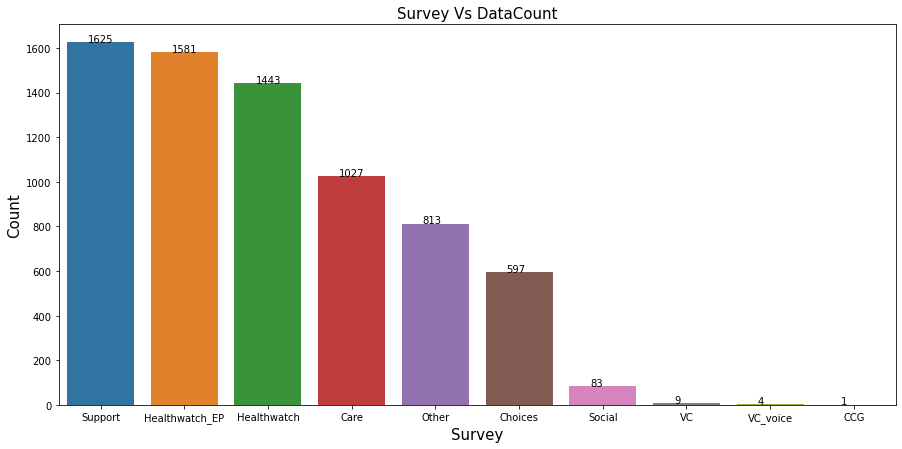

In [107]:
plt.figure(figsize=(15,7))
#plt.style.use('seaborn')
ax=sns.countplot(x='survey',data=df,order = df['survey'].value_counts().index)
ax.set_title('Survey Vs DataCount',fontsize=15)
ax.set_xlabel("Survey",fontsize=15)
ax.set_ylabel("Count",fontsize=15)
for p in ax.patches:
   ax.annotate('{}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()))
plt.show()

In [108]:
df['survey'].value_counts().sort_values(ascending=False)

Support           1625
Healthwatch_EP    1581
Healthwatch       1443
Care              1027
Other              813
Choices            597
Social              83
VC                   9
VC_voice             4
CCG                  1
Name: survey, dtype: int64

In [109]:
df['patient_feedback'].groupby(df['organisation']).count().sort_values(ascending=False).head(10)

organisation
NHS Bradford CCG                                                     3003
not mentioned                                                        1575
NHS Bradford Teaching Hospitals Foundation Trust                      983
NHS Bradford District Care Trust                                      619
NHS Airedale Hospital Foundation Trust                                454
Yorkshire Ambulance Services                                           98
NHS Bradford Teaching Hospitals Foundation Trust,NHS Bradford CCG      96
The Yorkshire clinic                                                   71
NHS Bradford District Care Trust,NHS Bradford CCG                      69
NHS Bradford CCG,Yorkshire Ambulance Services                          37
Name: patient_feedback, dtype: int64

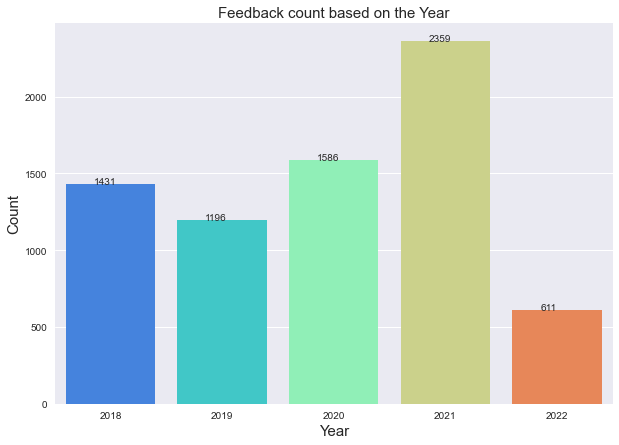

In [110]:
plt.figure(figsize=(10,7))
plt.style.use('seaborn')
ax=sns.countplot(x='year',data=df,palette='rainbow')
ax.set_title('Feedback count based on the Year',fontsize=15)
ax.set_xlabel("Year",fontsize=15)
ax.set_ylabel("Count",fontsize=15)
for p in ax.patches:
   ax.annotate('{}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()))
plt.show()

In [111]:
df.head()

,date,survey,services,patient_feedback,year,month,organisation,third_party,GP,service,priority_area,primary_care,cleaned_feedback
0,2021-08-31,CCG,"NHS Bradford District Care Trust, Mental Heal...",The CAMHS service needs to be proactive and no...,2021,August,NHS Bradford District Care Trust,not mentioned,not mentioned,"Mental Health,Mental Health","Mental Health,Children & Young People,Mental H...",not mentioned,the camhs service needs to be proactive and no...
1,2018-04-03,Care,"Community, Inpatient, Secondary care services...","My Mother was in Airedale District hospital, b...",2018,April,NHS Airedale Hospital Foundation Trust,not mentioned,not mentioned,"Community,Inpatient",Secondary care services,not mentioned,my mother was in airedale district hospital bu...
2,2018-04-03,Care,"Inpatient, Secondary care services, NHS Aired...",I attended the emergency department at Airedal...,2018,April,NHS Airedale Hospital Foundation Trust,not mentioned,not mentioned,Inpatient,Secondary care services,not mentioned,i attended the emergency department at airedal...
3,2018-05-10,Care,"Ambulance, Inpatient, Secondary care services...",from 999 call and calming helpful operator to ...,2018,May,NHS Airedale Hospital Foundation Trust,not mentioned,not mentioned,"Ambulance,Inpatient",Secondary care services,not mentioned,from call and calming helpful operator to firs...
5,2018-07-03,Care,NHS Bradford Teaching Hospitals Foundation Tr...,I am currently 33 weeks and the service I have...,2018,July,NHS Bradford Teaching Hospitals Foundation Trust,not mentioned,not mentioned,"Inpatient,Maternity","Maternity,Secondary care services",not mentioned,i am currently weeks and the service i have re...


In [112]:
df2=df.groupby(['year','month'])['patient_feedback'].size().reset_index(name='counts')
print(df2)

    year      month  counts
0   2018      April     178
1   2018     August     155
2   2018   December     111
3   2018    January       1
4   2018       July     199
5   2018       June     168
6   2018        May     151
7   2018   November     194
8   2018    October     172
9   2018  September     102
10  2019      April     109
11  2019     August     146
12  2019   December      80
13  2019   February     118
14  2019    January     120
15  2019       July      61
16  2019       June      47
17  2019      March      62
18  2019        May     117
19  2019   November     159
20  2019    October     105
21  2019  September      72
22  2020      April      34
23  2020     August     126
24  2020   December     113
25  2020   February     107
26  2020    January     125
27  2020       July     146
28  2020       June     116
29  2020      March     190
30  2020        May     101
31  2020   November     153
32  2020    October     155
33  2020  September     220
34  2021      April 

In [113]:
df3=df.groupby(['date'])['patient_feedback'].size().reset_index(name='counts')
print(df3)

           date  counts
0    2018-01-16       1
1    2018-04-03       8
2    2018-04-04       7
3    2018-04-05       4
4    2018-04-06       4
...         ...     ...
1016 2022-07-13       2
1017 2022-07-14       2
1018 2022-07-16       1
1019 2022-07-19       4
1020 2022-07-31       2

[1021 rows x 2 columns]


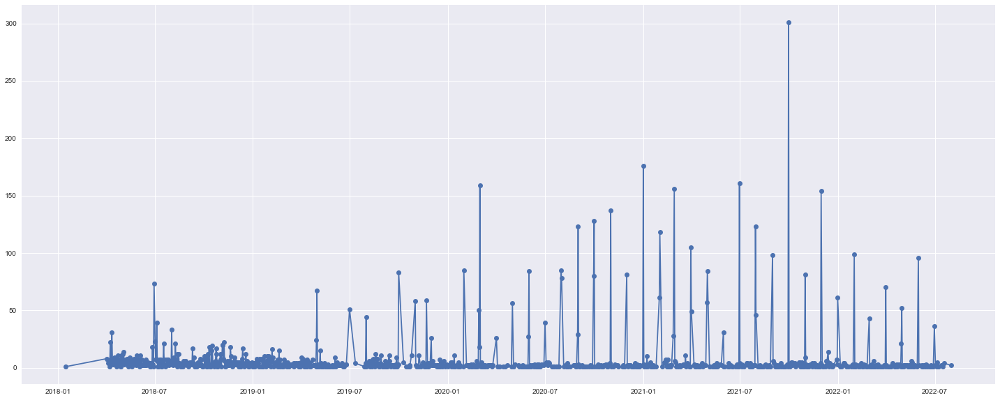

In [114]:
plt.figure(figsize=(25,10))
df3_date = df3['date']
df3_count = df3['counts']
plt.plot_date(df3_date, df3_count,linestyle='solid')

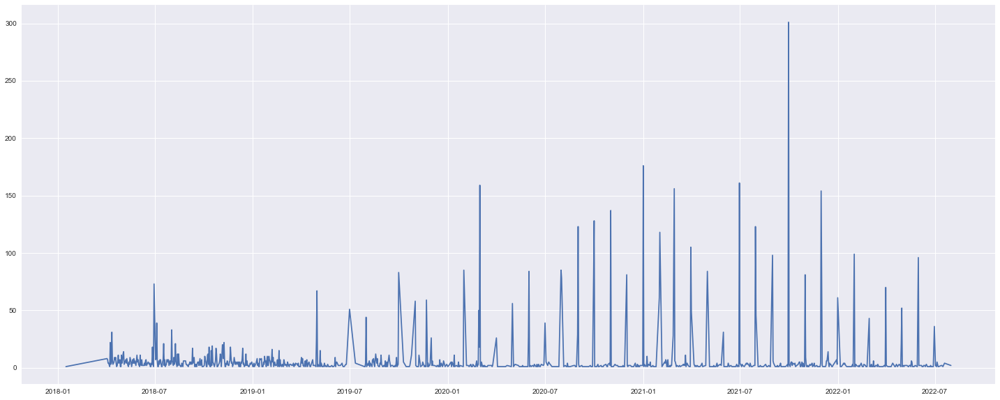

In [115]:
plt.figure(figsize=(25,10))
df3_date = df3['date']
df3_count = df3['counts']
plt.plot(df3_date,df3_count)

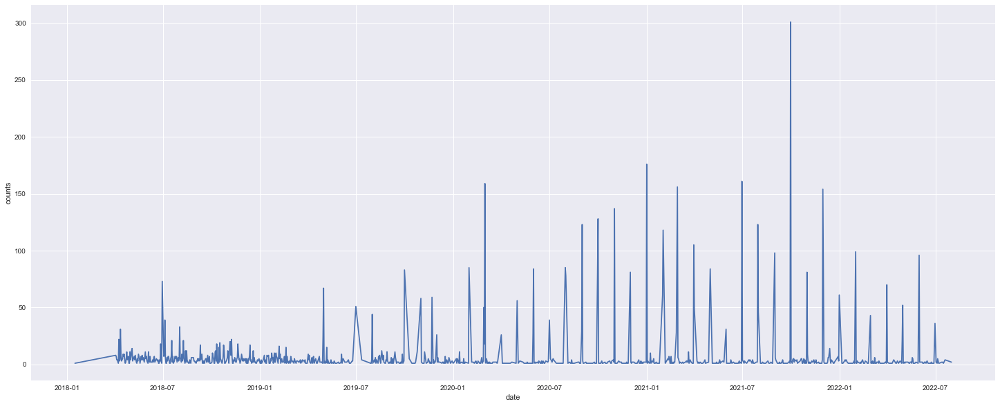

In [116]:
plt.figure(figsize=(25,10))
sns.lineplot(x=df3_date,y=df3_count,data=df3)
plt.show()

In [117]:
from calendar import month_name as mn

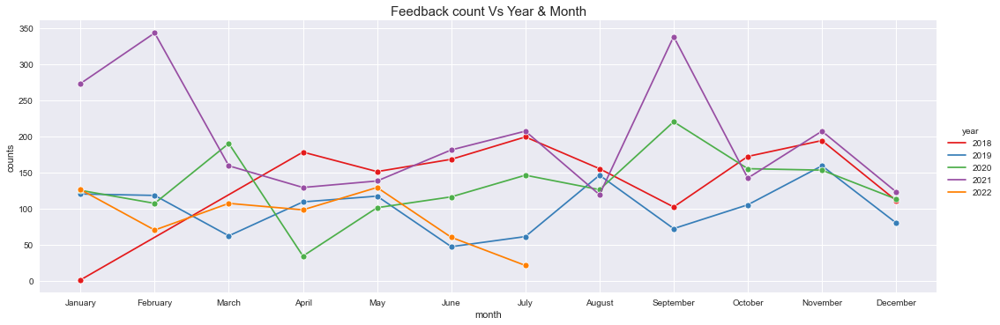

In [118]:
#months list 
month = mn[1:]
df2.month = pd.Categorical(df2.month,categories=month, ordered=True)
ax=sns.relplot(kind='line',data=df2,x='month',y='counts',hue='year',aspect=3,marker='o',palette='Set1')
#ax.set_title('Feedback count Vs Year & Month',fontsize=15)
plt.title('Feedback count Vs Year & Month',fontsize=15)
plt.show()

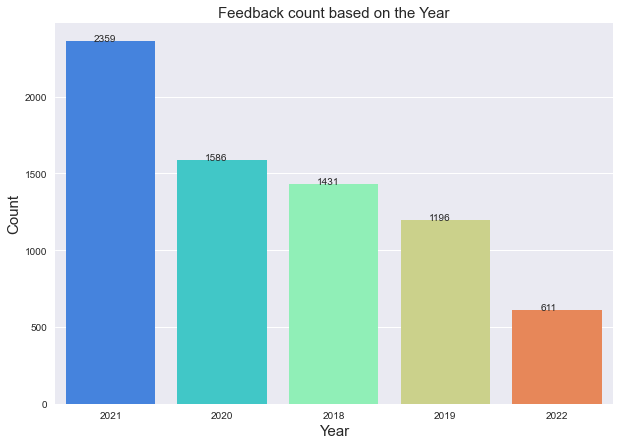

In [119]:
plt.figure(figsize=(10,7))
plt.style.use('seaborn')
ax=sns.countplot(x='year',data=df,order = df['year'].value_counts().index,palette='rainbow')
ax.set_title('Feedback count based on the Year',fontsize=15)
ax.set_xlabel("Year",fontsize=15)
ax.set_ylabel("Count",fontsize=15)
for p in ax.patches:
   ax.annotate('{}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()))
plt.show()

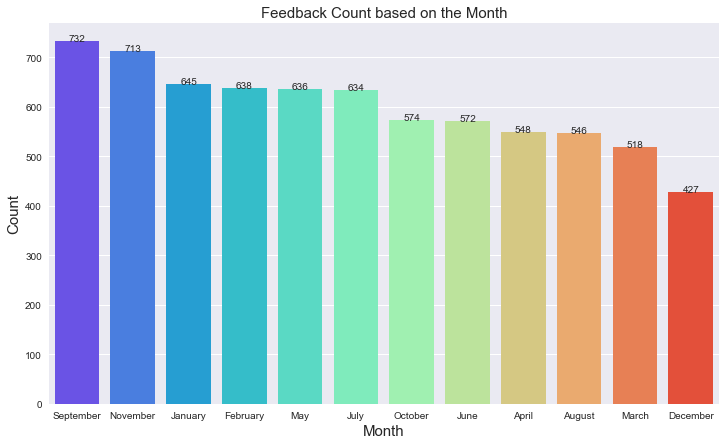

In [120]:
plt.figure(figsize=(12,7))
plt.style.use('seaborn')
ax=sns.countplot(x='month',data=df,order = df['month'].value_counts().index,palette='rainbow')
ax.set_title('Feedback Count based on the Month',fontsize=15)
ax.set_xlabel("Month",fontsize=15)
ax.set_ylabel("Count",fontsize=15)
for p in ax.patches:
   ax.annotate('{}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()))
plt.show()

In [121]:
CCG = 0
Airdale = 0
Ambulance = 0
ETC = 0
Bradford_DC=0
Bradford_TH = 0
Optegra = 0
Y_clinic = 0
Y_Eye_Clinic = 0

In [122]:
def org(text):
    global CCG
    global Airdale
    global Ambulance
    global ETC
    global Bradford_DC
    global Bradford_TH
    global Optegra
    global Y_clinic
    global Y_Eye_Clinic
    for j in text.split(','):
        if j == 'NHS Airedale Hospital Foundation Trust':
            Airdale += 1
            #return Airdale
        elif j == 'Yorkshire Ambulance Services':
            Ambulance +=1
            #return Ambulance
        elif j == 'NHS Bradford CCG':
            CCG +=1 
            #return CCG
        elif j == 'Eccleshill Treatment Centre':
            ETC +=1
            #return ETC
        elif j == 'NHS Bradford District Care Trust':
            Bradford_DC += 1
            #return Bradford_DC
        elif j == 'NHS Bradford Teaching Hospitals Foundation Trust':
            Bradford_TH += 1
            #return Bradford_TH
        elif j == 'Optegra':
            Optegra += 1
            #return Optegra
        elif j == 'The Yorkshire clinic':
            Y_clinic += 1
            #return Y_clinic
        elif j == 'Yorkshire Eye clinic':
            Y_Eye_Clinic += 1
            #return Y_Eye_Clinic
        else:
            pass

In [123]:
test = df['organisation'].apply(org)

In [124]:
Org = [['Ambulance', Ambulance],['Bradford_TH',Bradford_TH],['Bradford_DC',Bradford_DC],
       ['CCG',CCG],['ETC',ETC],['Y_clinic',Y_clinic],['Y_Eye_Clinic',Y_Eye_Clinic],['Optegra',Optegra],['Airdale',Airdale]]

In [125]:
Org_col = ['Ambulance','Bradford_TH','Bradford_DC','CCG','ETC','Y_clinic','Y_Eye_Clinic','Optegra','Airdale']

In [126]:
dt = pd.DataFrame(Org, columns=['Organisation_Category', 'Org_Count'])

In [127]:
dt.head()

,Organisation_Category,Org_Count
0,Ambulance,184
1,Bradford_TH,1165
2,Bradford_DC,709
3,CCG,3292
4,ETC,8


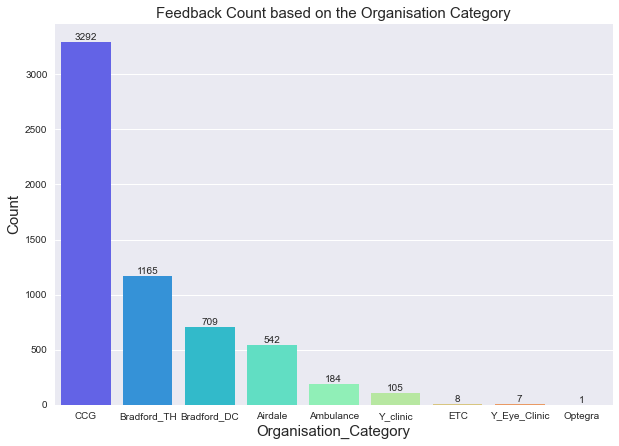

In [128]:
plt.figure(figsize=(10,7))
plt.style.use('seaborn')
ax=sns.barplot(x='Organisation_Category',y='Org_Count', data=dt,
               order = dt.sort_values('Org_Count',ascending=False).Organisation_Category,
               palette='rainbow')
ax.set_title('Feedback Count based on the Organisation Category',fontsize=15)
ax.set_xlabel("Organisation_Category",fontsize=15)
ax.set_ylabel("Count",fontsize=15)
ax.bar_label(ax.containers[0])
#for p in ax.patches:
   #ax.annotate('{}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()))
    #ax.annotate('{}'.format(dt['Org_Count']))
plt.show()

In [129]:
A_E = 0
Aging = 0
Ambulance_service = 0
Amb_E =0
Commissioning = 0
Community = 0
Dental = 0
GP = 0
Inpatient = 0
Maternity = 0
Mental_Health = 0
Outpatient = 0
Respiratory = 0

In [130]:
def serv1(text):
    
    global A_E
    global Aging
    global Ambulance_service
    global Amb_E
    global Commissioning
    global Community
    global Dental
    global GP
    global Inpatient
    global Maternity
    global Mental_Health
    global Outpatient
    global Respiratory
    
    for j in text.split(','):
        if j == 'Accident and Emergency':
            A_E += 1
            #return Airdale
        elif j == 'Ageing Well':
            Aging +=1
            #return Ambulance
        elif j == 'Ambulance':
            Ambulance_service +=1 
            #return CCG
        elif j == 'Ambulance and Emergency':
            Amb_E +=1
            #return ETC
        elif j == 'Commissioning':
            Commissioning += 1
            #return Bradford_DC
        elif j == 'Community':
            Community += 1
            #return Bradford_TH
        elif j == 'Dental':
            Dental += 1
            #return Optegra
        elif j == 'GP':
            GP += 1
            #return Y_clinic
        elif j == 'Inpatient':
            Inpatient += 1
            #return Y_Eye_Clinic
        elif j == 'Maternity':
            Maternity += 1
        elif j == 'Mental Health':
            Mental_Health += 1
        elif j == 'Outpatient':
            Outpatient += 1
        elif j == 'Respiratory':
            Respiratory += 1
        else:
            pass

serv_test = df['service'].apply(serv1)

In [131]:
Service_Category = ['A_E','Aging','Ambulance_service','Amb_E','Commissioning','Community','Dental','GP','Inpatient',
         'Maternity','Mental Health','Outpatient','Respiratory']
Service_count = [A_E,Aging,Ambulance_service,Amb_E,Commissioning,Community,Dental,GP,Inpatient,
                Maternity,Mental_Health,Outpatient,Respiratory]
#list_of_tuples = list(zip(Service_Category, Service_count))
serv_data = {'Service_Category': Service_Category,
        'Service_count': Service_count}
serv_dt = pd.DataFrame(serv_data)

In [132]:
serv_dt.head(13)

,Service_Category,Service_count
0,A_E,308
1,Aging,106
2,Ambulance_service,119
3,Amb_E,6
4,Commissioning,82
5,Community,1227
6,Dental,378
7,GP,2891
8,Inpatient,347
9,Maternity,712


In [133]:
calculated_data = pd.concat([dt, serv_dt],axis="columns")

In [134]:
calculated_data.head()

,Organisation_Category,Org_Count,Service_Category,Service_count
0,Ambulance,184.0,A_E,308
1,Bradford_TH,1165.0,Aging,106
2,Bradford_DC,709.0,Ambulance_service,119
3,CCG,3292.0,Amb_E,6
4,ETC,8.0,Commissioning,82


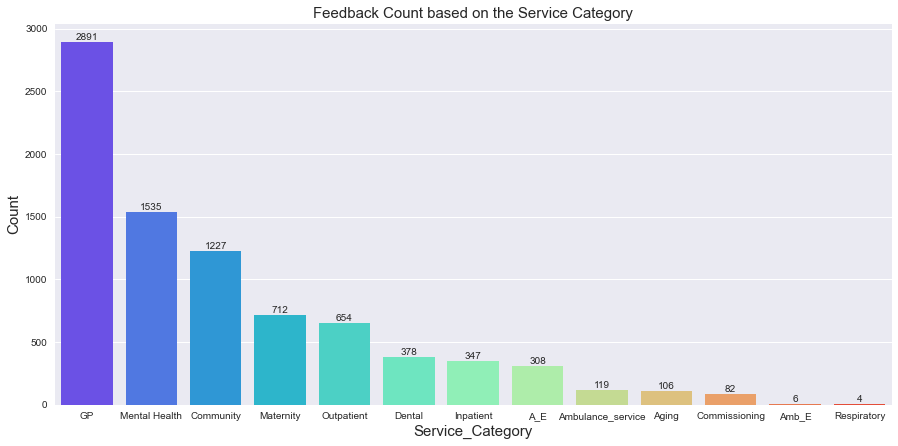

In [135]:
plt.figure(figsize=(15,7))
plt.style.use('seaborn')
ax=sns.barplot(x='Service_Category',y='Service_count', data=calculated_data,
               order = calculated_data.sort_values('Service_count',ascending=False).Service_Category,palette='rainbow')
ax.set_title('Feedback Count based on the Service Category',fontsize=15)
ax.set_xlabel("Service_Category",fontsize=15)
ax.set_ylabel("Count",fontsize=15)
ax.bar_label(ax.containers[0])
#for p in ax.patches:
   #ax.annotate('{}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()))
    #ax.annotate('{}'.format(dt['Org_Count']))
plt.show()

In [136]:
AC_Primary = 0
Bingley_Bubble=0
B4_Network =0
B4_Care =0
B5_Network =0
B6_Care=0
Braford_North=0
Braford_North_West=0
Braford_South=0
Five_Lane=0
Modality=0
WACA=0

In [137]:
def p_care(text):
    
    global AC_Primary
    global Bingley_Bubble
    global B4_Network
    global B4_Care
    global B5_Network
    global B6_Care
    global Braford_North
    global Braford_North_West
    global Braford_South
    global Five_Lane
    global Modality
    global WACA
    
    for j in text.split(','):
        if j == 'Affinity Care Primary Care Networt':
            AC_Primary += 1
            #return Airdale
        elif j == 'Bingley Bubble':
            Bingley_Bubble +=1
            #return Ambulance
        elif j == 'Bradford 4 Plus Network':
            B4_Network +=1 
            #return CCG
        elif j == 'Bradford City 5 Primary Care Network':
            B5_Network +=1
            #return ETC
        elif j == 'Bradford City 6':
            B6_Care += 1
            #return Bradford_DC
        elif j == 'Bradford North Network':
            Braford_North += 1
            #return Bradford_TH
        elif j == 'Bradford North West Network':
            Braford_North_West += 1
            #return Optegra
        elif j == 'Bradford South Network':
            Braford_South += 1
            #return Y_clinic
        elif j == 'Five Lane Ends Network':
            Five_Lane += 1
            #return Y_Eye_Clinic
        elif j == 'Modality':
            Modality += 1
        elif j == 'WACA':
            WACA += 1
        elif j == 'Bradford City 4 car':
            B4_Care += 1
        else:
            pass

p_care_data = df['primary_care'].apply(p_care)

In [138]:
PrimaryCare_Category = ['AC_Primary','Bingley_Bubble','B4_Network','B4_Care','B5_Network','B6_Care','Braford_North','Braford_North_West',
                    'Braford_South','Five_Lane','Modality','WACA']
PrimaryCare_Count = [AC_Primary,Bingley_Bubble,B4_Network,B4_Care,B5_Network,B6_Care,Braford_North,Braford_North_West,
                 Braford_South,Five_Lane,Modality,WACA]
#list_of_tuples = list(zip(Service_Category, Service_count))
Primary_data = {'PrimaryCare_Category': PrimaryCare_Category,
        'PrimaryCare_Count': PrimaryCare_Count}
primaryCare_dt = pd.DataFrame(Primary_data)

In [139]:
primaryCare_dt

,PrimaryCare_Category,PrimaryCare_Count
0,AC_Primary,196
1,Bingley_Bubble,128
2,B4_Network,82
3,B4_Care,433
4,B5_Network,219
5,B6_Care,151
6,Braford_North,66
7,Braford_North_West,147
8,Braford_South,195
9,Five_Lane,71


In [140]:
calculated_data = pd.concat([calculated_data,primaryCare_dt],axis="columns")

In [141]:
calculated_data.head()

,Organisation_Category,Org_Count,Service_Category,Service_count,PrimaryCare_Category,PrimaryCare_Count
0,Ambulance,184.0,A_E,308,AC_Primary,196.0
1,Bradford_TH,1165.0,Aging,106,Bingley_Bubble,128.0
2,Bradford_DC,709.0,Ambulance_service,119,B4_Network,82.0
3,CCG,3292.0,Amb_E,6,B4_Care,433.0
4,ETC,8.0,Commissioning,82,B5_Network,219.0


In [142]:
calculated_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13 entries, 0 to 12
Data columns (total 6 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Organisation_Category  9 non-null      object 
 1   Org_Count              9 non-null      float64
 2   Service_Category       13 non-null     object 
 3   Service_count          13 non-null     int64  
 4   PrimaryCare_Category   12 non-null     object 
 5   PrimaryCare_Count      12 non-null     float64
dtypes: float64(2), int64(1), object(3)
memory usage: 752.0+ bytes


In [143]:
calculated_data['PrimaryCare_Count'] = calculated_data['PrimaryCare_Count'].astype('Int64')

In [144]:
calculated_data.head()

,Organisation_Category,Org_Count,Service_Category,Service_count,PrimaryCare_Category,PrimaryCare_Count
0,Ambulance,184.0,A_E,308,AC_Primary,196
1,Bradford_TH,1165.0,Aging,106,Bingley_Bubble,128
2,Bradford_DC,709.0,Ambulance_service,119,B4_Network,82
3,CCG,3292.0,Amb_E,6,B4_Care,433
4,ETC,8.0,Commissioning,82,B5_Network,219


In [145]:
calculated_data['Org_Count'] = calculated_data['Org_Count'].astype('Int64')

In [146]:
calculated_data.head()

,Organisation_Category,Org_Count,Service_Category,Service_count,PrimaryCare_Category,PrimaryCare_Count
0,Ambulance,184,A_E,308,AC_Primary,196
1,Bradford_TH,1165,Aging,106,Bingley_Bubble,128
2,Bradford_DC,709,Ambulance_service,119,B4_Network,82
3,CCG,3292,Amb_E,6,B4_Care,433
4,ETC,8,Commissioning,82,B5_Network,219


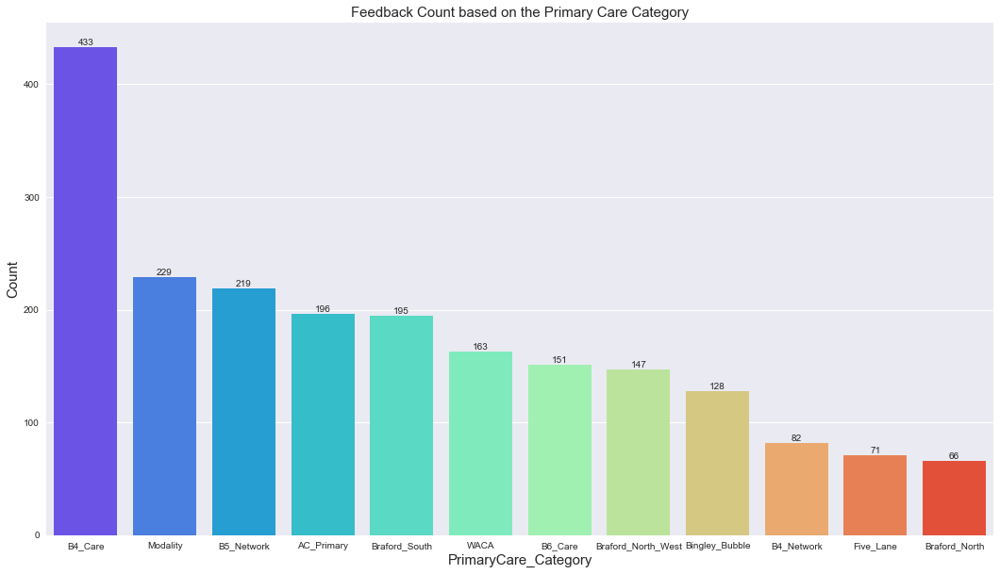

In [147]:
plt.figure(figsize=(18,10))
plt.style.use('seaborn')
ax=sns.barplot(x='PrimaryCare_Category',y='PrimaryCare_Count', data=primaryCare_dt,
               order = primaryCare_dt.sort_values('PrimaryCare_Count',ascending=False).PrimaryCare_Category,palette='rainbow')
ax.set_title('Feedback Count based on the Primary Care Category',fontsize=15)
ax.set_xlabel("PrimaryCare_Category",fontsize=15)
ax.set_ylabel("Count",fontsize=15)
ax.bar_label(ax.containers[0])
#for p in ax.patches:
   #ax.annotate('{}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()))
    #ax.annotate('{}'.format(dt['Org_Count']))
plt.show()

In [148]:
df['GP'].value_counts().head(10)

not mentioned                                               5057
*The Ridge- Great Horton Surgery                              83
Kensington Partnership - Woodroyd Medical Centre              79
*Clarendon Medical Centre                                     77
Bilton Medical Centre                                         75
*Bingley Medical Practice - Canalside Health Care Centre      61
*Picton Medical Centre - Westbourne Green                     61
Sunnybank Medical Centre                                      59
*Shipley Medical Practice - Alexandra Road                    52
Ashwell Medical Centre                                        48
Name: GP, dtype: int64

**Count for Organisation NHS Bradford CCG**

In [149]:
found = df[df['organisation'].str.contains('NHS Bradford CCG')]

In [150]:
found1= df[df['organisation'].str.contains('NHS Bradford CCG')]

In [151]:
#df = df.drop(df.index[[7511,7512]])
#found1=found1.drop(found1['service']=="not mentioned")
#found1['service']=found1[found1['service'] !="not mentioned"]
ccg_service = found1[found1['service'] !="not mentioned"]

In [152]:
ccg_service['service'].value_counts().head()

GP                                2278
Community                          130
Community,GP                       118
GP,Mental Health,Mental Health     109
GP,Ageing Well                      46
Name: service, dtype: int64

In [153]:
found[found['service']!="not mentioned"]['service'].value_counts().head()

GP                                2278
Community                          130
Community,GP                       118
GP,Mental Health,Mental Health     109
GP,Ageing Well                      46
Name: service, dtype: int64

In [154]:
found['service'].value_counts().head()

GP                                2278
not mentioned                      220
Community                          130
Community,GP                       118
GP,Mental Health,Mental Health     109
Name: service, dtype: int64

In [155]:
s = found.groupby("service")

[Text(0, 0, '2278'),
 Text(0, 0, '220'),
 Text(0, 0, '130'),
 Text(0, 0, '118'),
 Text(0, 0, '109'),
 Text(0, 0, '46'),
 Text(0, 0, '34'),
 Text(0, 0, '31'),
 Text(0, 0, '29'),
 Text(0, 0, '26')]

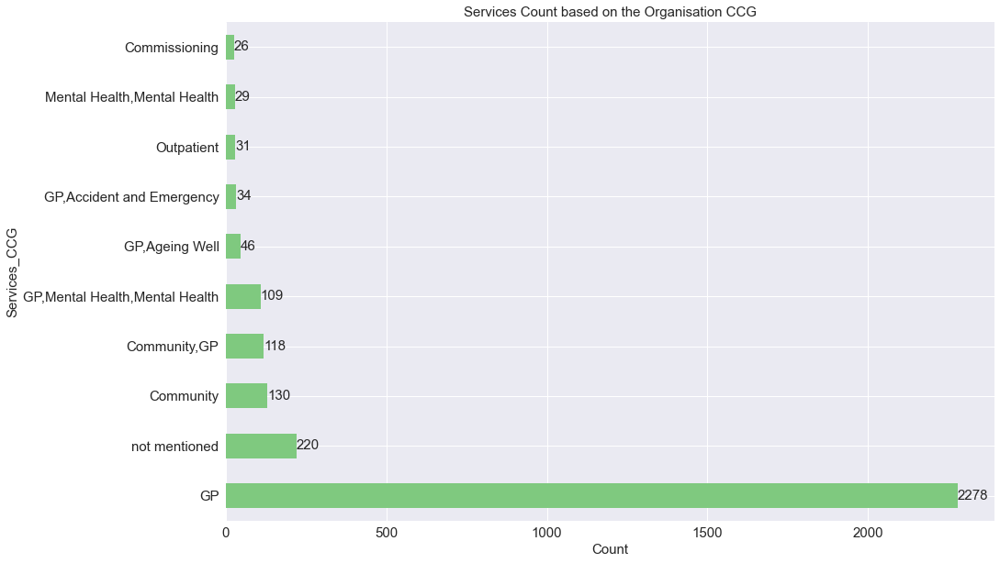

In [156]:
plt.style.use('seaborn')
plt.figure(figsize=(15,10))
ax = s.size().sort_values(ascending=False).head(10).plot.barh(colormap='Accent',fontsize=15)
ax.set_title('Services Count based on the Organisation CCG',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Services_CCG",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
#plt.title("Services count based on Organisation CCG")

[Text(0, 0, '2278'),
 Text(0, 0, '130'),
 Text(0, 0, '118'),
 Text(0, 0, '109'),
 Text(0, 0, '46'),
 Text(0, 0, '34'),
 Text(0, 0, '31'),
 Text(0, 0, '29'),
 Text(0, 0, '26'),
 Text(0, 0, '22')]

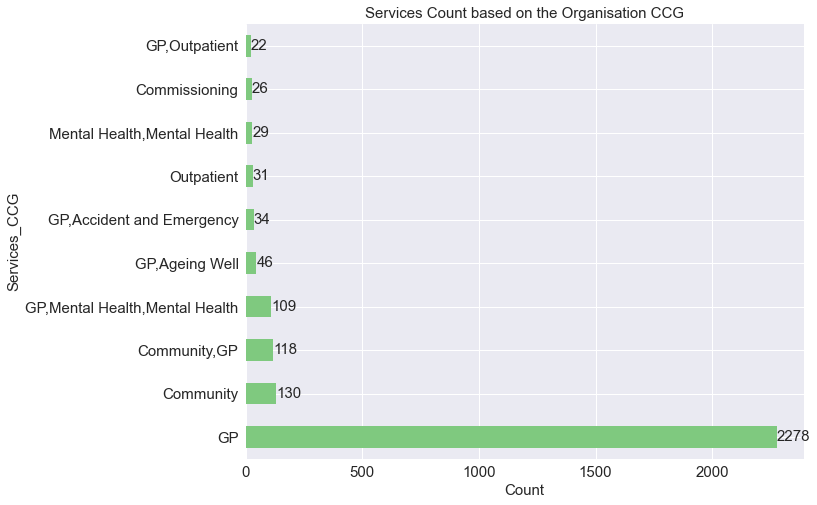

In [157]:
plt.figure(figsize=(10,8))
ax = found[found['service']!="not mentioned"]['service'].value_counts().sort_values(ascending=False).head(10).plot.barh(colormap='Accent',fontsize=15)
ax.set_title('Services Count based on the Organisation CCG',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Services_CCG",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
#plt.title("Services count based on Organisation CCG")

In [158]:
CCG_year = found.groupby("year")

[Text(0, 0, '1029'),
 Text(0, 0, '771'),
 Text(0, 0, '636'),
 Text(0, 0, '520'),
 Text(0, 0, '336')]

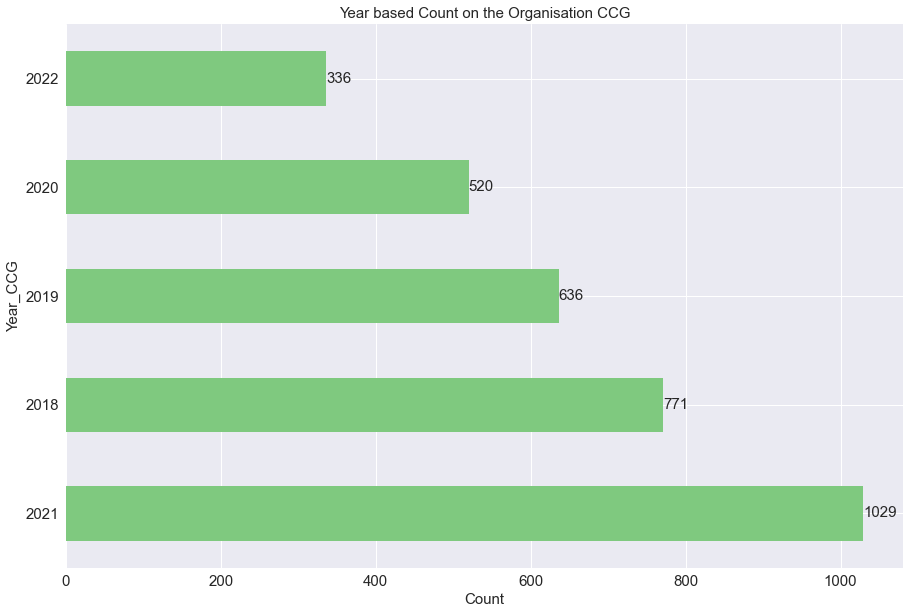

In [159]:
plt.figure(figsize=(15,10))
ax = CCG_year.size().sort_values(ascending=False).plot.barh(colormap='Accent',fontsize=15)
ax.set_title('Year based Count on the Organisation CCG',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Year_CCG",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
#plt.title("Services count based on Organisation CCG")

[Text(0, 0, '771'),
 Text(0, 0, '636'),
 Text(0, 0, '520'),
 Text(0, 0, '1029'),
 Text(0, 0, '336')]

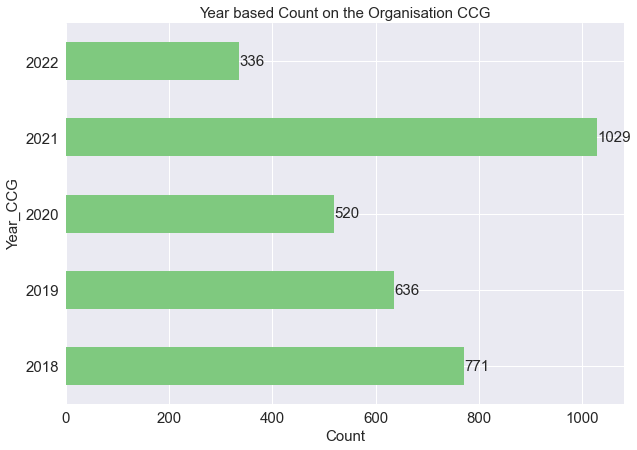

In [160]:
plt.figure(figsize=(10,7))
ax = CCG_year.size().plot.barh(colormap='Accent',fontsize=15)
ax.set_title('Year based Count on the Organisation CCG',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Year_CCG",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
#plt.title("Services count based on Organisation CCG")

[Text(0, 0, '357'),
 Text(0, 0, '315'),
 Text(0, 0, '305'),
 Text(0, 0, '294'),
 Text(0, 0, '294'),
 Text(0, 0, '289'),
 Text(0, 0, '288'),
 Text(0, 0, '282'),
 Text(0, 0, '258'),
 Text(0, 0, '221'),
 Text(0, 0, '220'),
 Text(0, 0, '169')]

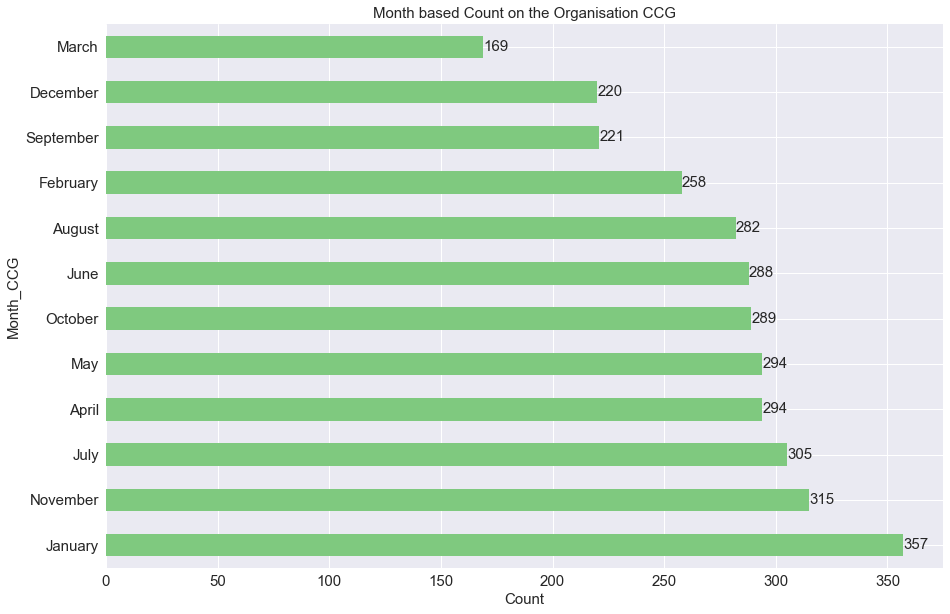

In [161]:
CCG_month = found.groupby("month")
plt.figure(figsize=(15,10))
ax = CCG_month.size().sort_values(ascending=False).plot.barh(colormap='Accent',fontsize=15)
ax.set_title('Month based Count on the Organisation CCG',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Month_CCG",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
#plt.title("Services count based on Organisation CCG")

In [162]:
CCG_third = found.groupby("third_party")

In [163]:
CCG_third.size().sort_values(ascending=False)

third_party
not mentioned                                            3096
Local Authority                                            72
NHS England                                                38
Other NHS service                                          31
Other service                                              30
Local Care Direct                                           7
Health Action Local Engagement (HALE)                       4
Locala                                                      2
Carers Resource                                             2
Other NHS service,Other service                             1
The Cellar Trust,Other NHS service                          1
Sharing Voices Bradford (SVB)                               1
Roshni Ghar                                                 1
Bradford Cancer Support                                     1
NHS CCG not specified                                       1
Local Authority,Other NHS service                         

[Text(0, 0, '3096'),
 Text(0, 0, '72'),
 Text(0, 0, '38'),
 Text(0, 0, '31'),
 Text(0, 0, '30'),
 Text(0, 0, '7'),
 Text(0, 0, '4'),
 Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '1')]

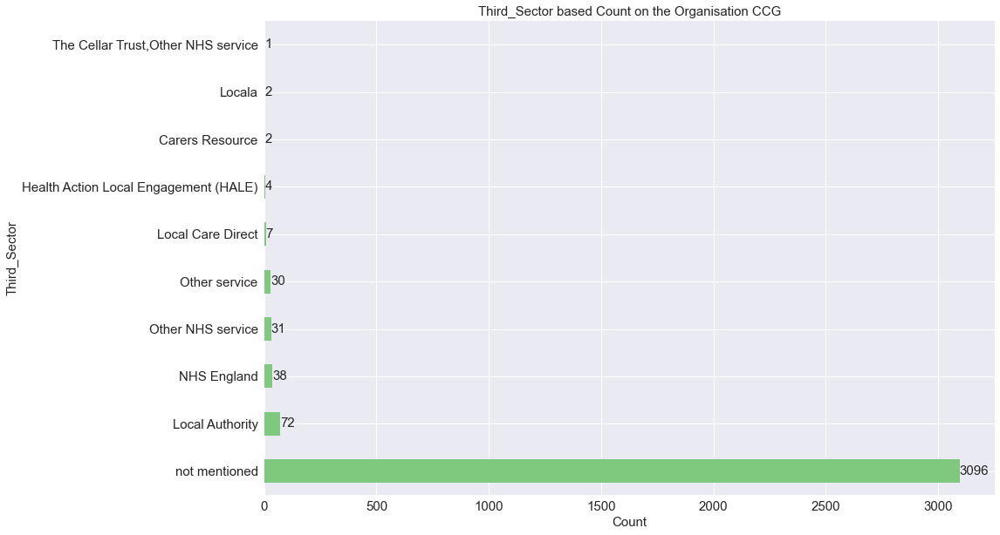

In [164]:
plt.figure(figsize=(15,10))
ax = found['third_party'].value_counts().sort_values(ascending=False).head(10).plot.barh(colormap='Accent',fontsize=15)
ax.set_title('Third_Sector based Count on the Organisation CCG',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Third_Sector",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

In [165]:
found['GP'].value_counts().sort_values(ascending=False).head(10)

not mentioned                                               1252
*The Ridge- Great Horton Surgery                              77
Kensington Partnership - Woodroyd Medical Centre              75
*Clarendon Medical Centre                                     74
Bilton Medical Centre                                         73
Sunnybank Medical Centre                                      58
*Bingley Medical Practice - Canalside Health Care Centre      58
*Picton Medical Centre - Westbourne Green                     56
*Shipley Medical Practice - Alexandra Road                    47
Ashwell Medical Centre                                        46
Name: GP, dtype: int64

[Text(0, 0, '1252'),
 Text(0, 0, '77'),
 Text(0, 0, '75'),
 Text(0, 0, '74'),
 Text(0, 0, '73'),
 Text(0, 0, '58'),
 Text(0, 0, '58'),
 Text(0, 0, '56'),
 Text(0, 0, '47'),
 Text(0, 0, '46')]

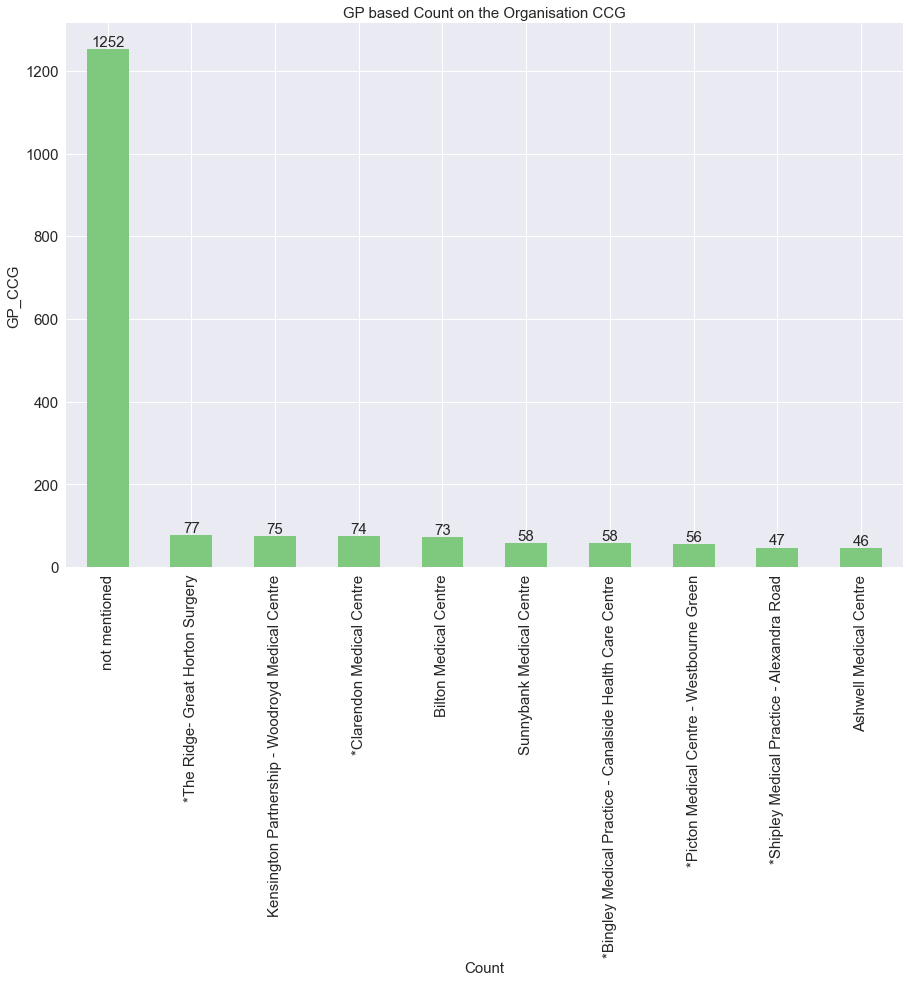

In [166]:
#CCG_GP = found.groupby("GP")
plt.figure(figsize=(15,10))
ax = found['GP'].value_counts().sort_values(ascending=False).head(10).plot.bar(colormap='Accent',fontsize=15)
ax.set_title('GP based Count on the Organisation CCG',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("GP_CCG",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
#plt.title("Services count based on Organisation CCG")

[Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

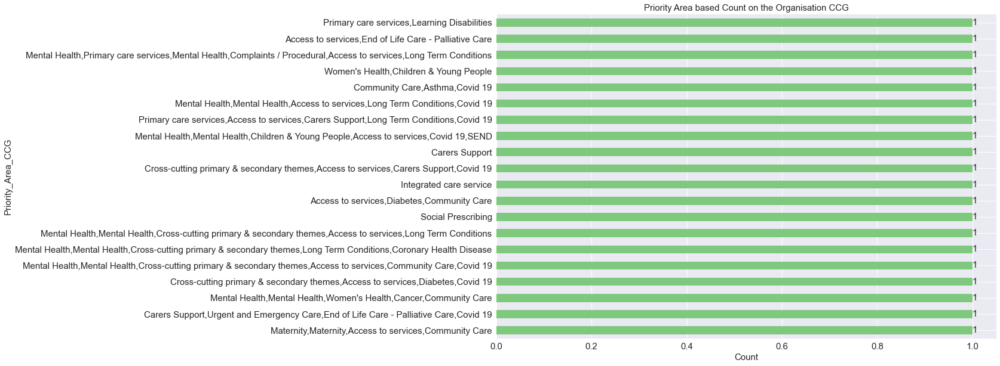

In [167]:
plt.figure(figsize=(15,10))
ax = found['priority_area'].value_counts().sort_values(ascending=True).head(20).plot.barh(colormap='Accent',fontsize=15)
ax.set_title('Priority Area based Count on the Organisation CCG',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Priority_Area_CCG",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
#plt.title("Services count based on Organisation CCG")

[Text(0, 0, '1320'),
 Text(0, 0, '393'),
 Text(0, 0, '222'),
 Text(0, 0, '211'),
 Text(0, 0, '189'),
 Text(0, 0, '185'),
 Text(0, 0, '157'),
 Text(0, 0, '141'),
 Text(0, 0, '122'),
 Text(0, 0, '118'),
 Text(0, 0, '80'),
 Text(0, 0, '63'),
 Text(0, 0, '61'),
 Text(0, 0, '23'),
 Text(0, 0, '2'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

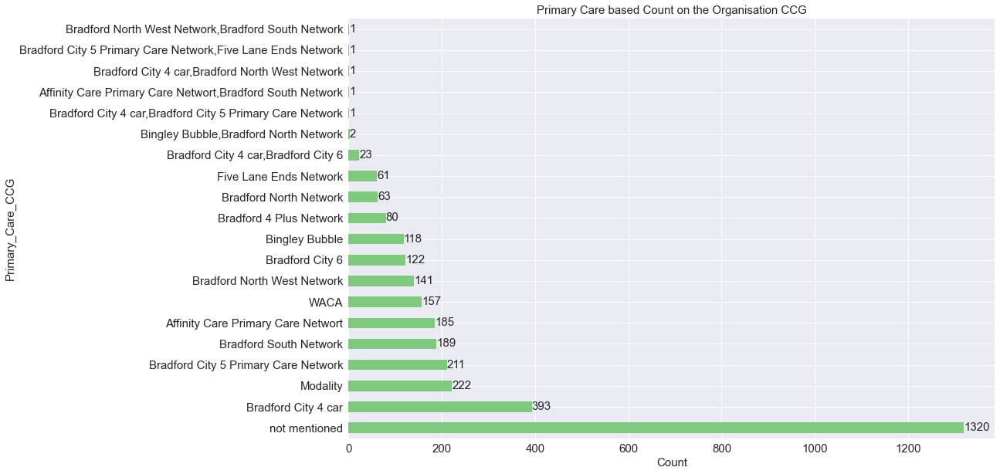

In [168]:
plt.figure(figsize=(15,10))
ax = found['primary_care'].value_counts().sort_values(ascending=False).plot.barh(colormap='Accent',fontsize=15)
ax.set_title('Primary Care based Count on the Organisation CCG',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Primary_Care_CCG",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
#plt.title("Services count based on Organisation CCG")

[Text(0, 0, '1103'),
 Text(0, 0, '558'),
 Text(0, 0, '539'),
 Text(0, 0, '432'),
 Text(0, 0, '411'),
 Text(0, 0, '188'),
 Text(0, 0, '58'),
 Text(0, 0, '3')]

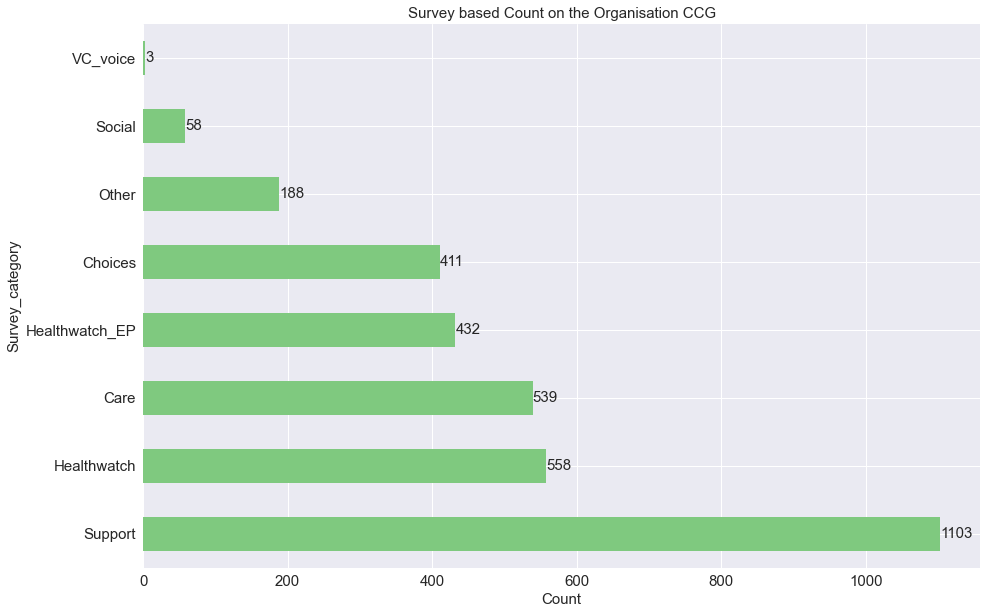

In [169]:
plt.figure(figsize=(15,10))
ax = found['survey'].value_counts().sort_values(ascending=False).plot.barh(colormap='Accent',fontsize=15)
ax.set_title('Survey based Count on the Organisation CCG',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Survey_category",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

**Count for Organisation Yorkshire Ambulance Service**

In [170]:
Organisations

['Eccleshill Treatment Centre',
 'NHS Airedale Hospital Foundation Trust',
 'NHS Bradford CCG',
 'NHS Bradford District Care Trust',
 'NHS Bradford Teaching Hospitals Foundation Trust',
 'Optegra',
 'The Yorkshire clinic',
 'Yorkshire Ambulance Services',
 'Yorkshire Eye clinic']

In [171]:
Org_Ambulance = df[df['organisation'].str.contains('Ambulance')]

In [172]:
Org_Ambulance['organisation'].size

184

[Text(0, 0, '167'),
 Text(0, 0, '10'),
 Text(0, 0, '4'),
 Text(0, 0, '2'),
 Text(0, 0, '1')]

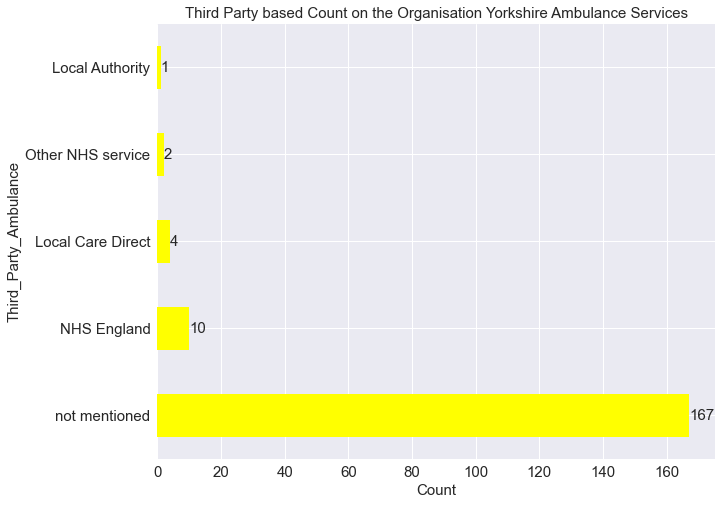

In [173]:
plt.figure(figsize=(10,8))
ax = Org_Ambulance['third_party'].value_counts().sort_values(ascending=False).plot.barh(color='yellow',fontsize=15)
ax.set_title('Third Party based Count on the Organisation Yorkshire Ambulance Services',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Third_Party_Ambulance",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
#plt.title("Services count based on Organisation CCG")

[Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '2'),
 Text(0, 0, '166')]

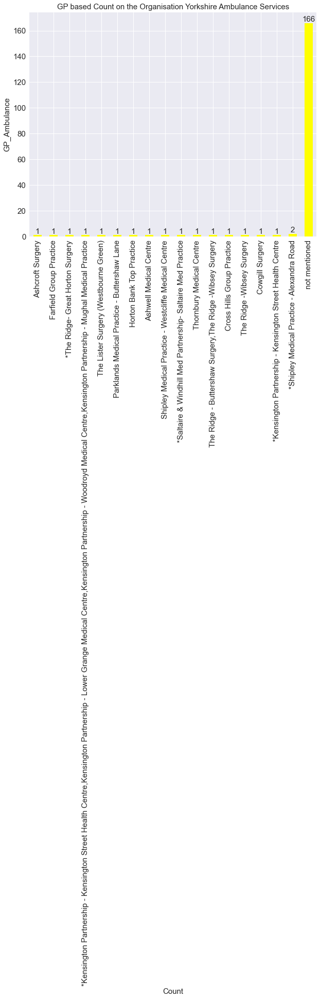

In [174]:
plt.figure(figsize=(10,8))
ax = Org_Ambulance['GP'].value_counts().sort_values(ascending=True).plot.bar(color='yellow',fontsize=15)
ax.set_title('GP based Count on the Organisation Yorkshire Ambulance Services',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("GP_Ambulance",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
#plt.title("Services count based on Organisation CCG")

[Text(0, 0, '52'),
 Text(0, 0, '23'),
 Text(0, 0, '17'),
 Text(0, 0, '15'),
 Text(0, 0, '13'),
 Text(0, 0, '8'),
 Text(0, 0, '8'),
 Text(0, 0, '6'),
 Text(0, 0, '6'),
 Text(0, 0, '5')]

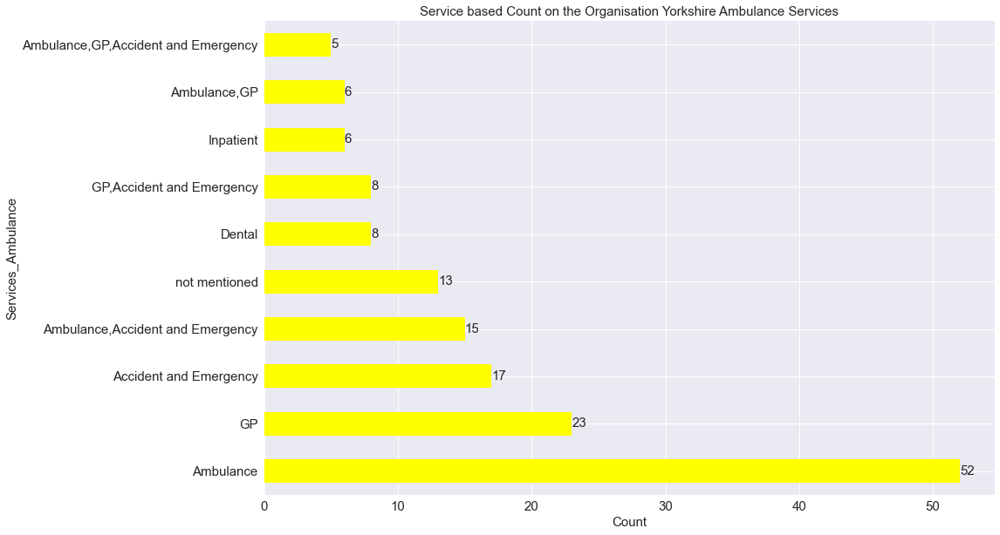

In [175]:
plt.figure(figsize=(15,10))
ax = Org_Ambulance['service'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='yellow',fontsize=15)
ax.set_title('Service based Count on the Organisation Yorkshire Ambulance Services',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Services_Ambulance",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
#plt.title("Services count based on Organisation CCG")

[Text(0, 0, '47'),
 Text(0, 0, '19'),
 Text(0, 0, '9'),
 Text(0, 0, '7'),
 Text(0, 0, '7'),
 Text(0, 0, '6'),
 Text(0, 0, '5'),
 Text(0, 0, '4'),
 Text(0, 0, '4'),
 Text(0, 0, '4')]

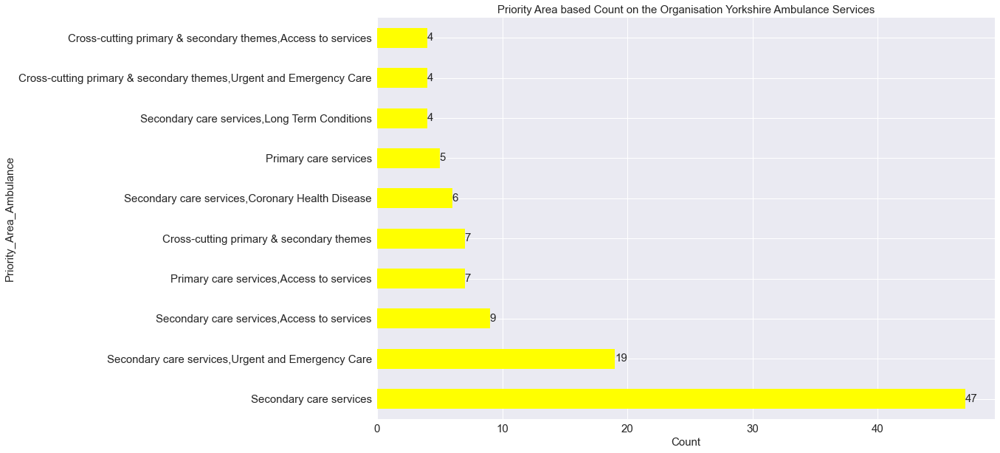

In [176]:
plt.figure(figsize=(15,10))
ax = Org_Ambulance['priority_area'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='yellow',fontsize=15)
ax.set_title('Priority Area based Count on the Organisation Yorkshire Ambulance Services',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Priority_Area_Ambulance",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
#plt.title("Services count based on Organisation CCG")

[Text(0, 0, '166'),
 Text(0, 0, '5'),
 Text(0, 0, '4'),
 Text(0, 0, '3'),
 Text(0, 0, '2'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

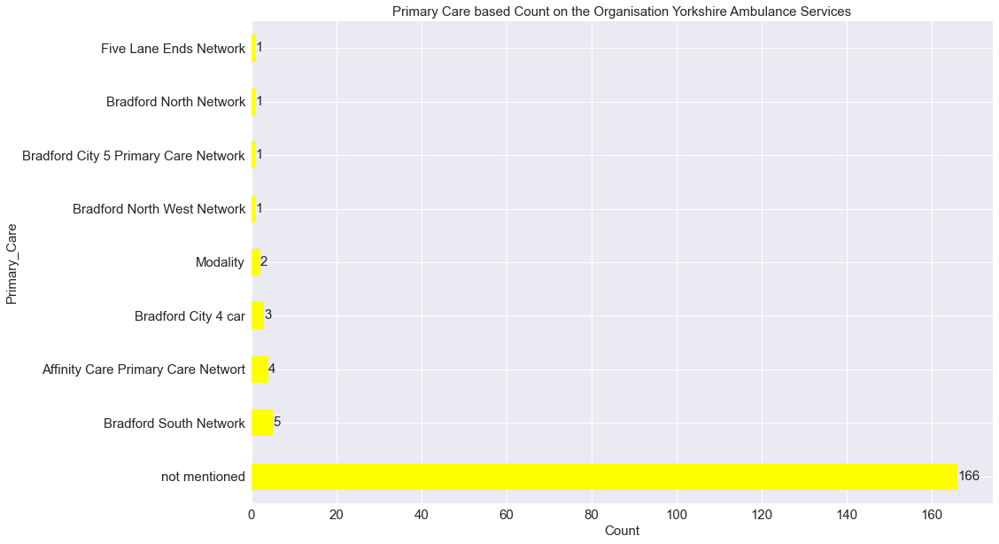

In [177]:
plt.figure(figsize=(15,10))
ax = Org_Ambulance['primary_care'].value_counts().sort_values(ascending=False).plot.barh(color='yellow',fontsize=15)
ax.set_title('Primary Care based Count on the Organisation Yorkshire Ambulance Services',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Primary_Care",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
#plt.title("Services count based on Organisation CCG")

[Text(0, 0, '54'),
 Text(0, 0, '40'),
 Text(0, 0, '38'),
 Text(0, 0, '32'),
 Text(0, 0, '20')]

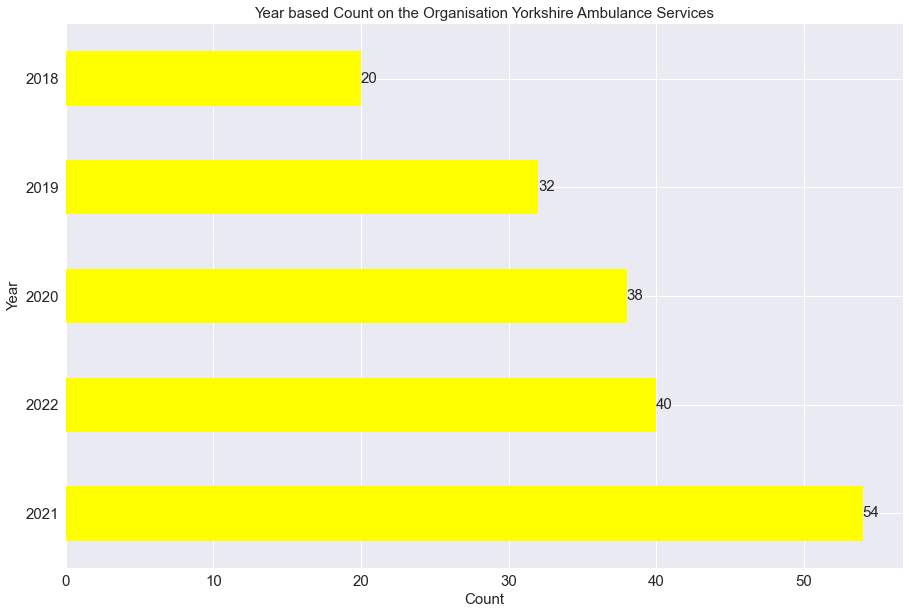

In [178]:
plt.figure(figsize=(15,10))
ax = Org_Ambulance['year'].value_counts().sort_values(ascending=False).plot.barh(color='yellow',fontsize=15)
ax.set_title('Year based Count on the Organisation Yorkshire Ambulance Services',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Year",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
#plt.title("Services count based on Organisation CCG")

[Text(0, 0, '27'),
 Text(0, 0, '22'),
 Text(0, 0, '21'),
 Text(0, 0, '17'),
 Text(0, 0, '16'),
 Text(0, 0, '16'),
 Text(0, 0, '14'),
 Text(0, 0, '12'),
 Text(0, 0, '12'),
 Text(0, 0, '11'),
 Text(0, 0, '11'),
 Text(0, 0, '5')]

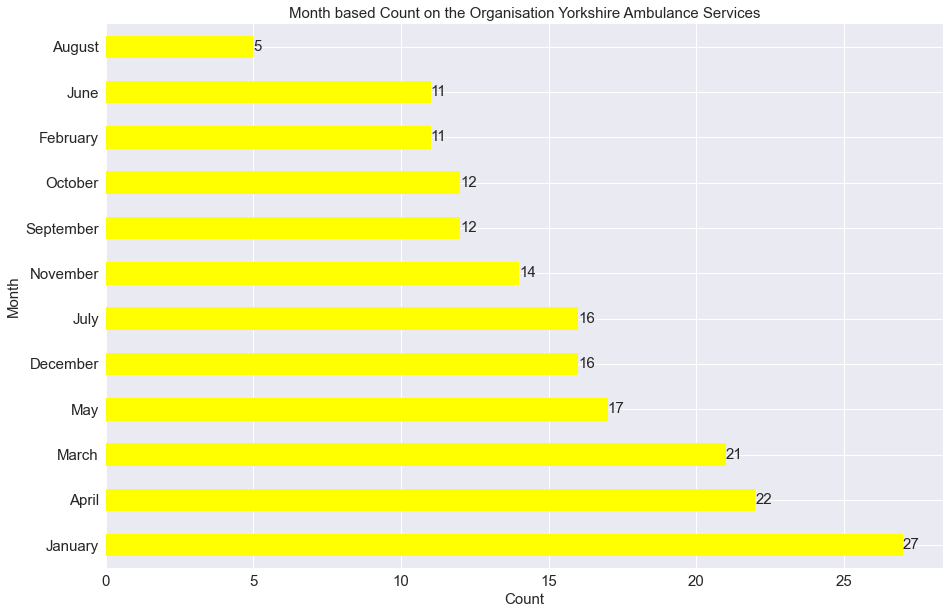

In [179]:
plt.figure(figsize=(15,10))
ax = Org_Ambulance['month'].value_counts().sort_values(ascending=False).plot.barh(color='yellow',fontsize=15)
ax.set_title('Month based Count on the Organisation Yorkshire Ambulance Services',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Month",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
#plt.title("Services count based on Organisation CCG")

[Text(0, 0, '84'),
 Text(0, 0, '49'),
 Text(0, 0, '23'),
 Text(0, 0, '13'),
 Text(0, 0, '10'),
 Text(0, 0, '4'),
 Text(0, 0, '1')]

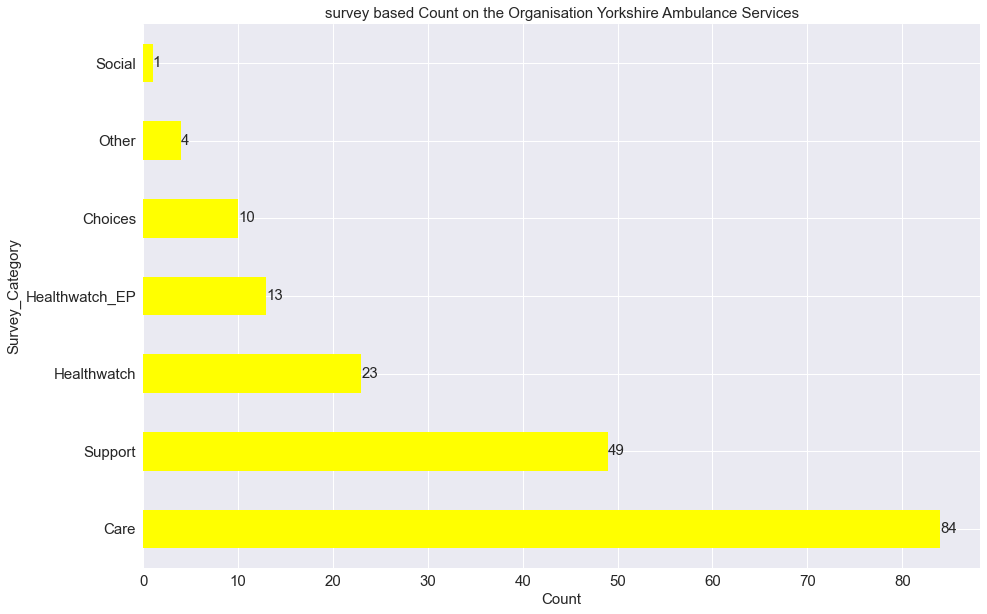

In [180]:
plt.figure(figsize=(15,10))
ax = Org_Ambulance['survey'].value_counts().sort_values(ascending=False).plot.barh(color='yellow',fontsize=15)
ax.set_title('survey based Count on the Organisation Yorkshire Ambulance Services',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Survey_Category",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
#plt.title("Services count based on Organisation CCG")

**Count for Organisation Eccleshill Treatment Care**

In [181]:
Org_ETC = df[df['organisation'].str.contains('Eccleshill')]

In [182]:
Org_ETC['organisation'].size

8

[Text(0, 0, '6'), Text(0, 0, '2')]

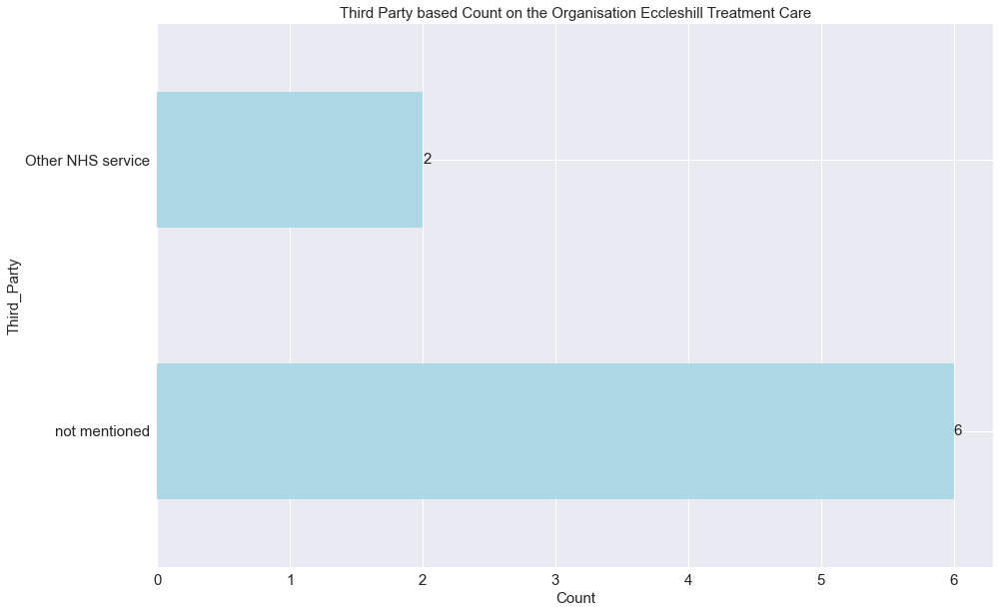

In [183]:
plt.figure(figsize=(15,10))
ax = Org_ETC['third_party'].value_counts().sort_values(ascending=False).plot.barh(color='lightblue',fontsize=15)
ax.set_title('Third Party based Count on the Organisation Eccleshill Treatment Care',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Third_Party",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
#plt.title("Services count based on Organisation CCG")

[Text(0, 0, '7'), Text(0, 0, '1')]

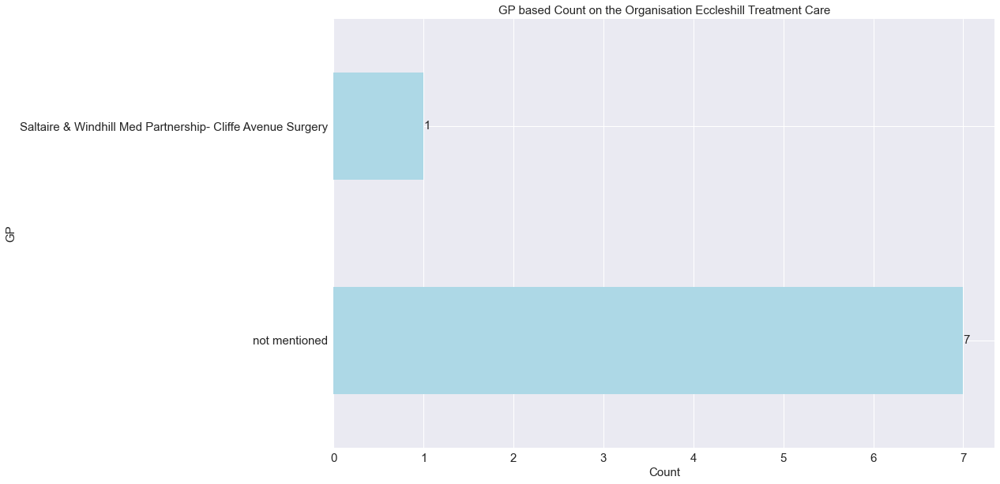

In [184]:
plt.figure(figsize=(15,10))
ax = Org_ETC['GP'].value_counts().sort_values(ascending=False).plot.barh(color='lightblue',fontsize=15)
ax.set_title('GP based Count on the Organisation Eccleshill Treatment Care',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("GP",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
#plt.title("Services count based on Organisation CCG")

[Text(0, 0, '3'),
 Text(0, 0, '2'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

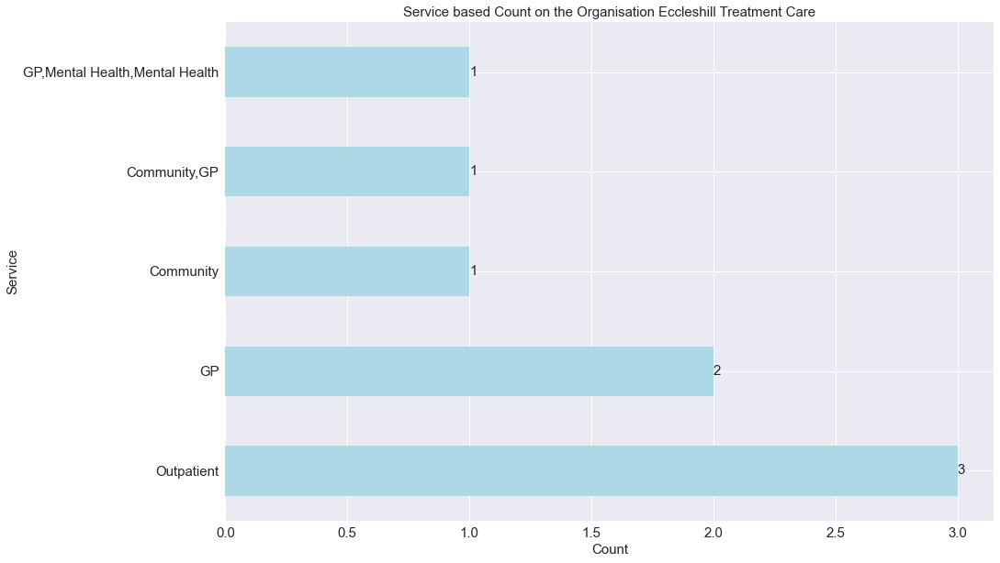

In [185]:
plt.figure(figsize=(15,10))
ax = Org_ETC['service'].value_counts().sort_values(ascending=False).plot.barh(color='lightblue',fontsize=15)
ax.set_title('Service based Count on the Organisation Eccleshill Treatment Care',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Service",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
#plt.title("Services count based on Organisation CCG")

[Text(0, 0, '2'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

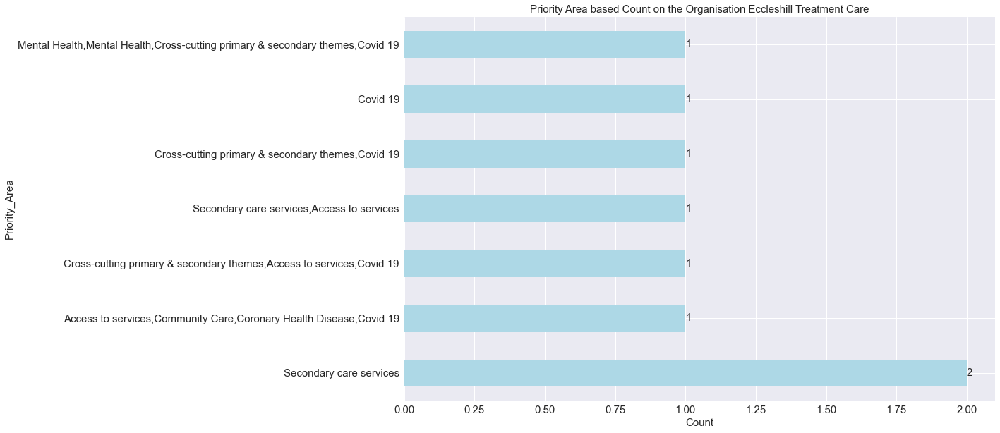

In [186]:
plt.figure(figsize=(15,10))
ax = Org_ETC['priority_area'].value_counts().sort_values(ascending=False).plot.barh(color='lightblue',fontsize=15)
ax.set_title('Priority Area based Count on the Organisation Eccleshill Treatment Care',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Priority_Area",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
#plt.title("Services count based on Organisation CCG")

[Text(0, 0, '7'), Text(0, 0, '1')]

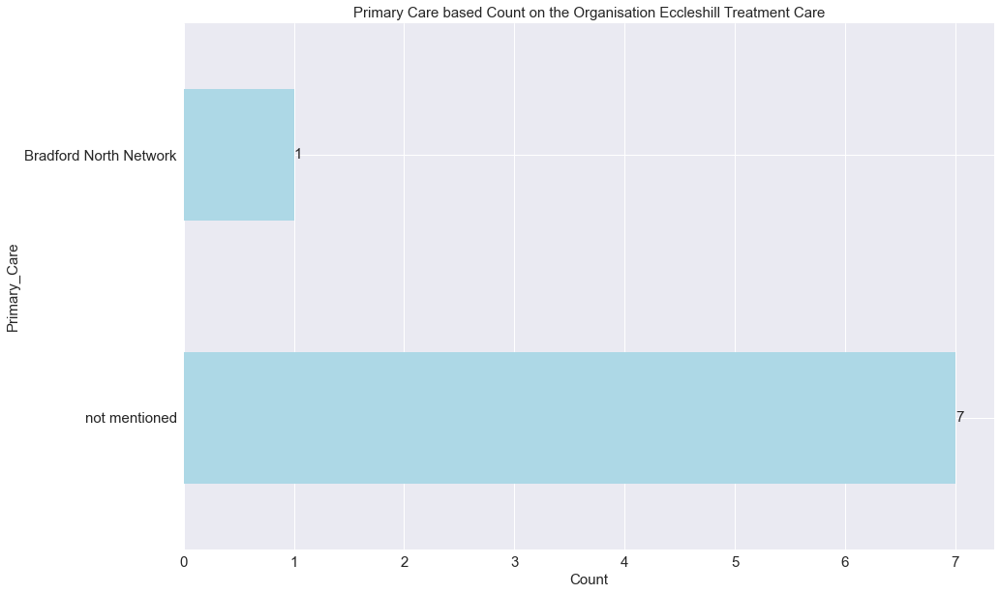

In [187]:
plt.figure(figsize=(15,10))
ax = Org_ETC['primary_care'].value_counts().sort_values(ascending=False).plot.barh(color='lightblue',fontsize=15)
ax.set_title('Primary Care based Count on the Organisation Eccleshill Treatment Care',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Primary_Care",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
#plt.title("Services count based on Organisation CCG")

[Text(0, 0, '4'), Text(0, 0, '2'), Text(0, 0, '1'), Text(0, 0, '1')]

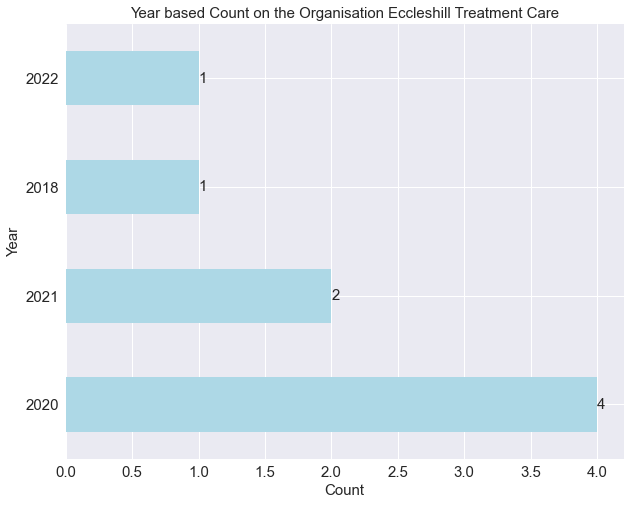

In [188]:
plt.figure(figsize=(10,8))
ax = Org_ETC['year'].value_counts().sort_values(ascending=False).plot.barh(color='lightblue',fontsize=15)
ax.set_title('Year based Count on the Organisation Eccleshill Treatment Care',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Year",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

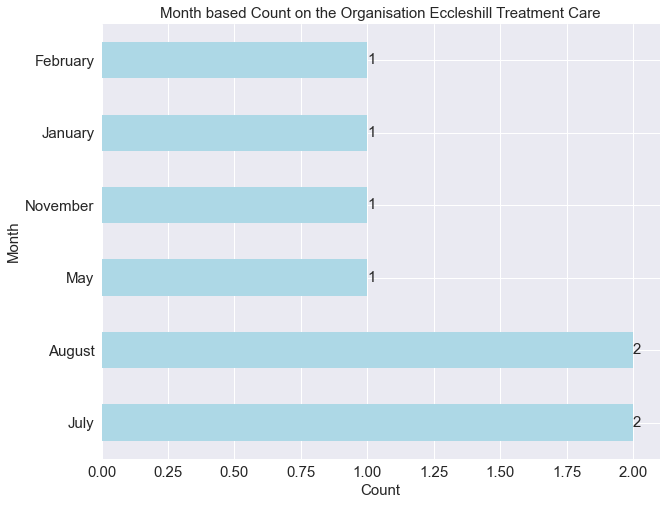

In [189]:
plt.figure(figsize=(10,8))
ax = Org_ETC['month'].value_counts().sort_values(ascending=False).plot.barh(color='lightblue',fontsize=15)
ax.set_title('Month based Count on the Organisation Eccleshill Treatment Care',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Month",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '4'), Text(0, 0, '2'), Text(0, 0, '2')]

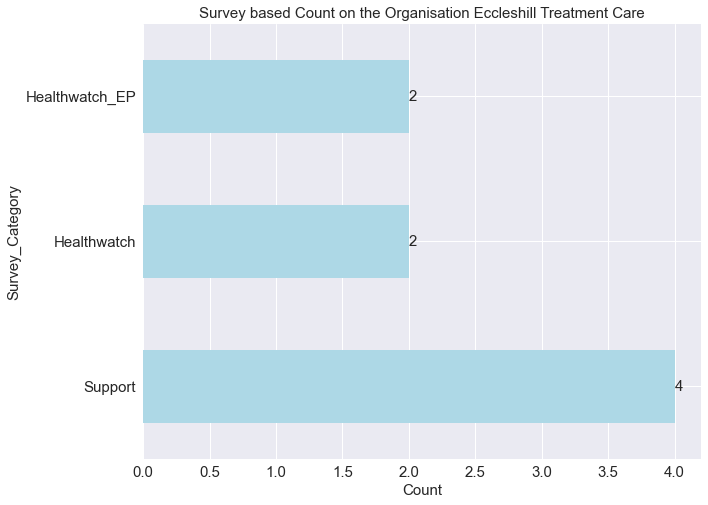

In [190]:
plt.figure(figsize=(10,8))
ax = Org_ETC['survey'].value_counts().sort_values(ascending=False).plot.barh(color='lightblue',fontsize=15)
ax.set_title('Survey based Count on the Organisation Eccleshill Treatment Care',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Survey_Category",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

**Count for Organisation Airedale Hospital**

In [191]:
Org_Airedale = df[df['organisation'].str.contains('Airedale')]

In [192]:
Org_Airedale['organisation'].count()

542

[Text(0, 0, '528'),
 Text(0, 0, '4'),
 Text(0, 0, '3'),
 Text(0, 0, '3'),
 Text(0, 0, '2'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

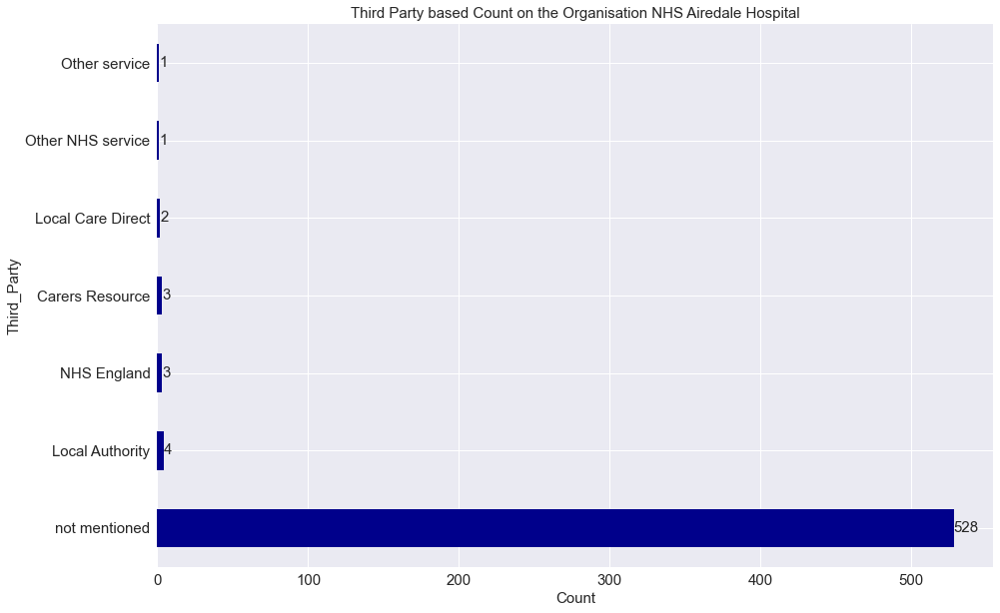

In [193]:
plt.figure(figsize=(15,10))
ax = Org_Airedale['third_party'].value_counts().sort_values(ascending=False).plot.barh(color='darkblue',fontsize=15)
ax.set_title('Third Party based Count on the Organisation NHS Airedale Hospital',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Third_Party",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '527'),
 Text(0, 0, '3'),
 Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

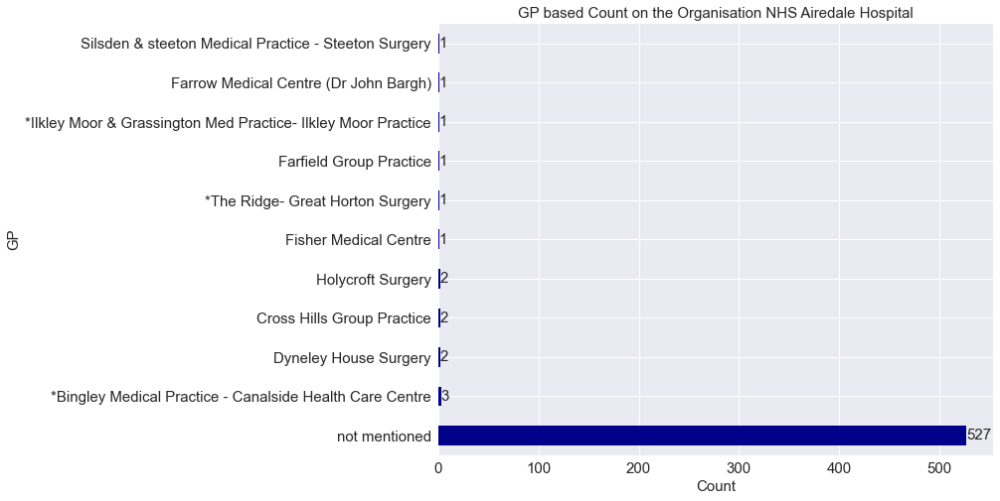

In [194]:
plt.figure(figsize=(10,8))
ax = Org_Airedale['GP'].value_counts().sort_values(ascending=False).plot.barh(color='darkblue',fontsize=15)
ax.set_title('GP based Count on the Organisation NHS Airedale Hospital',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("GP",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '142'),
 Text(0, 0, '102'),
 Text(0, 0, '83'),
 Text(0, 0, '74'),
 Text(0, 0, '20'),
 Text(0, 0, '13'),
 Text(0, 0, '11'),
 Text(0, 0, '10'),
 Text(0, 0, '7'),
 Text(0, 0, '5'),
 Text(0, 0, '4'),
 Text(0, 0, '4'),
 Text(0, 0, '4'),
 Text(0, 0, '4'),
 Text(0, 0, '3')]

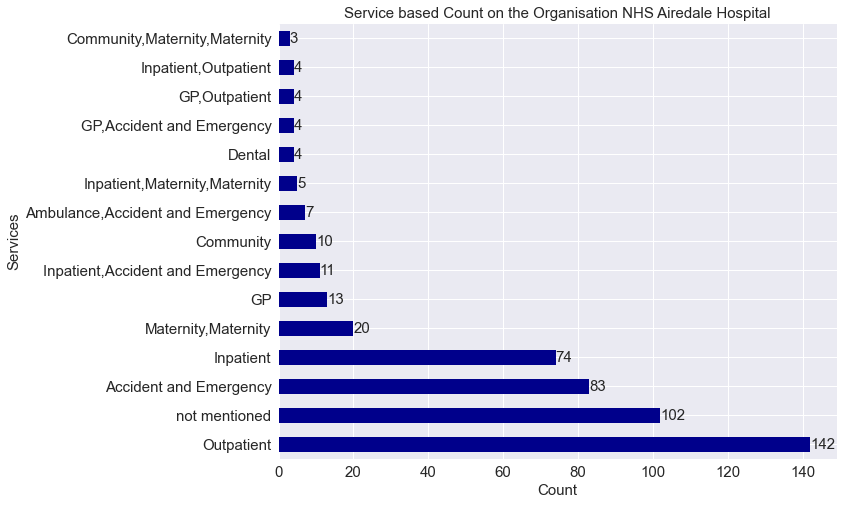

In [195]:
plt.figure(figsize=(10,8))
ax = Org_Airedale['service'].value_counts().sort_values(ascending=False).head(15).plot.barh(color='darkblue',fontsize=15)
ax.set_title('Service based Count on the Organisation NHS Airedale Hospital',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Services",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '218'),
 Text(0, 0, '44'),
 Text(0, 0, '21'),
 Text(0, 0, '21'),
 Text(0, 0, '15'),
 Text(0, 0, '12'),
 Text(0, 0, '11'),
 Text(0, 0, '10'),
 Text(0, 0, '9'),
 Text(0, 0, '9')]

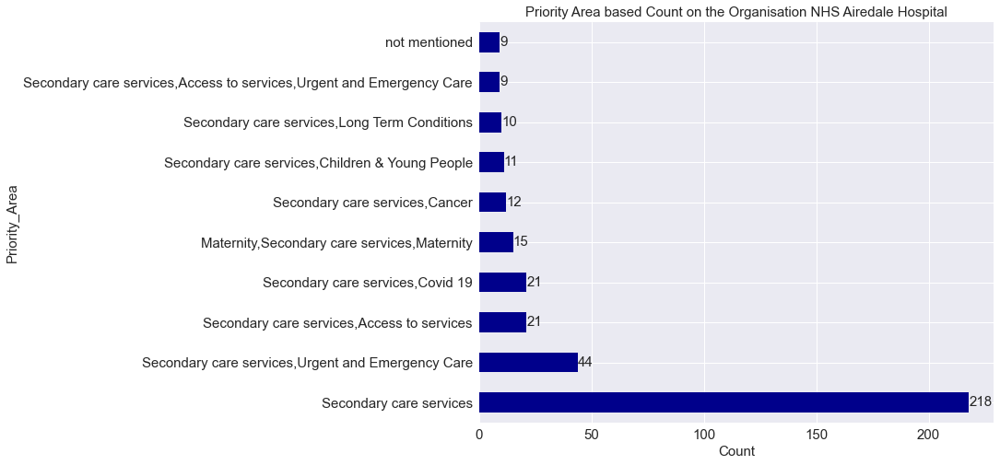

In [196]:
plt.figure(figsize=(10,8))
ax = Org_Airedale['priority_area'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='darkblue',fontsize=15)
ax.set_title('Priority Area based Count on the Organisation NHS Airedale Hospital',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Priority_Area",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '529'), Text(0, 0, '7'), Text(0, 0, '3'), Text(0, 0, '3')]

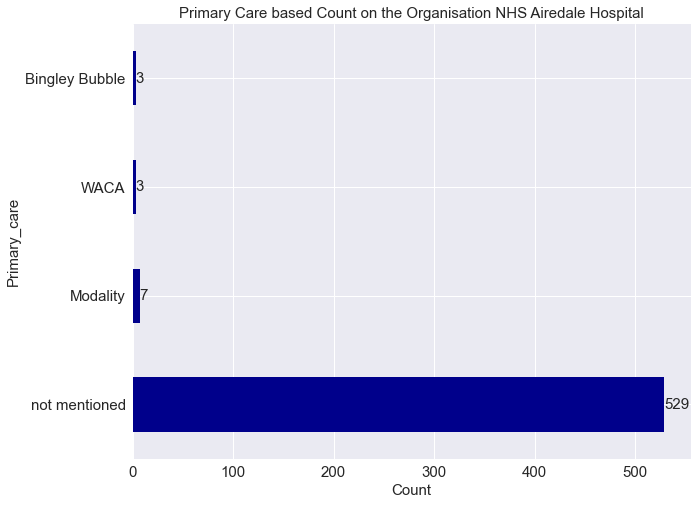

In [197]:
plt.figure(figsize=(10,8))
ax = Org_Airedale['primary_care'].value_counts().sort_values(ascending=False).plot.barh(color='darkblue',fontsize=15)
ax.set_title('Primary Care based Count on the Organisation NHS Airedale Hospital',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Primary_care",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '176'),
 Text(0, 0, '105'),
 Text(0, 0, '103'),
 Text(0, 0, '100'),
 Text(0, 0, '58')]

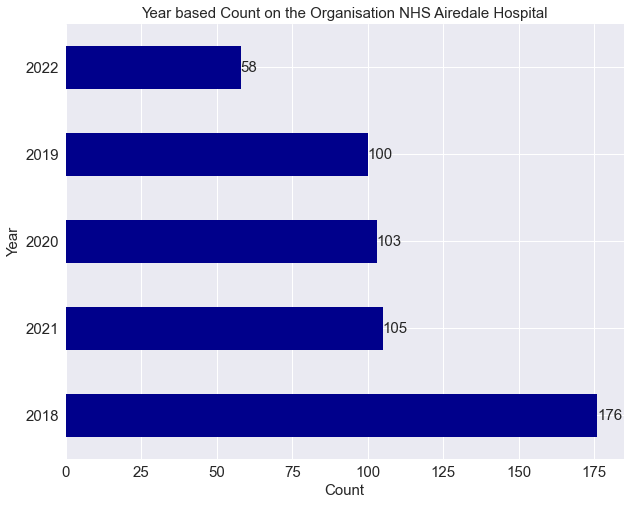

In [198]:
plt.figure(figsize=(10,8))
ax = Org_Airedale['year'].value_counts().sort_values(ascending=False).plot.barh(color='darkblue',fontsize=15)
ax.set_title('Year based Count on the Organisation NHS Airedale Hospital',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Year",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '56'),
 Text(0, 0, '56'),
 Text(0, 0, '52'),
 Text(0, 0, '51'),
 Text(0, 0, '51'),
 Text(0, 0, '46'),
 Text(0, 0, '46'),
 Text(0, 0, '42'),
 Text(0, 0, '40'),
 Text(0, 0, '35'),
 Text(0, 0, '35'),
 Text(0, 0, '32')]

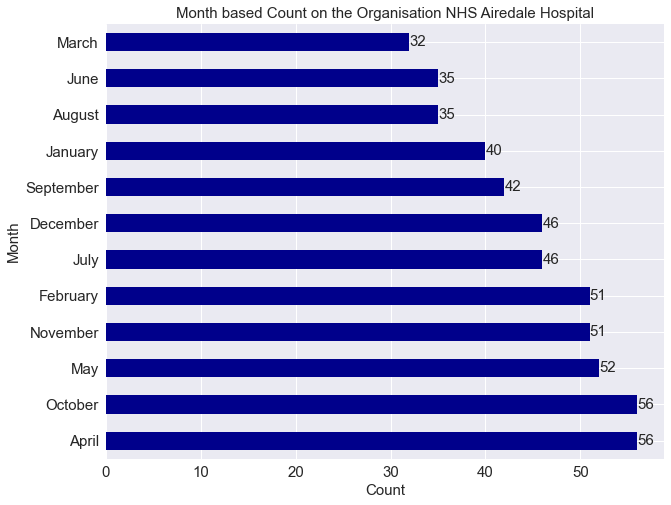

In [199]:
plt.figure(figsize=(10,8))
ax = Org_Airedale['month'].value_counts().sort_values(ascending=False).plot.barh(color='darkblue',fontsize=15)
ax.set_title('Month based Count on the Organisation NHS Airedale Hospital',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Month",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '242'),
 Text(0, 0, '106'),
 Text(0, 0, '74'),
 Text(0, 0, '61'),
 Text(0, 0, '42'),
 Text(0, 0, '14'),
 Text(0, 0, '3')]

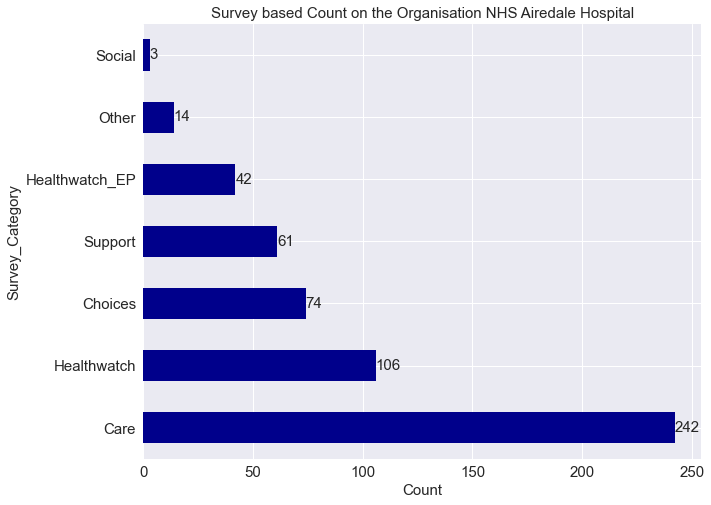

In [200]:
plt.figure(figsize=(10,8))
ax = Org_Airedale['survey'].value_counts().sort_values(ascending=False).plot.barh(color='darkblue',fontsize=15)
ax.set_title('Survey based Count on the Organisation NHS Airedale Hospital',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Survey_Category",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

**Count for Organisation Bradford District Care**

In [201]:
Org_District = df[df['organisation'].str.contains('District')]

In [202]:
Org_District['organisation'].count()

709

[Text(0, 0, '665'),
 Text(0, 0, '23'),
 Text(0, 0, '9'),
 Text(0, 0, '4'),
 Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

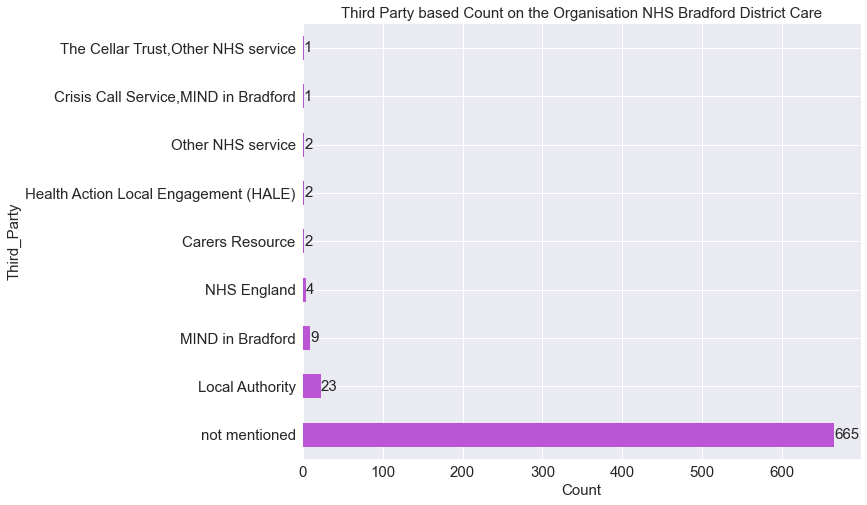

In [203]:
plt.figure(figsize=(10,8))
ax = Org_District['third_party'].value_counts().sort_values(ascending=False).plot.barh(color='mediumorchid',fontsize=15)
ax.set_title('Third Party based Count on the Organisation NHS Bradford District Care',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Third_Party",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '688'),
 Text(0, 0, '3'),
 Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

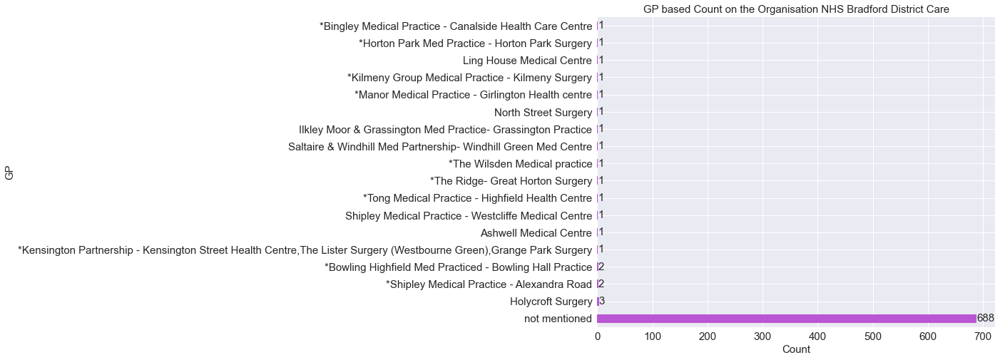

In [204]:
plt.figure(figsize=(10,8))
ax = Org_District['GP'].value_counts().sort_values(ascending=False).plot.barh(color='mediumorchid',fontsize=15)
ax.set_title('GP based Count on the Organisation NHS Bradford District Care',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("GP",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '384'),
 Text(0, 0, '94'),
 Text(0, 0, '39'),
 Text(0, 0, '36'),
 Text(0, 0, '29'),
 Text(0, 0, '20'),
 Text(0, 0, '17'),
 Text(0, 0, '10'),
 Text(0, 0, '9'),
 Text(0, 0, '9')]

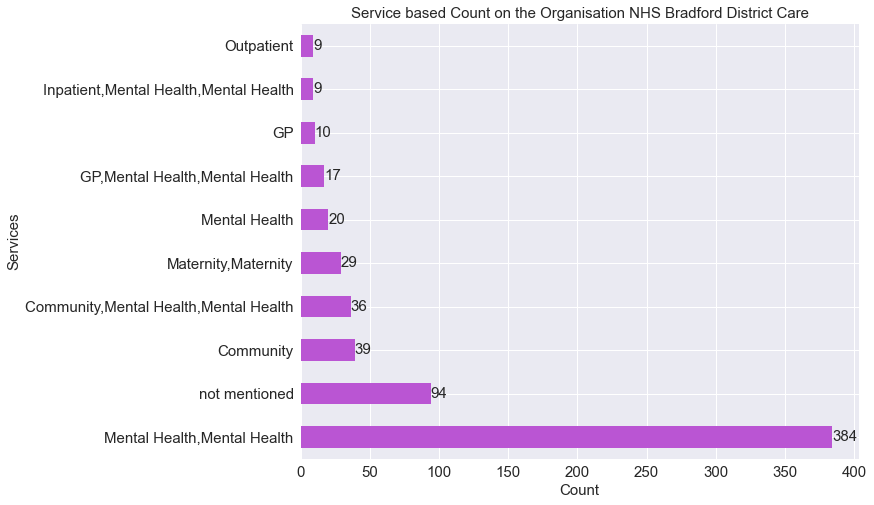

In [205]:
plt.figure(figsize=(10,8))
ax = Org_District['service'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='mediumorchid',fontsize=15)
ax.set_title('Service based Count on the Organisation NHS Bradford District Care',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Services",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '232'),
 Text(0, 0, '42'),
 Text(0, 0, '25'),
 Text(0, 0, '23'),
 Text(0, 0, '16'),
 Text(0, 0, '16'),
 Text(0, 0, '14'),
 Text(0, 0, '13'),
 Text(0, 0, '11'),
 Text(0, 0, '11')]

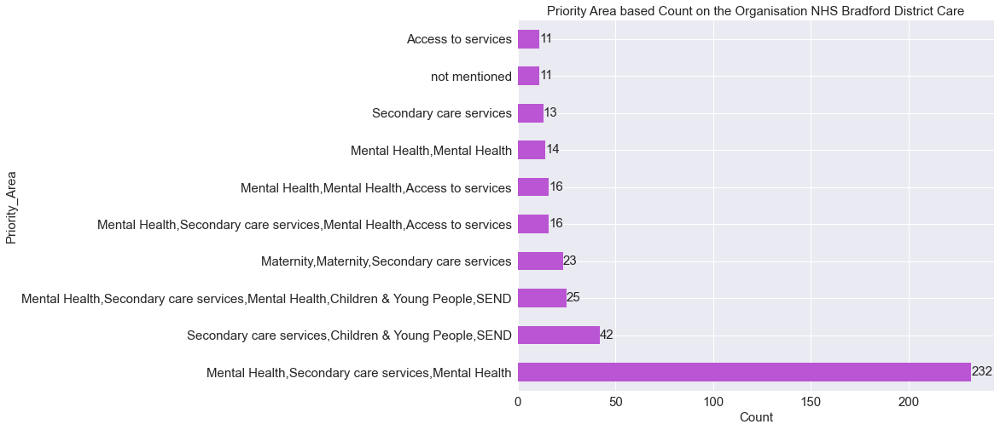

In [206]:
plt.figure(figsize=(10,8))
ax = Org_District['priority_area'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='mediumorchid',fontsize=15)
ax.set_title('Priority Area based Count on the Organisation NHS Bradford District Care',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Priority_Area",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '690'),
 Text(0, 0, '4'),
 Text(0, 0, '3'),
 Text(0, 0, '3'),
 Text(0, 0, '3'),
 Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

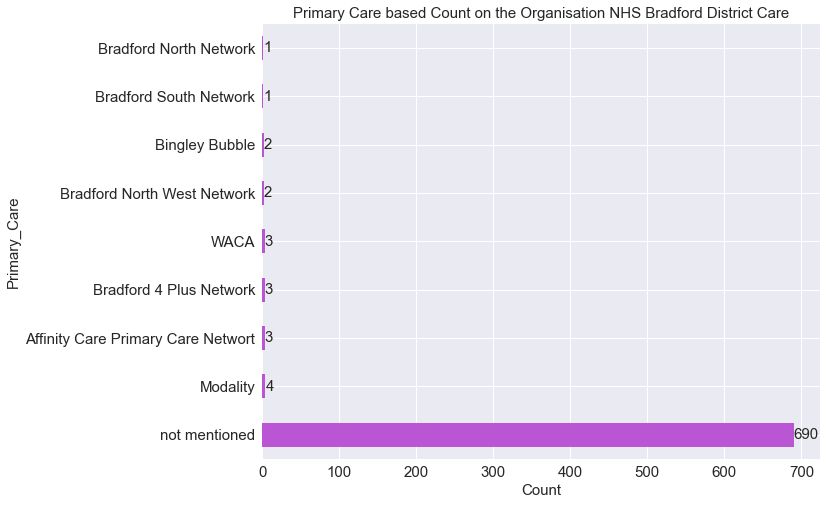

In [207]:
plt.figure(figsize=(10,8))
ax = Org_District['primary_care'].value_counts().sort_values(ascending=False).plot.barh(color='mediumorchid',fontsize=15)
ax.set_title('Primary Care based Count on the Organisation NHS Bradford District Care',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Primary_Care",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '337'),
 Text(0, 0, '168'),
 Text(0, 0, '108'),
 Text(0, 0, '62'),
 Text(0, 0, '34')]

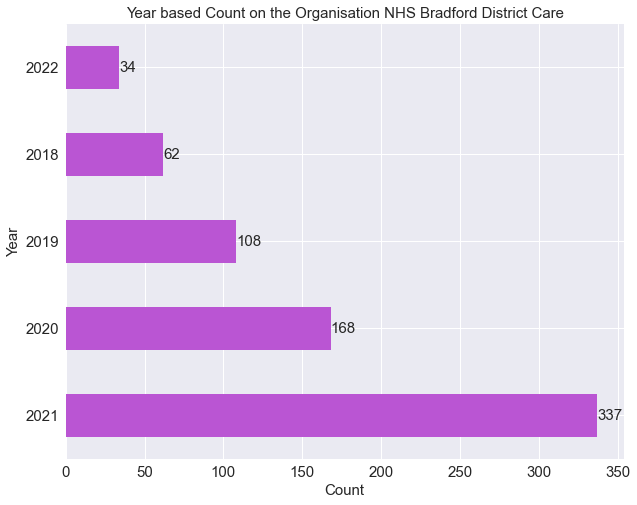

In [208]:
plt.figure(figsize=(10,8))
ax = Org_District['year'].value_counts().sort_values(ascending=False).plot.barh(color='mediumorchid',fontsize=15)
ax.set_title('Year based Count on the Organisation NHS Bradford District Care',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Year",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '299'),
 Text(0, 0, '59'),
 Text(0, 0, '57'),
 Text(0, 0, '54'),
 Text(0, 0, '52'),
 Text(0, 0, '35'),
 Text(0, 0, '30'),
 Text(0, 0, '29'),
 Text(0, 0, '29'),
 Text(0, 0, '26'),
 Text(0, 0, '24'),
 Text(0, 0, '15')]

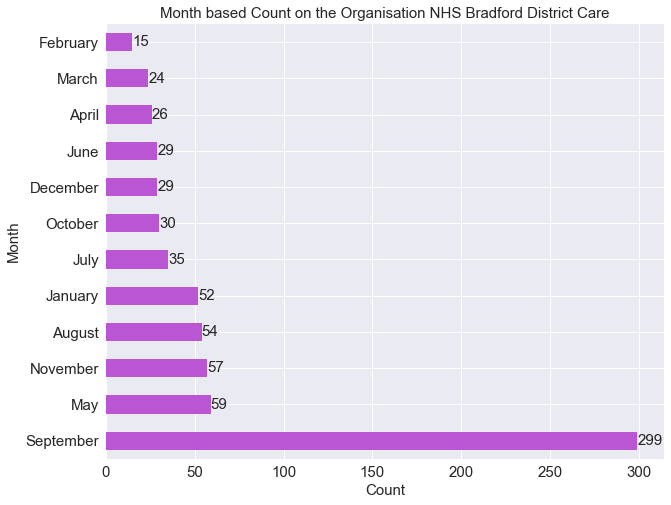

In [209]:
plt.figure(figsize=(10,8))
ax = Org_District['month'].value_counts().sort_values(ascending=False).plot.barh(color='mediumorchid',fontsize=15)
ax.set_title('Month based Count on the Organisation NHS Bradford District Care',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Month",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '356'),
 Text(0, 0, '166'),
 Text(0, 0, '90'),
 Text(0, 0, '67'),
 Text(0, 0, '14'),
 Text(0, 0, '10'),
 Text(0, 0, '5'),
 Text(0, 0, '1')]

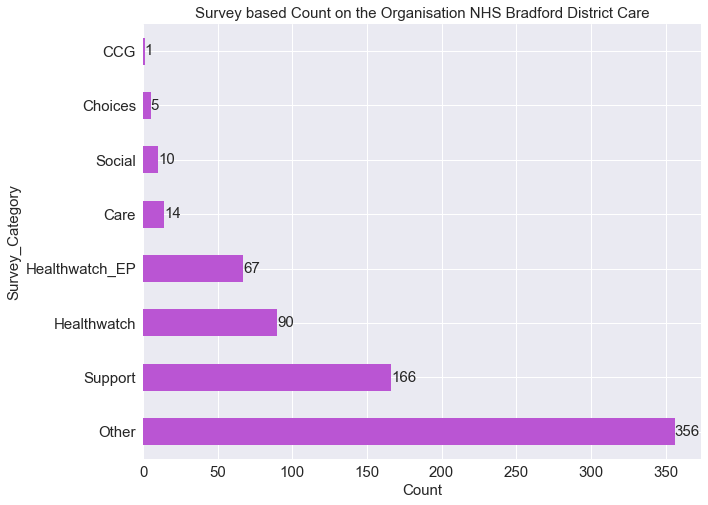

In [210]:
plt.figure(figsize=(10,8))
ax = Org_District['survey'].value_counts().sort_values(ascending=False).plot.barh(color='mediumorchid',fontsize=15)
ax.set_title('Survey based Count on the Organisation NHS Bradford District Care',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Survey_Category",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

**Count for Organisation Bradford Teaching Hospital**

In [211]:
Org_Teaching = df[df['organisation'].str.contains('Teaching')]

In [212]:
Org_Teaching['organisation'].count()

1165

[Text(0, 0, '354'),
 Text(0, 0, '281'),
 Text(0, 0, '250'),
 Text(0, 0, '185'),
 Text(0, 0, '95')]

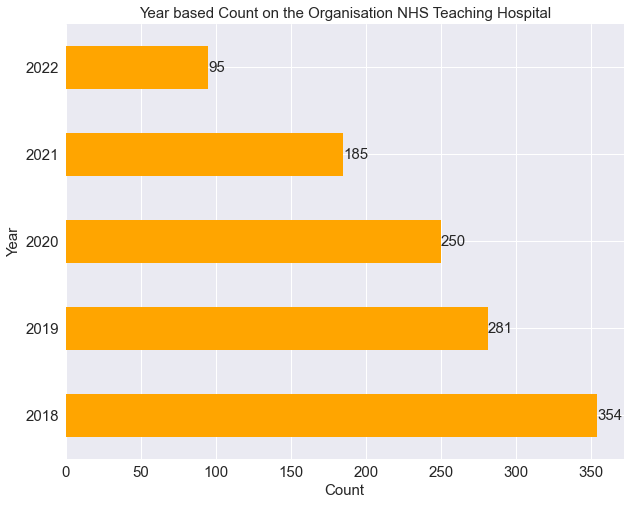

In [213]:
plt.figure(figsize=(10,8))
ax = Org_Teaching['year'].value_counts().sort_values(ascending=False).plot.barh(color='orange',fontsize=15)
ax.set_title('Year based Count on the Organisation NHS Teaching Hospital',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Year",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '203'),
 Text(0, 0, '116'),
 Text(0, 0, '113'),
 Text(0, 0, '111'),
 Text(0, 0, '110'),
 Text(0, 0, '107'),
 Text(0, 0, '88'),
 Text(0, 0, '82'),
 Text(0, 0, '75'),
 Text(0, 0, '61'),
 Text(0, 0, '50'),
 Text(0, 0, '49')]

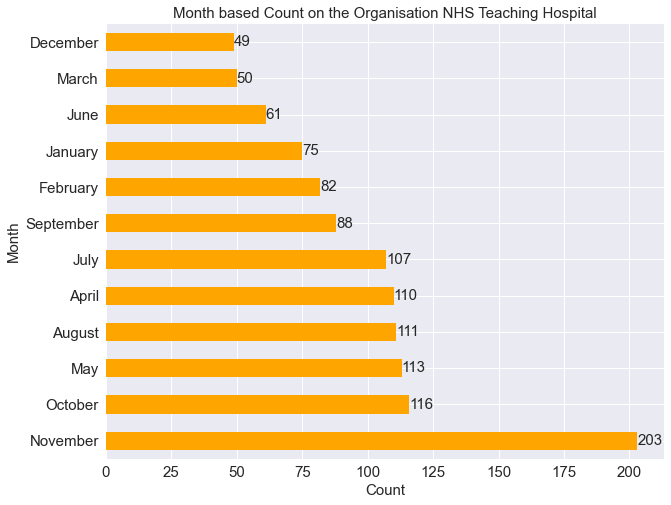

In [214]:
plt.figure(figsize=(10,8))
ax = Org_Teaching['month'].value_counts().sort_values(ascending=False).plot.barh(color='orange',fontsize=15)
ax.set_title('Month based Count on the Organisation NHS Teaching Hospital',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Month",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '1126'),
 Text(0, 0, '13'),
 Text(0, 0, '9'),
 Text(0, 0, '4'),
 Text(0, 0, '4'),
 Text(0, 0, '3'),
 Text(0, 0, '2'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

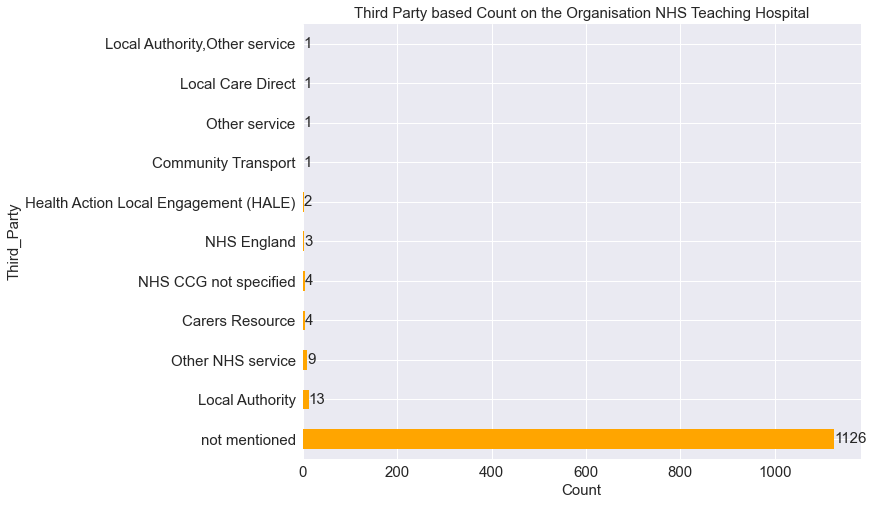

In [215]:
plt.figure(figsize=(10,8))
ax = Org_Teaching['third_party'].value_counts().sort_values(ascending=False).plot.barh(color='orange',fontsize=15)
ax.set_title('Third Party based Count on the Organisation NHS Teaching Hospital',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Third_Party",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '1127'),
 Text(0, 0, '3'),
 Text(0, 0, '3'),
 Text(0, 0, '3'),
 Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '1')]

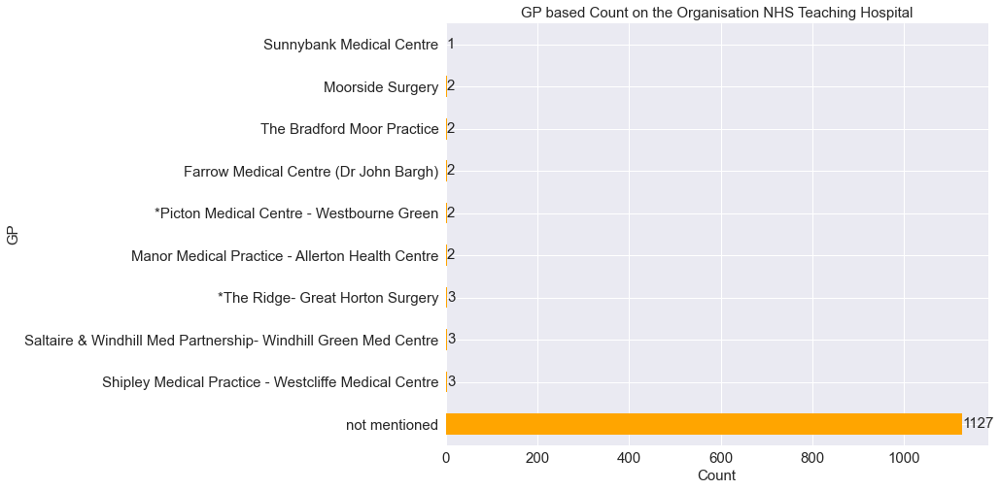

In [216]:
plt.figure(figsize=(10,8))
ax = Org_Teaching['GP'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='orange',fontsize=15)
ax.set_title('GP based Count on the Organisation NHS Teaching Hospital',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("GP",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '310'),
 Text(0, 0, '185'),
 Text(0, 0, '168'),
 Text(0, 0, '129'),
 Text(0, 0, '60'),
 Text(0, 0, '56'),
 Text(0, 0, '55'),
 Text(0, 0, '22'),
 Text(0, 0, '12'),
 Text(0, 0, '12')]

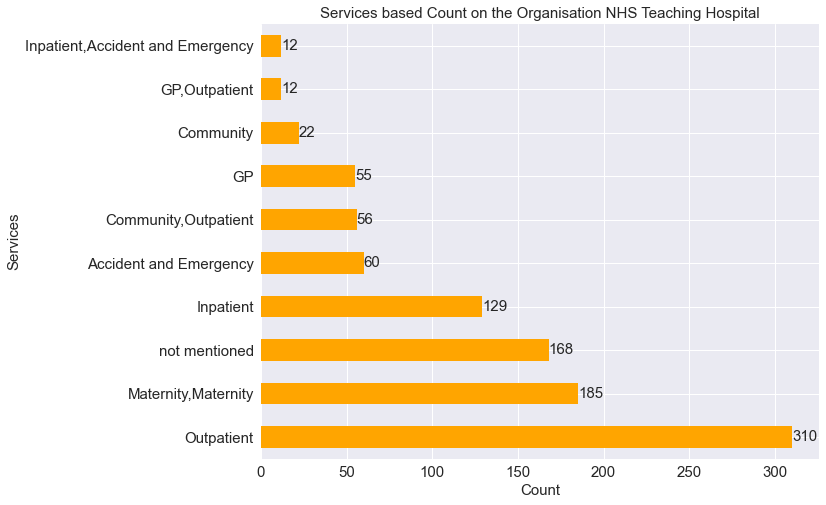

In [217]:
plt.figure(figsize=(10,8))
ax = Org_Teaching['service'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='orange',fontsize=15)
ax.set_title('Services based Count on the Organisation NHS Teaching Hospital',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Services",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '312'),
 Text(0, 0, '88'),
 Text(0, 0, '88'),
 Text(0, 0, '56'),
 Text(0, 0, '55'),
 Text(0, 0, '29'),
 Text(0, 0, '25'),
 Text(0, 0, '21'),
 Text(0, 0, '17'),
 Text(0, 0, '17')]

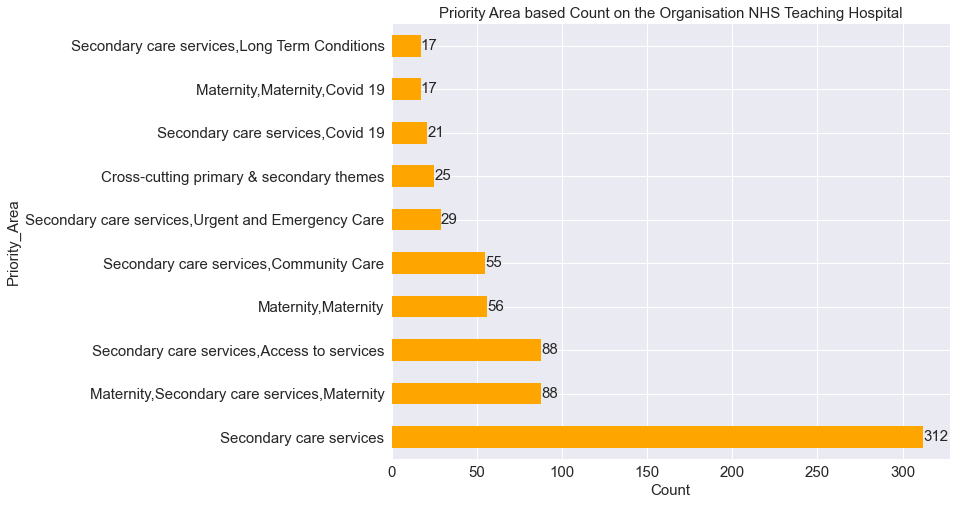

In [218]:
plt.figure(figsize=(10,8))
ax = Org_Teaching['priority_area'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='orange',fontsize=15)
ax.set_title('Priority Area based Count on the Organisation NHS Teaching Hospital',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Priority_Area",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '1132'),
 Text(0, 0, '5'),
 Text(0, 0, '5'),
 Text(0, 0, '5'),
 Text(0, 0, '4'),
 Text(0, 0, '4'),
 Text(0, 0, '3'),
 Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '1')]

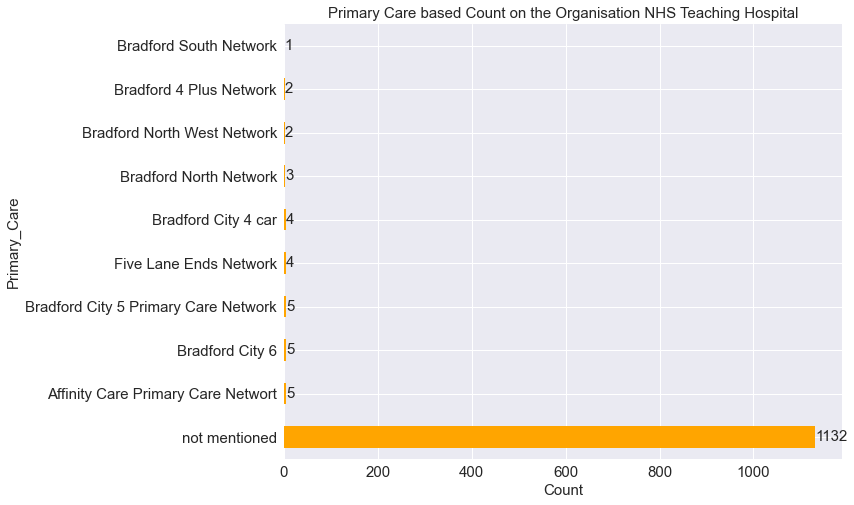

In [219]:
plt.figure(figsize=(10,8))
ax = Org_Teaching['primary_care'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='orange',fontsize=15)
ax.set_title('Primary Care based Count on the Organisation NHS Teaching Hospital',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Primary_Care",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '337'),
 Text(0, 0, '267'),
 Text(0, 0, '215'),
 Text(0, 0, '143'),
 Text(0, 0, '102'),
 Text(0, 0, '87'),
 Text(0, 0, '9'),
 Text(0, 0, '5')]

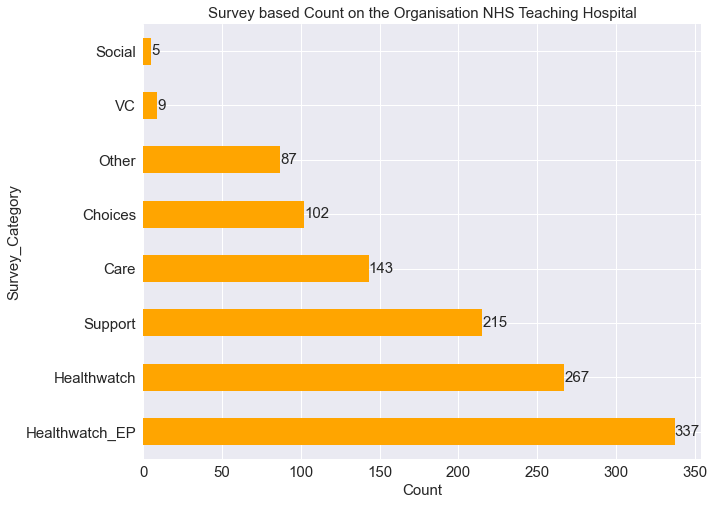

In [220]:
plt.figure(figsize=(10,8))
ax = Org_Teaching['survey'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='orange',fontsize=15)
ax.set_title('Survey based Count on the Organisation NHS Teaching Hospital',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Survey_Category",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

**Count for Organisation Optegra**

**Optegra has only one feedback so not proceeding with the data visualisation**

In [221]:
Org_Optegra = df[df['organisation'].str.contains('Optegra')]

In [222]:
Org_Optegra['organisation'].count()

1

**Count for Organisation The Yorkshire Clinic**

In [223]:
Org_YClinic = df[df['organisation'].str.contains('The Yorkshire clinic')]

In [224]:
Org_YClinic['organisation'].count()

105

[Text(0, 0, '35'),
 Text(0, 0, '33'),
 Text(0, 0, '19'),
 Text(0, 0, '15'),
 Text(0, 0, '3')]

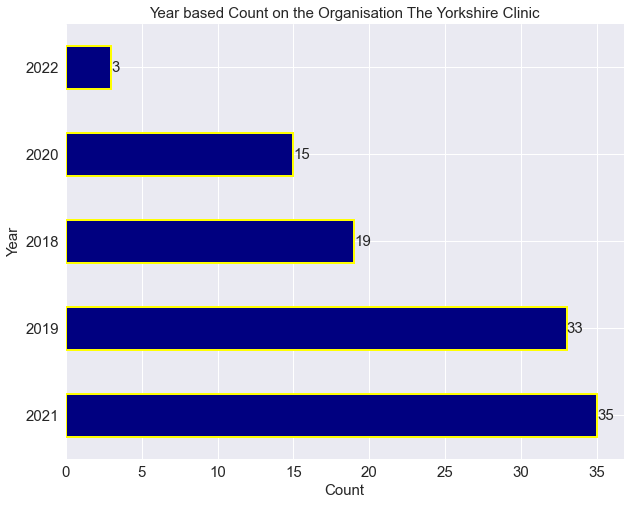

In [225]:
plt.figure(figsize=(10,8))
ax = Org_YClinic['year'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='navy',
                                                                                        fontsize=15,
                                                                                        edgecolor='yellow',
                                                                                        linewidth=2)
ax.set_title('Year based Count on the Organisation The Yorkshire Clinic',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Year",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '17'),
 Text(0, 0, '13'),
 Text(0, 0, '12'),
 Text(0, 0, '11'),
 Text(0, 0, '10'),
 Text(0, 0, '8'),
 Text(0, 0, '7'),
 Text(0, 0, '7'),
 Text(0, 0, '6'),
 Text(0, 0, '5')]

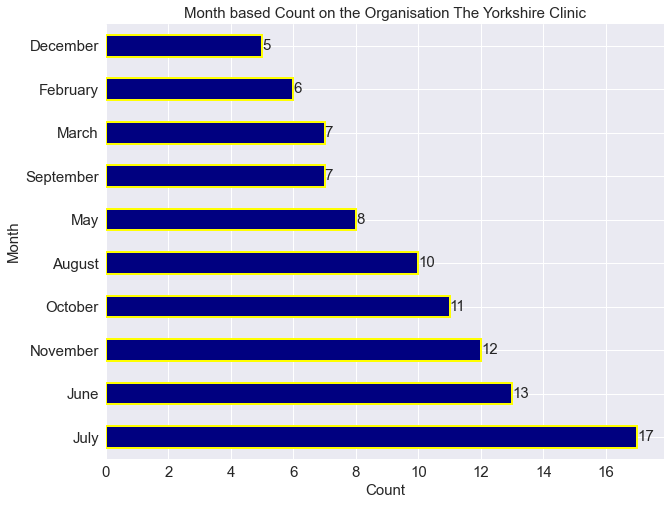

In [226]:
plt.figure(figsize=(10,8))
ax = Org_YClinic['month'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='navy',
                                                                                        fontsize=15,
                                                                                        edgecolor='yellow',
                                                                                        linewidth=2)
ax.set_title('Month based Count on the Organisation The Yorkshire Clinic',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Month",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '100'), Text(0, 0, '4'), Text(0, 0, '1')]

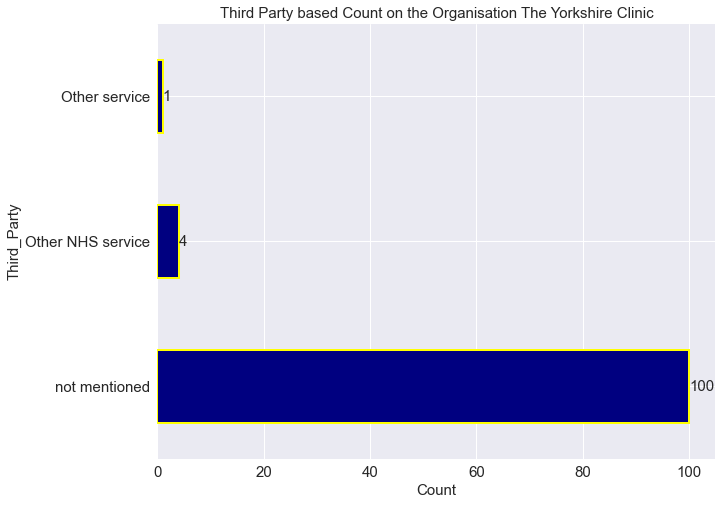

In [227]:
plt.figure(figsize=(10,8))
ax = Org_YClinic['third_party'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='navy',
                                                                                        fontsize=15,
                                                                                        edgecolor='yellow',
                                                                                        linewidth=2)
ax.set_title('Third Party based Count on the Organisation The Yorkshire Clinic',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Third_Party",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '95'),
 Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

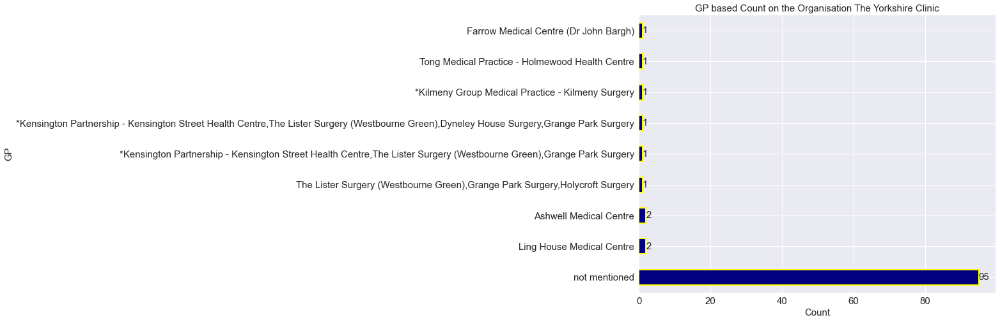

In [228]:
plt.figure(figsize=(10,8))
ax = Org_YClinic['GP'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='navy',
                                                                                        fontsize=15,
                                                                                        edgecolor='yellow',
                                                                                        linewidth=2)
ax.set_title('GP based Count on the Organisation The Yorkshire Clinic',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("GP",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '37'),
 Text(0, 0, '29'),
 Text(0, 0, '12'),
 Text(0, 0, '7'),
 Text(0, 0, '4'),
 Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

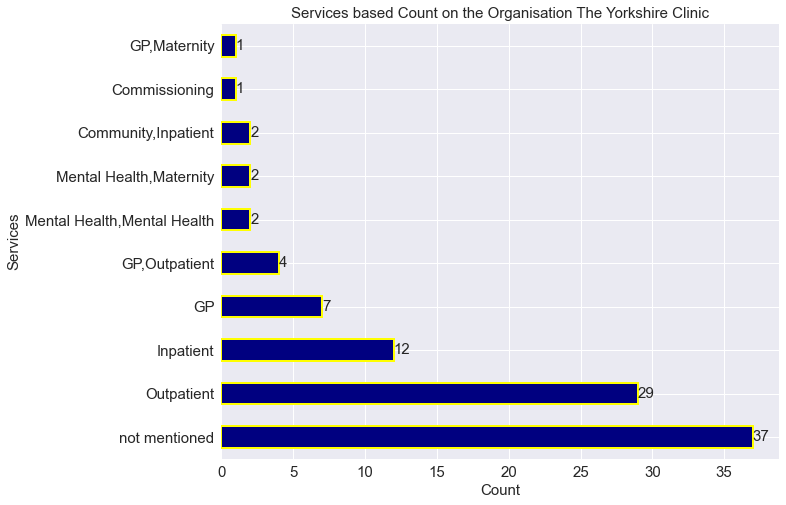

In [229]:
plt.figure(figsize=(10,8))
ax = Org_YClinic['service'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='navy',
                                                                                        fontsize=15,
                                                                                        edgecolor='yellow',
                                                                                        linewidth=2)
ax.set_title('Services based Count on the Organisation The Yorkshire Clinic',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Services",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '50'),
 Text(0, 0, '11'),
 Text(0, 0, '5'),
 Text(0, 0, '4'),
 Text(0, 0, '4'),
 Text(0, 0, '4'),
 Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '1')]

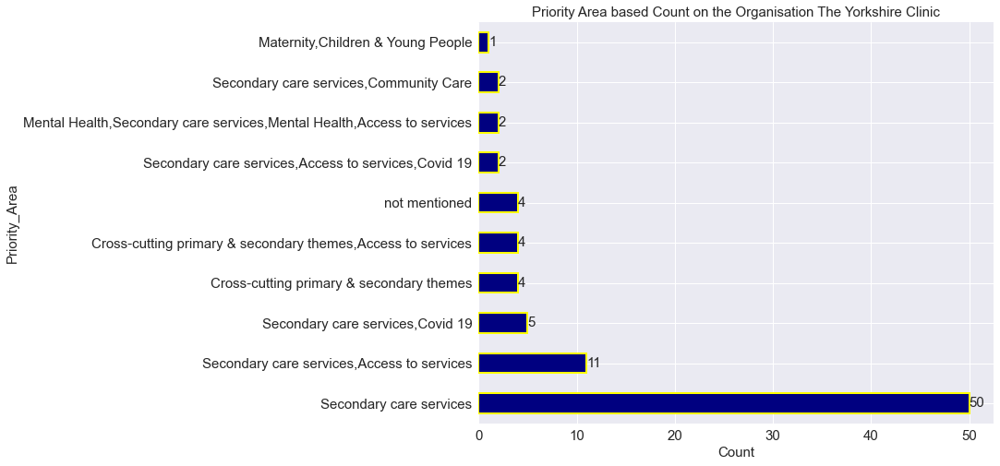

In [230]:
plt.figure(figsize=(10,8))
ax = Org_YClinic['priority_area'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='navy',
                                                                                        fontsize=15,
                                                                                        edgecolor='yellow',
                                                                                        linewidth=2)
ax.set_title('Priority Area based Count on the Organisation The Yorkshire Clinic',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Priority_Area",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '98'),
 Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

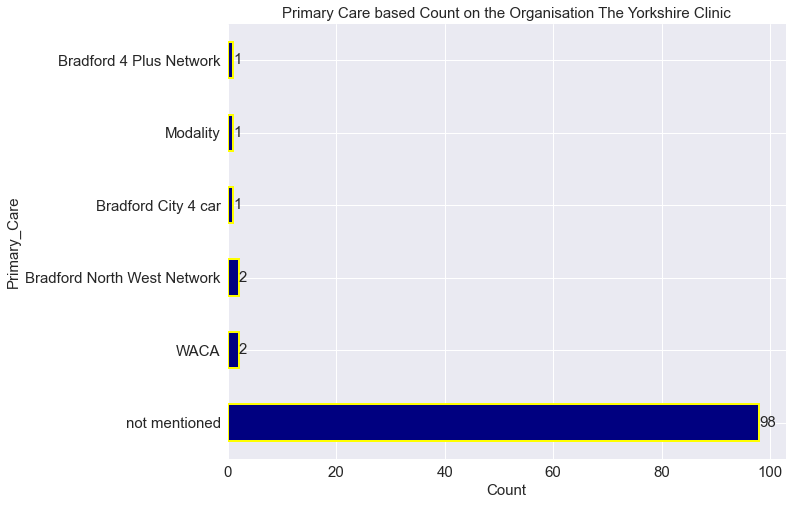

In [231]:
plt.figure(figsize=(10,8))
ax = Org_YClinic['primary_care'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='navy',
                                                                                        fontsize=15,
                                                                                        edgecolor='yellow',
                                                                                        linewidth=2)
ax.set_title('Primary Care based Count on the Organisation The Yorkshire Clinic',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Primary_Care",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '41'),
 Text(0, 0, '30'),
 Text(0, 0, '12'),
 Text(0, 0, '11'),
 Text(0, 0, '10'),
 Text(0, 0, '1')]

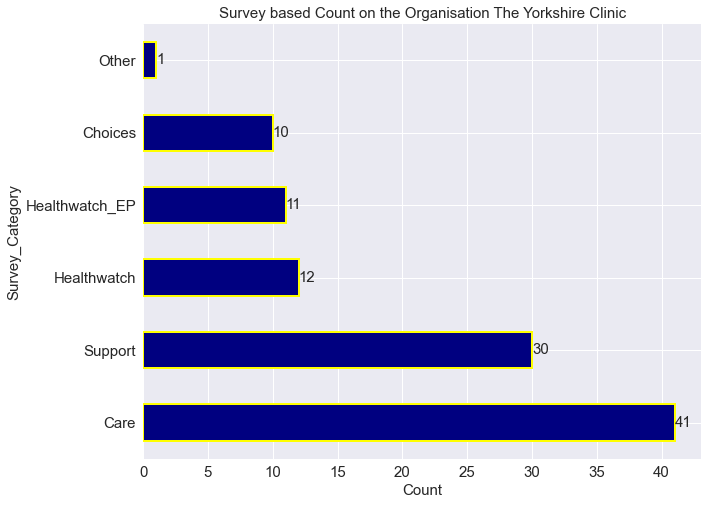

In [232]:
plt.figure(figsize=(10,8))
ax = Org_YClinic['survey'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='navy',
                                                                                        fontsize=15,
                                                                                        edgecolor='yellow',
                                                                                        linewidth=2)
ax.set_title('Survey based Count on the Organisation The Yorkshire Clinic',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Survey_Category",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

**Count for Organisation The Yorkshire Eye Clinic**

In [233]:
Org_EClinic = df[df['organisation'].str.contains('Yorkshire Eye clinic')]

In [234]:
Org_EClinic['organisation'].count()

7

[Text(0, 0, '2'), Text(0, 0, '2'), Text(0, 0, '2'), Text(0, 0, '1')]

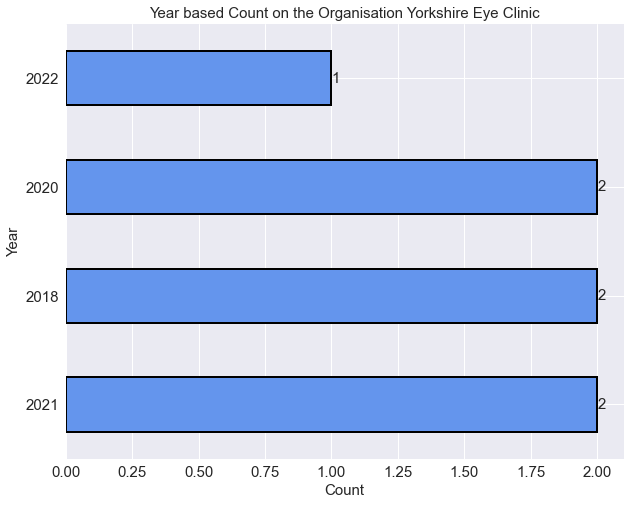

In [235]:
plt.figure(figsize=(10,8))
ax = Org_EClinic['year'].value_counts().sort_values(ascending=False).plot.barh(color='cornflowerblue',
                                                                                        fontsize=15,
                                                                                        edgecolor='black',
                                                                                        linewidth=2)
ax.set_title('Year based Count on the Organisation Yorkshire Eye Clinic',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Year",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '2'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

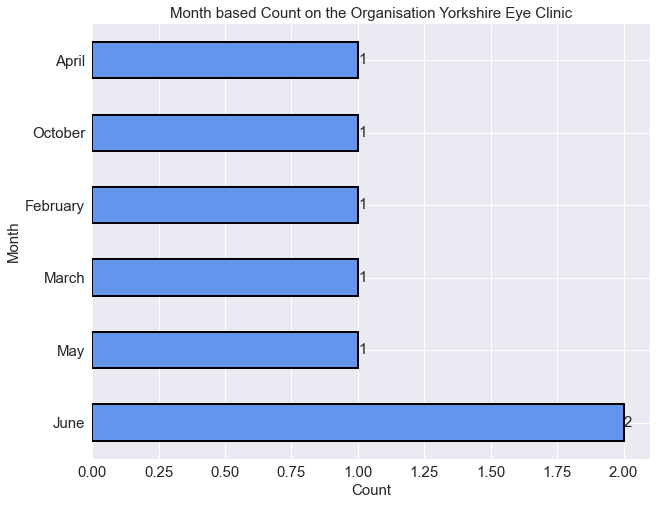

In [236]:
plt.figure(figsize=(10,8))
ax = Org_EClinic['month'].value_counts().sort_values(ascending=False).plot.barh(color='cornflowerblue',
                                                                                        fontsize=15,
                                                                                        edgecolor='black',
                                                                                        linewidth=2)
ax.set_title('Month based Count on the Organisation Yorkshire Eye Clinic',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Month",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '7')]

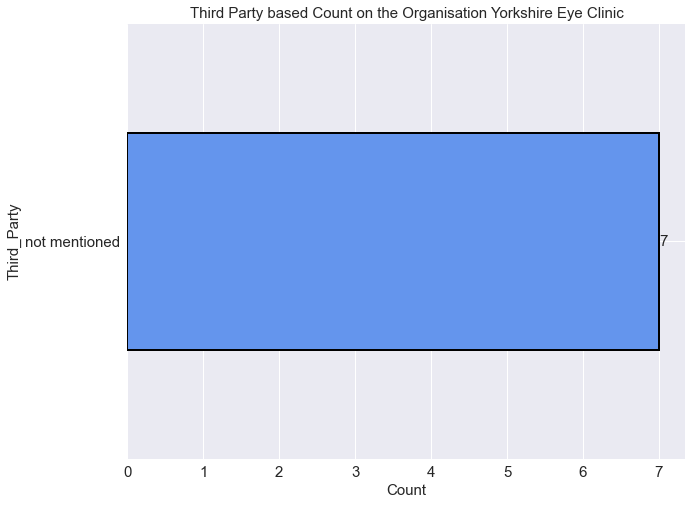

In [237]:
plt.figure(figsize=(10,8))
ax = Org_EClinic['third_party'].value_counts().sort_values(ascending=False).plot.barh(color='cornflowerblue',
                                                                                        fontsize=15,
                                                                                        edgecolor='black',
                                                                                        linewidth=2)
ax.set_title('Third Party based Count on the Organisation Yorkshire Eye Clinic',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Third_Party",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '4'), Text(0, 0, '1'), Text(0, 0, '1'), Text(0, 0, '1')]

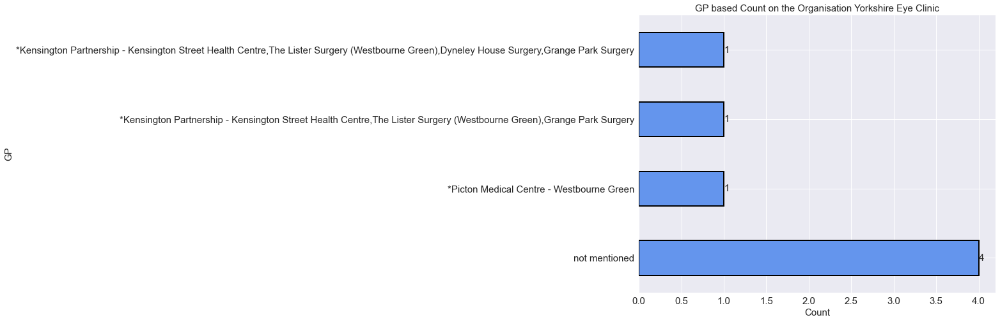

In [238]:
plt.figure(figsize=(10,8))
ax = Org_EClinic['GP'].value_counts().sort_values(ascending=False).plot.barh(color='cornflowerblue',
                                                                                        fontsize=15,
                                                                                        edgecolor='black',
                                                                                        linewidth=2)
ax.set_title('GP based Count on the Organisation Yorkshire Eye Clinic',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("GP",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '3'), Text(0, 0, '2'), Text(0, 0, '1'), Text(0, 0, '1')]

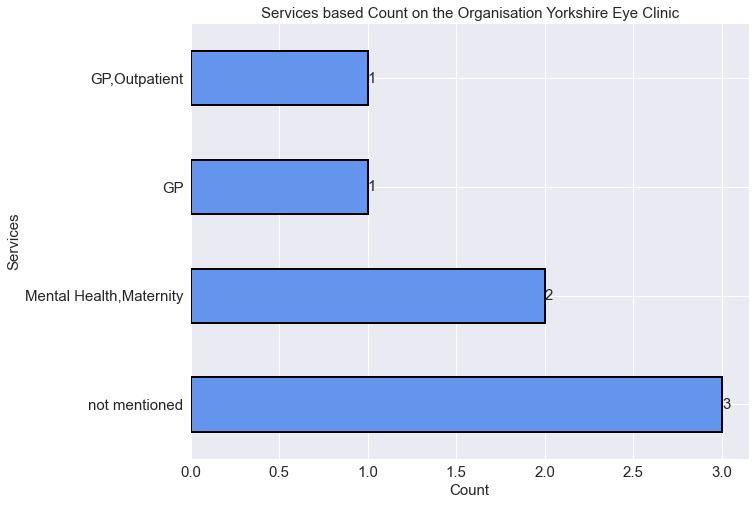

In [239]:
plt.figure(figsize=(10,8))
ax = Org_EClinic['service'].value_counts().sort_values(ascending=False).plot.barh(color='cornflowerblue',
                                                                                        fontsize=15,
                                                                                        edgecolor='black',
                                                                                        linewidth=2)
ax.set_title('Services based Count on the Organisation Yorkshire Eye Clinic',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Services",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '2'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

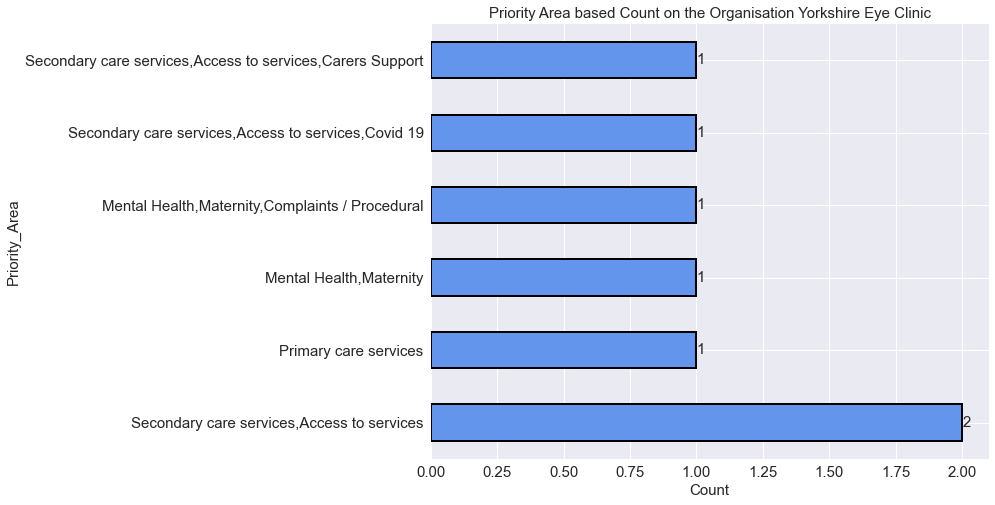

In [240]:
plt.figure(figsize=(10,8))
ax = Org_EClinic['priority_area'].value_counts().sort_values(ascending=False).plot.barh(color='cornflowerblue',
                                                                                        fontsize=15,
                                                                                        edgecolor='black',
                                                                                        linewidth=2)
ax.set_title('Priority Area based Count on the Organisation Yorkshire Eye Clinic',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Priority_Area",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '6'), Text(0, 0, '1')]

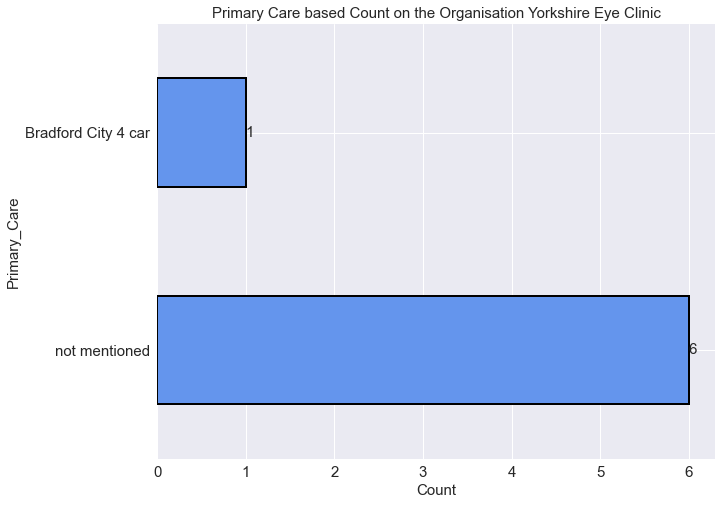

In [241]:
plt.figure(figsize=(10,8))
ax = Org_EClinic['primary_care'].value_counts().sort_values(ascending=False).plot.barh(color='cornflowerblue',
                                                                                        fontsize=15,
                                                                                        edgecolor='black',
                                                                                        linewidth=2)
ax.set_title('Primary Care based Count on the Organisation Yorkshire Eye Clinic',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Primary_Care",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '3'), Text(0, 0, '2'), Text(0, 0, '2')]

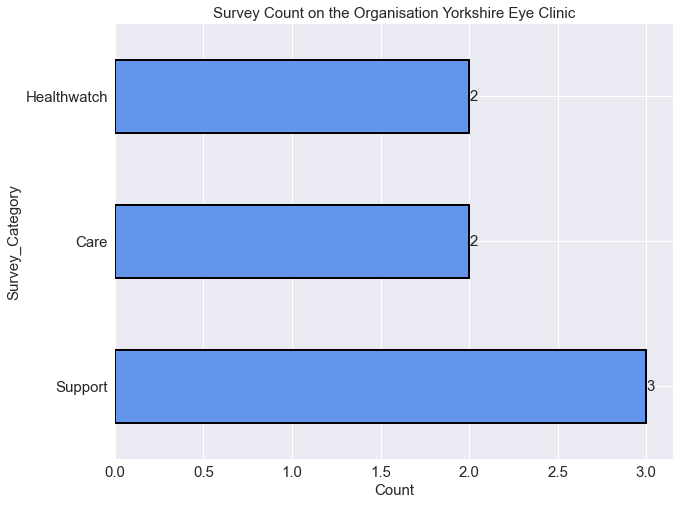

In [242]:
plt.figure(figsize=(10,8))
ax = Org_EClinic['survey'].value_counts().sort_values(ascending=False).plot.barh(color='cornflowerblue',
                                                                                        fontsize=15,
                                                                                        edgecolor='black',
                                                                                        linewidth=2)
ax.set_title('Survey Count on the Organisation Yorkshire Eye Clinic',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Survey_Category",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

# Text pre-processing

**Tokenization, POS tagging, Stopwords removal**

In [243]:
import nltk

In [244]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Muthaiya\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [245]:
from nltk.tokenize import word_tokenize

In [246]:
from nltk import pos_tag

In [247]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Muthaiya\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [248]:
from nltk.corpus import wordnet

# Choosing stopword technique

In [249]:
#dataframe found is for NHS Bradford CCG
found.shape

(3292, 13)

In [250]:
found.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3292 entries, 33 to 7500
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   date              3292 non-null   datetime64[ns]
 1   survey            3292 non-null   object        
 2   services          3292 non-null   object        
 3   patient_feedback  3292 non-null   object        
 4   year              3292 non-null   int64         
 5   month             3292 non-null   object        
 6   organisation      3292 non-null   object        
 7   third_party       3292 non-null   object        
 8   GP                3292 non-null   object        
 9   service           3292 non-null   object        
 10  priority_area     3292 non-null   object        
 11  primary_care      3292 non-null   object        
 12  cleaned_feedback  3292 non-null   object        
dtypes: datetime64[ns](1), int64(1), object(11)
memory usage: 360.1+ KB


In [251]:
CCG_words = [" ".join(text) for text in found['cleaned_feedback'].str.split(' ')]
CCG_words = " ".join(CCG_words)

In [252]:
len(CCG_words.split())

379384

In [253]:
len("hello Hi".split())

2

**NLTK - STOPWORDS**

In [254]:
from nltk.corpus import stopwords

In [255]:
words_normal = [word for word in CCG_words.split() if word not in stopwords.words('english')]
new_text_1 = " ".join(words_normal)
#print(new_text)
print("Old length: ", len(CCG_words))
print("New length: ", len(new_text_1))

Old length:  2044325
New length:  1281937


In [256]:
#from nltk.corpus import stopwords
sw_nltk = stopwords.words('english')
words_nltk = [word for word in CCG_words.split() if word.lower() not in sw_nltk]
new_text_4 = " ".join(words_nltk)
#print(new_text)
print("Old length: ", len(CCG_words))
print("New length: ", len(new_text_4))

Old length:  2044325
New length:  1281937


**SPACY - STOPWORDS**

In [257]:
#Add the below lines in anaconda prompt to load the spacy stopwords
#pip install https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-2.2.0/en_core_web_sm-2.2.0.tar.gz
#python -m spacy download en_core_web_sm

In [258]:
import spacy
#loading the english language small model of spacy
en = spacy.load('en_core_web_sm')
sw_spacy = en.Defaults.stop_words
#print(sw_spacy)

In [259]:
sample = 'I would love to travel and could see all natural scenes'

In [260]:
'i'.lower() in sw_spacy

True

In [261]:
words_spacy = [word for word in CCG_words.split() if word not in sw_spacy]
new_text_spacy = " ".join(words_spacy)
#print(new_text_spacy)
print("Old length: ", len(CCG_words))
print("New length: ", len(new_text_spacy))

Old length:  2044325
New length:  1140756


**GENSIM - STOPWORDS**

In [262]:
!pip install gensim‑2.3.0‑cp34‑cp34m‑win32.whl

ERROR: gensim\u20112.3.0\u2011cp34\u2011cp34m\u2011win32.whl is not a valid wheel filename.


In [263]:
!pip install -U gensim

In [264]:
import gensim
from gensim.parsing.preprocessing import remove_stopwords, STOPWORDS

In [265]:
words_gen = [remove_stopwords(word) for word in CCG_words.split()]
new_text_2 = " ".join(words_gen)
#print(new_text)
print("Old length: ", len(CCG_words))
print("New length: ", len(new_text_2))

Old length:  2044325
New length:  1361127


**SKLEARN - STOPWORDS**

In [266]:
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS

In [267]:
words_skl = [word for word in CCG_words.split() if word.lower() not in ENGLISH_STOP_WORDS]
new_text_3 = " ".join(words_skl)
#print(new_text)
print("Old length: ", len(CCG_words))
print("New length: ", len(new_text_3))

Old length:  2044325
New length:  1156394


**After compared different stopwords techniques from nltk,spacy,gensim, and sklearn . I could see the more stopwords removed when I use SPACY . So I prefer to use spacy to remove stopwords from the text**

# Cleaned feedback with out the stop words

In [268]:
#text = "The CAMHS service needs to be proactive and not reactive.  If they took this approach I feel there would be less issues"
def stop(text):
    words_test = " "
    words_test = [word for word in text.split() if word not in sw_spacy]
    new_test = " ".join(words_test)
    return new_test
#print(test_word)

#stop(text)

In [269]:
df['feedback_w/o_stopwords']= df['cleaned_feedback'].apply(stop)

In [270]:
df['feedback_w/o_stopwords'][7492]

'xxx service rude staff reception list best thing location'

# **Lemmatization**

In [271]:
def lem(text):
    lem = en(text)
    #if not en.vocab[token.text].is_stop:
    return " ".join([token.lemma_ for token in lem])

In [272]:
df['lemma'] = df['feedback_w/o_stopwords'].apply(lem)

# After adding the custom stop words

In [273]:
custom_stop_words = ['mil','xxx','mother','mum','daughter','lady','school','camhs','son','baby','january','june',
                     'august','tell','come','people','need','month','ask','day','l','wife','feel','want','know','year',
                     'work','try','week','talk']

In [274]:
stop_words = sw_spacy.union(custom_stop_words)

# Second round of stop word removal

In [275]:
def stop(text):
    words_test = " "
    words_test = [word for word in text.split() if word not in stop_words]
    new_test = " ".join(words_test)
    return new_test

In [276]:
df['lemma_w/o_custom_stopwords']= df['lemma'].apply(stop)

In [277]:
df['feedback_w/o_stopwords'][13]

'went ane triage nurse absolutely lovely went cubicle care received good standard best nurse remeber absolutely disrespectful poor student nurse working staff nurse arguing student nurse middle corridor telling looking student student absolutely fantastic care received better nurse working nhs clear breaches confidentiality staff nurse student clearly stated want continue arguing staff nurse raised voice lots poorly patients hear conversation needed unprofessional asked nurse charge approached nurse charge department ane talking staff nurse student exact words trusted patients unreliable talking student think poor management knowing students staff nurse wrong student jeopardise years student career pain listening honeslty broke heart heart goes student working attrocuious work place work place bullying tolerated'

In [278]:
df['lemma'][13]

'go ane triage nurse absolutely lovely go cubicle care receive good standard good nurse remeber absolutely disrespectful poor student nurse work staff nurse argue student nurse middle corridor tell look student student absolutely fantastic care receive well nurse work nhs clear breach confidentiality staff nurse student clearly state want continue argue staff nurse raise voice lot poorly patient hear conversation need unprofessional ask nurse charge approach nurse charge department ane talk staff nurse student exact word trust patient unreliable talking student think poor management know student staff nurse wrong student jeopardise year student career pain listening honeslty break heart heart go student work attrocuious work place work place bully tolerate'

In [279]:
df['lemma_w/o_custom_stopwords'][13]

'ane triage nurse absolutely lovely cubicle care receive good standard good nurse remeber absolutely disrespectful poor student nurse staff nurse argue student nurse middle corridor look student student absolutely fantastic care receive nurse nhs clear breach confidentiality staff nurse student clearly state continue argue staff nurse raise voice lot poorly patient hear conversation unprofessional nurse charge approach nurse charge department ane staff nurse student exact word trust patient unreliable talking student think poor management student staff nurse wrong student jeopardise student career pain listening honeslty break heart heart student attrocuious place place bully tolerate'

In [280]:
len(stop_words)

356

In [281]:
'ask' in stop_words

True

# creating wordcloud to check the words

In [282]:
from wordcloud import WordCloud,STOPWORDS,ImageColorGenerator

In [283]:
basic_words = [" ".join(text) for text in df['lemma_w/o_custom_stopwords'].str.split(' ')]
basic_words = " ".join(basic_words)

In [284]:
wordcloud = WordCloud(stopwords=stop_words,
              #mask=YC_mask,
              max_words=200,
              background_color="white",
              #contour_color="black",
              #contour_width=1,
              colormap="Dark2",
              #max_font_size=30
              ).generate(basic_words)

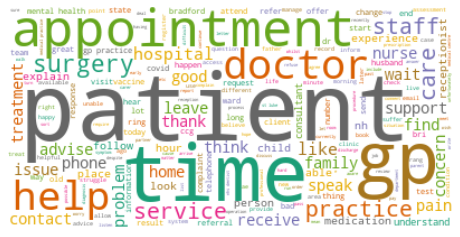

In [285]:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

# POS tagged dictionary

In [286]:
df.head()

,date,survey,services,patient_feedback,year,month,organisation,third_party,GP,service,priority_area,primary_care,cleaned_feedback,feedback_w/o_stopwords,lemma,lemma_w/o_custom_stopwords
0,2021-08-31,CCG,"NHS Bradford District Care Trust, Mental Heal...",The CAMHS service needs to be proactive and no...,2021,August,NHS Bradford District Care Trust,not mentioned,not mentioned,"Mental Health,Mental Health","Mental Health,Children & Young People,Mental H...",not mentioned,the camhs service needs to be proactive and no...,camhs service needs proactive reactive took ap...,camhs service need proactive reactive take app...,service proactive reactive approach issue
1,2018-04-03,Care,"Community, Inpatient, Secondary care services...","My Mother was in Airedale District hospital, b...",2018,April,NHS Airedale Hospital Foundation Trust,not mentioned,not mentioned,"Community,Inpatient",Secondary care services,not mentioned,my mother was in airedale district hospital bu...,mother airedale district hospital obvious near...,mother airedale district hospital obvious near...,airedale district hospital obvious nearing end...
2,2018-04-03,Care,"Inpatient, Secondary care services, NHS Aired...",I attended the emergency department at Airedal...,2018,April,NHS Airedale Hospital Foundation Trust,not mentioned,not mentioned,Inpatient,Secondary care services,not mentioned,i attended the emergency department at airedal...,attended emergency department airedale hospita...,attend emergency department airedale hospital ...,attend emergency department airedale hospital ...
3,2018-05-10,Care,"Ambulance, Inpatient, Secondary care services...",from 999 call and calming helpful operator to ...,2018,May,NHS Airedale Hospital Foundation Trust,not mentioned,not mentioned,"Ambulance,Inpatient",Secondary care services,not mentioned,from call and calming helpful operator to firs...,calming helpful operator responder ambulance s...,calm helpful operator responder ambulance staf...,calm helpful operator responder ambulance staf...
5,2018-07-03,Care,NHS Bradford Teaching Hospitals Foundation Tr...,I am currently 33 weeks and the service I have...,2018,July,NHS Bradford Teaching Hospitals Foundation Trust,not mentioned,not mentioned,"Inpatient,Maternity","Maternity,Secondary care services",not mentioned,i am currently weeks and the service i have re...,currently weeks service received bri amazing f...,currently week service receive bri amazing far...,currently service receive bri amazing far time...


In [287]:
df['cleaned_feedback'][0]

'the camhs service needs to be proactive and not reactive if they took this approach i feel there would be less issues'

In [288]:
def stop_pos(text):
    tags = en(text)
    newlist = []
    for token in tags:
        #if word not in set(stopwords.words('english')):
        if not en.vocab[token.text].is_stop:
            newlist.append(tuple([token.text,token.pos_]))
    return newlist

In [289]:
df['pos_tag'] = df['feedback_w/o_stopwords'].apply(stop_pos)

In [290]:
df.head()

,date,survey,services,patient_feedback,year,month,organisation,third_party,GP,service,priority_area,primary_care,cleaned_feedback,feedback_w/o_stopwords,lemma,lemma_w/o_custom_stopwords,pos_tag
0,2021-08-31,CCG,"NHS Bradford District Care Trust, Mental Heal...",The CAMHS service needs to be proactive and no...,2021,August,NHS Bradford District Care Trust,not mentioned,not mentioned,"Mental Health,Mental Health","Mental Health,Children & Young People,Mental H...",not mentioned,the camhs service needs to be proactive and no...,camhs service needs proactive reactive took ap...,camhs service need proactive reactive take app...,service proactive reactive approach issue,"[(camhs, NOUN), (service, NOUN), (needs, VERB)..."
1,2018-04-03,Care,"Community, Inpatient, Secondary care services...","My Mother was in Airedale District hospital, b...",2018,April,NHS Airedale Hospital Foundation Trust,not mentioned,not mentioned,"Community,Inpatient",Secondary care services,not mentioned,my mother was in airedale district hospital bu...,mother airedale district hospital obvious near...,mother airedale district hospital obvious near...,airedale district hospital obvious nearing end...,"[(mother, PROPN), (airedale, PROPN), (district..."
2,2018-04-03,Care,"Inpatient, Secondary care services, NHS Aired...",I attended the emergency department at Airedal...,2018,April,NHS Airedale Hospital Foundation Trust,not mentioned,not mentioned,Inpatient,Secondary care services,not mentioned,i attended the emergency department at airedal...,attended emergency department airedale hospita...,attend emergency department airedale hospital ...,attend emergency department airedale hospital ...,"[(attended, VERB), (emergency, NOUN), (departm..."
3,2018-05-10,Care,"Ambulance, Inpatient, Secondary care services...",from 999 call and calming helpful operator to ...,2018,May,NHS Airedale Hospital Foundation Trust,not mentioned,not mentioned,"Ambulance,Inpatient",Secondary care services,not mentioned,from call and calming helpful operator to firs...,calming helpful operator responder ambulance s...,calm helpful operator responder ambulance staf...,calm helpful operator responder ambulance staf...,"[(calming, VERB), (helpful, ADJ), (operator, N..."
5,2018-07-03,Care,NHS Bradford Teaching Hospitals Foundation Tr...,I am currently 33 weeks and the service I have...,2018,July,NHS Bradford Teaching Hospitals Foundation Trust,not mentioned,not mentioned,"Inpatient,Maternity","Maternity,Secondary care services",not mentioned,i am currently weeks and the service i have re...,currently weeks service received bri amazing f...,currently week service receive bri amazing far...,currently service receive bri amazing far time...,"[(currently, ADV), (weeks, VERB), (service, NO..."


In [291]:
df['pos_tag'][7492]

[('xxx', 'PROPN'),
 ('service', 'PROPN'),
 ('rude', 'ADJ'),
 ('staff', 'NOUN'),
 ('reception', 'NOUN'),
 ('list', 'NOUN'),
 ('best', 'ADJ'),
 ('thing', 'NOUN'),
 ('location', 'NOUN')]

In [292]:
#df.drop('pos_tagged',axis=1,inplace=True)

In [293]:
df['lemma_w/o_custom_stopwords'][7492]

'service rude staff reception list good thing location'

In [294]:
df['patient_feedback'][7492]

'xxx service, rude staff at the reception, and the list can go on...only best thing is location'

# WordCloud

In [295]:
from wordcloud import WordCloud,STOPWORDS,ImageColorGenerator

In [296]:
import PIL.Image

In [297]:
from PIL import Image

In [298]:
CCG_Cloud = df[df['organisation'].str.contains('NHS Bradford CCG')]
ETC_cloud = df[df['organisation'].str.contains('Eccleshill Treatment Centre')]
Airedale_Cloud = df[df['organisation'].str.contains('NHS Airedale Hospital Foundation Trust')]
District_Cloud = df[df['organisation'].str.contains('NHS Bradford District Care Trust')]
Teaching_Cloud = df[df['organisation'].str.contains('NHS Bradford Teaching Hospitals Foundation Trust')]
Optegra_Cloud = df[df['organisation'].str.contains('Optegra')]
YClinic_Cloud = df[df['organisation'].str.contains('The Yorkshire clinic')]
Ambulance_Cloud = df[df['organisation'].str.contains('Yorkshire Ambulance Services')]
EClinic_Cloud = df[df['organisation'].str.contains('Yorkshire Eye clinic')]

In [299]:
CCG_words = [" ".join(text) for text in CCG_Cloud['lemma_w/o_custom_stopwords'].str.split(' ')]
CCG_words = " ".join(CCG_words)

In [300]:
ETC_words = [" ".join(text) for text in ETC_cloud['lemma_w/o_custom_stopwords'].str.split(' ')]
ETC_words = " ".join(ETC_words)

In [301]:
Airedale_words = [" ".join(text) for text in Airedale_Cloud['lemma_w/o_custom_stopwords'].str.split(' ')]
Airedale_words = " ".join(Airedale_words)

In [302]:
District_words = [" ".join(text) for text in District_Cloud['lemma_w/o_custom_stopwords'].str.split(' ')]
District_words = " ".join(District_words)

In [303]:
Teaching_words = [" ".join(text) for text in Teaching_Cloud['lemma_w/o_custom_stopwords'].str.split(' ')]
Teaching_words = " ".join(Teaching_words)

In [304]:
opt_words = [" ".join(text) for text in Optegra_Cloud['lemma_w/o_custom_stopwords'].str.split(' ')]
opt_words = " ".join(opt_words)

In [305]:
YClinic_words = [" ".join(text) for text in YClinic_Cloud['lemma_w/o_custom_stopwords'].str.split(' ')]
YClinic_words = " ".join(YClinic_words)

In [306]:
Ambulance_words = [" ".join(text) for text in Ambulance_Cloud['lemma_w/o_custom_stopwords'].str.split(' ')]
Ambulance_words = " ".join(Ambulance_words)

In [307]:
EClinic_words = [" ".join(text) for text in EClinic_Cloud['lemma_w/o_custom_stopwords'].str.split(' ')]
EClinic_words = " ".join(EClinic_words)

In [308]:
comment_mask = np.array(Image.open("C:\\Users\\Muthaiya\\OneDrive\\Desktop\\comment.png"))

In [309]:
comment_mask

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [310]:
def transform_format(val):
    if val == 0:
        return 255
    else:
        return val

In [311]:
transformed_comment_mask = np.ndarray((comment_mask.shape[0],comment_mask.shape[1]), np.int32)

In [312]:
for i in range(len(comment_mask)):
    transformed_comment_mask[i] = list(map(transform_format, comment_mask[i]))

In [313]:
transformed_comment_mask

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]])

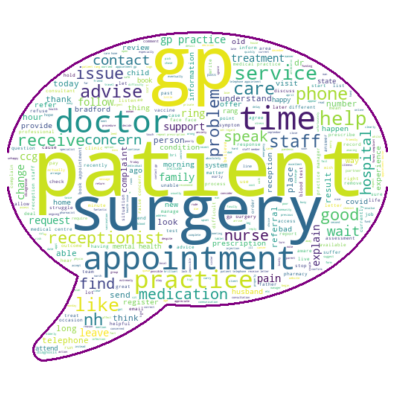

In [314]:
wc_spacy = WordCloud(background_color="white", max_words=1000, mask=transformed_comment_mask,
               stopwords=stop_words,contour_width=3, contour_color='purple')

# Generate a wordcloud
wc_spacy.generate(CCG_words)

# store to file
#wc.to_file("img/wine.png")

# show
plt.figure(figsize=[10,7])
plt.imshow(wc_spacy, interpolation='bilinear')
plt.axis("off")
plt.show()

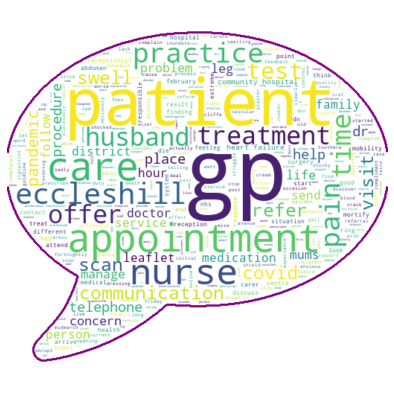

In [315]:
wc_spacy_ETC = WordCloud(background_color="white", max_words=1000, mask=transformed_comment_mask,
               stopwords=stop_words,contour_width=3, contour_color='purple')

# Generate a wordcloud
wc_spacy_ETC.generate(ETC_words)

# store to file
#wc.to_file("img/wine.png")

# show
plt.figure(figsize=[10,7])
plt.imshow(wc_spacy_ETC, interpolation='bilinear')
plt.axis("off")
plt.show()

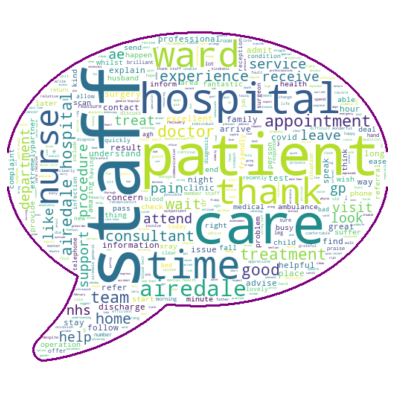

In [316]:
wc_spacy_Airedale = WordCloud(background_color="white", max_words=1000, mask=transformed_comment_mask,
               stopwords=stop_words,contour_width=3, contour_color='purple')

# Generate a wordcloud
wc_spacy_Airedale.generate(Airedale_words)

# store to file
#wc.to_file("img/wine.png")

# show
plt.figure(figsize=[10,7])
plt.imshow(wc_spacy_Airedale, interpolation='bilinear')
plt.axis("off")
plt.show()

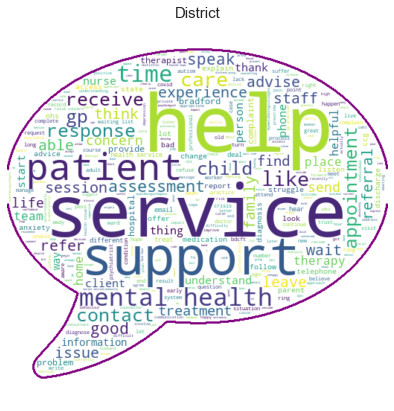

In [317]:
wc_spacy_District = WordCloud(background_color="white", max_words=1000, mask=transformed_comment_mask,
               stopwords=stop_words,contour_width=3, contour_color='purple')

# Generate a wordcloud
wc_spacy_District.generate(District_words)

# store to file
#wc.to_file("img/wine.png")

# show
plt.figure(figsize=[10,7])
plt.imshow(wc_spacy_District, interpolation='bilinear')
plt.axis("off")
plt.title('District',fontsize=15)
plt.show()

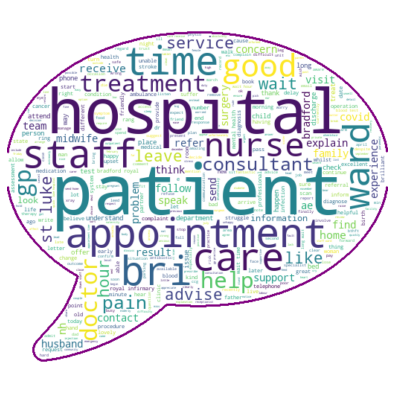

In [318]:
wc_spacy_Teaching = WordCloud(background_color="white", max_words=1000, mask=transformed_comment_mask,
               stopwords=stop_words,contour_width=3, contour_color='purple')

# Generate a wordcloud
wc_spacy_Teaching.generate(Teaching_words)

# store to file
#wc.to_file("img/wine.png")

# show
plt.figure(figsize=[10,7])
plt.imshow(wc_spacy_Teaching, interpolation='bilinear')
plt.axis("off")
plt.show()

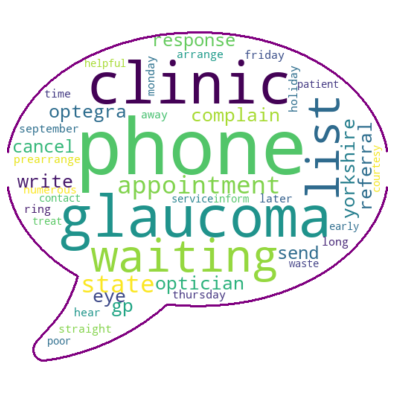

In [319]:
wc_spacy_opt = WordCloud(background_color="white", max_words=1000, mask=transformed_comment_mask,
               stopwords=stop_words,contour_width=3, contour_color='purple')

# Generate a wordcloud
wc_spacy_opt.generate(opt_words)

# store to file
#wc.to_file("img/wine.png")

# show
plt.figure(figsize=[10,7])
plt.imshow(wc_spacy_opt, interpolation='bilinear')
plt.axis("off")
plt.show()

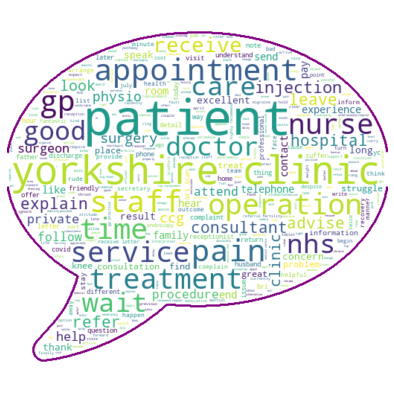

In [320]:
wc_spacy_YC = WordCloud(background_color="white", max_words=1000, mask=transformed_comment_mask,
               stopwords=stop_words,contour_width=3, contour_color='purple')

# Generate a wordcloud
wc_spacy_YC.generate(YClinic_words)

# store to file
#wc.to_file("img/wine.png")

# show
plt.figure(figsize=[10,7])
plt.imshow(wc_spacy_YC, interpolation='bilinear')
plt.axis("off")
plt.show()

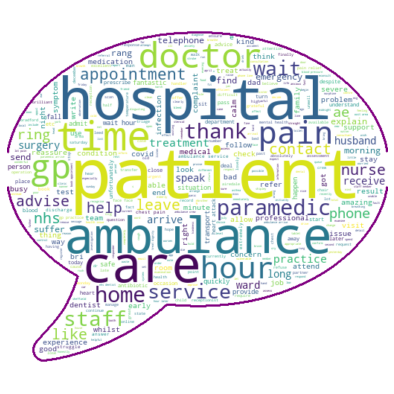

In [321]:
wc_spacy_amb = WordCloud(background_color="white", max_words=1000, mask=transformed_comment_mask,
               stopwords=stop_words,contour_width=3, contour_color='purple')

# Generate a wordcloud
wc_spacy_amb.generate(Ambulance_words)

# store to file
#wc.to_file("img/wine.png")

# show
plt.figure(figsize=[10,7])
plt.imshow(wc_spacy_amb, interpolation='bilinear')
plt.axis("off")
plt.show()

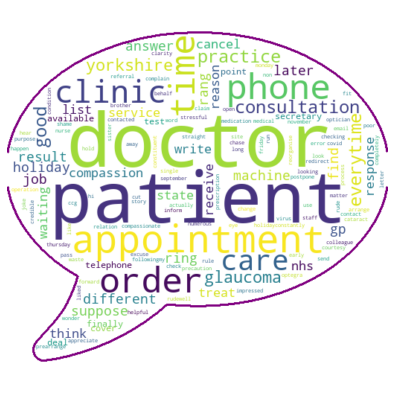

In [322]:
wc_spacy_EC = WordCloud(background_color="white", max_words=1000, mask=transformed_comment_mask,
               stopwords=stop_words,contour_width=3, contour_color='purple')

# Generate a wordcloud
wc_spacy_EC.generate(EClinic_words)

# store to file
#wc.to_file("img/wine.png")

# show
plt.figure(figsize=[10,7])
plt.imshow(wc_spacy_EC, interpolation='bilinear')
plt.axis("off")
plt.show()

Text(0.5, 1.0, 'Yorkshire Eye Clinic')

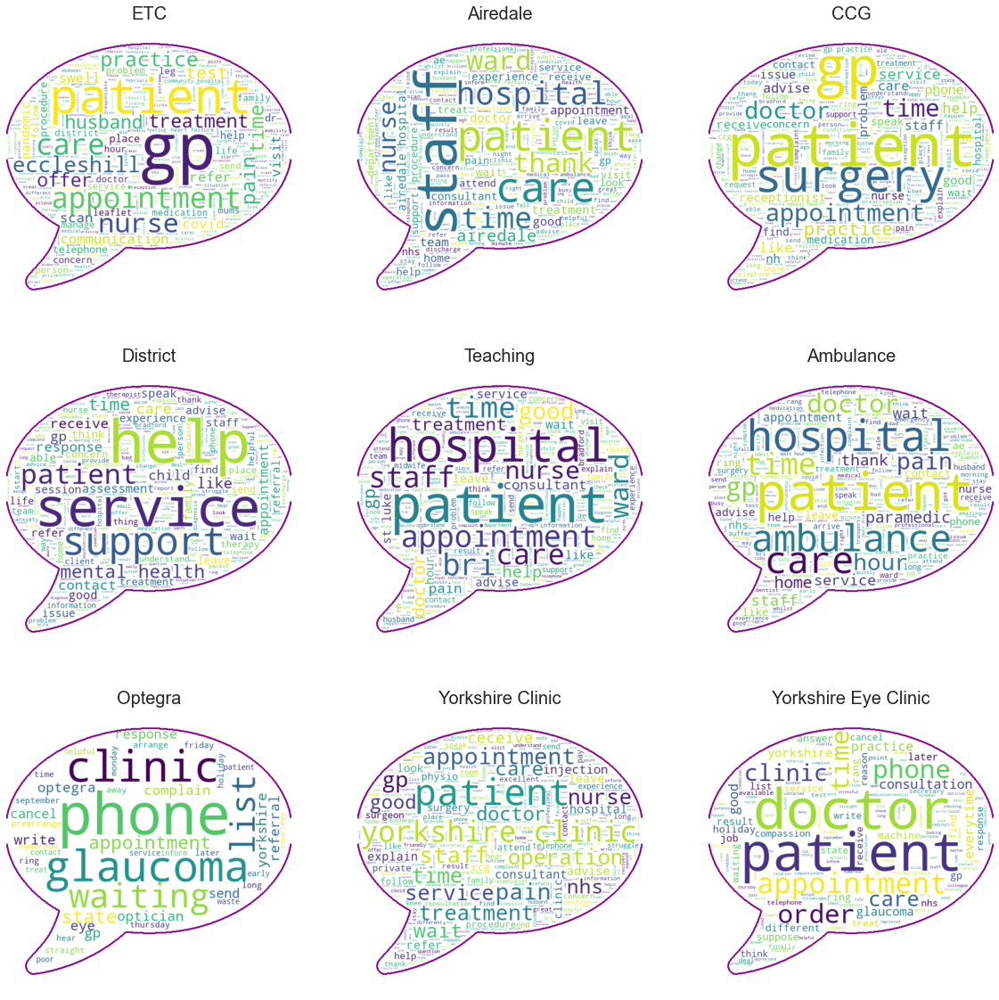

In [323]:
plt.rcParams['figure.figsize']=[20,20]


plt.subplot(3,3,1)
plt.imshow(wc_spacy_ETC, interpolation='bilinear')
plt.axis("off")
plt.title("ETC",fontsize=20)

plt.subplot(3,3,2)
plt.imshow(wc_spacy_Airedale, interpolation='bilinear')
plt.axis("off")
plt.title("Airedale",fontsize=20)

plt.subplot(3,3,3)
plt.imshow(wc_spacy, interpolation='bilinear')
plt.axis("off")
plt.title("CCG",fontsize=20)

plt.subplot(3,3,4)
plt.imshow(wc_spacy_District, interpolation='bilinear')
plt.axis("off")
plt.title("District",fontsize=20)

plt.subplot(3,3,5)
plt.imshow(wc_spacy_Teaching, interpolation='bilinear')
plt.axis("off")
plt.title("Teaching",fontsize=20)

plt.subplot(3,3,6)
plt.imshow(wc_spacy_amb, interpolation='bilinear')
plt.axis("off")
plt.title("Ambulance",fontsize=20)

plt.subplot(3,3,7)
plt.imshow(wc_spacy_opt, interpolation='bilinear')
plt.axis("off")
plt.title("Optegra",fontsize=20)

plt.subplot(3,3,8)
plt.imshow(wc_spacy_YC, interpolation='bilinear')
plt.axis("off")
plt.title("Yorkshire Clinic",fontsize=20)

plt.subplot(3,3,9)
plt.imshow(wc_spacy_EC, interpolation='bilinear')
plt.axis("off")
plt.title("Yorkshire Eye Clinic",fontsize=20)

# Bi-Gram build and Word Cloud

In [324]:
from nltk.util import ngrams

In [325]:
def get_ngrams(text, n):
    text = str(text)
    n_grams = ngrams(text.split(), n)
    returnVal = []
    
    try:
        for grams in n_grams:
            returnVal.append('_'.join(grams))
    except(RuntimeError):
        pass
        
    return ' '.join(returnVal).strip()

In [326]:
get_ngrams("I love eating biryani",3)

'I_love_eating love_eating_biryani'

In [327]:
bi_gram_CCG = get_ngrams(CCG_words,2)

In [328]:
bi_gram_ETC = get_ngrams(ETC_words,2)

In [329]:
bi_gram_amb = get_ngrams(Ambulance_words,2)

In [330]:
bi_gram_opt = get_ngrams(opt_words,2)

In [331]:
bi_gram_dist = get_ngrams(District_words,2)

In [332]:
bi_gram_YC = get_ngrams(YClinic_words,2)

In [333]:
#bi_gram_EC = get_ngrams(EClinic_words,2)
bi_gram_EC = get_ngrams(EClinic_words,2)

In [334]:
bi_gram_TH = get_ngrams(Teaching_words,2)

In [335]:
bi_gram_Air = get_ngrams(Airedale_words,2)

In [336]:
CCG_mask = np.array(PIL.Image.open("C://Users//Muthaiya//OneDrive//Desktop//letter_green.png"))

wordcloud_CCG = WordCloud(stopwords=stop_words,
              mask=CCG_mask,
               max_words=200,
              background_color="white",
              #contour_color="black",
              #contour_width=1,
           colormap="Dark2"
              ).generate(bi_gram_CCG)

In [337]:
TH_mask = np.array(PIL.Image.open("S://UOB//CourseWork//SEM3//Dissertation//Data_NHS//Teaching.png"))
#colormap = ImageColorGenerator(TH_mask)
wordcloud_th = WordCloud(stopwords=stop_words,
              mask=TH_mask,
              max_words=300,
              background_color="white",
              #contour_color="black",
              #contour_width=1,
              colormap="Dark2",
              max_font_size=30
              ).generate(bi_gram_TH)

In [338]:
amb_mask = np.array(PIL.Image.open("S://UOB//CourseWork//SEM3//Dissertation//Data_NHS//Ambulance.png"))
#colormap = ImageColorGenerator(amb_mask)
wordcloud_amb = WordCloud(stopwords=stop_words,
              mask=amb_mask,
              max_words=300,
              background_color="white",
              #contour_color="black",
              #contour_width=1,
              colormap="Dark2",
              #max_font_size=30
              ).generate(bi_gram_amb)


In [339]:
air_mask = np.array(PIL.Image.open("S://UOB//CourseWork//SEM3//Dissertation//Data_NHS/ADH.png"))
#colormap = ImageColorGenerator(air_mask)
wordcloud_air = WordCloud(stopwords=stop_words,
              mask=air_mask,
              max_words=300,
              background_color="white",
              #contour_color="black",
              #contour_width=1,
              colormap="Dark2",
              max_font_size=30
              ).generate(bi_gram_Air)


In [340]:
ETC_mask = np.array(PIL.Image.open("S://UOB//CourseWork//SEM3//Dissertation//Data_NHS/ETC.png"))
#colormap = ImageColorGenerator(EC_mask)
wordcloud_ETC = WordCloud(stopwords=stop_words,
              mask=ETC_mask,
              max_words=300,
              background_color="white",
              #contour_color="black",
              #contour_width=1,
              #colormap="Dark2",
               colormap="Dark2"           
              #max_font_size=30
              ).generate(bi_gram_ETC)

In [341]:
dc_mask = np.array(PIL.Image.open("S://UOB//CourseWork//SEM3//Dissertation//Data_NHS/DCH.png"))
#colormap = ImageColorGenerator(dc_mask)
wordcloud_dc = WordCloud(stopwords=stop_words,
              mask=dc_mask,
              max_words=300,
              background_color="white",
              #contour_color="black",
              #contour_width=1,
              colormap="Dark2",
              max_font_size=30,
                  #min_font_size=5
              ).generate(bi_gram_dist)

In [342]:
YC_mask = np.array(PIL.Image.open("S://UOB//CourseWork//SEM3//Dissertation//Data_NHS/YC.png"))
#colormap = ImageColorGenerator(YC_mask)
wordcloud_YC = WordCloud(stopwords=stop_words,
              #mask=YC_mask,
              max_words=200,
              background_color="white",
              #contour_color="black",
              #contour_width=1,
              colormap="Dark2",
              #max_font_size=30
              ).generate(bi_gram_YC)


In [343]:
wordcloud_EC = WordCloud(stopwords=stop_words,
              #mask=YC_mask,
              max_words=200,
              background_color="white",
              #contour_color="black",
              #contour_width=1,
              colormap="Dark2",
              #max_font_size=30
              ).generate(bi_gram_EC)

In [344]:
opt_mask = np.array(PIL.Image.open("S://UOB//CourseWork//SEM3//Dissertation//Data_NHS/OPT.png"))
colormap = ImageColorGenerator(opt_mask)
wordcloud_opt = WordCloud(stopwords=stop_words,
              mask=opt_mask,
              max_words=200,
              background_color="white",
              #contour_color="black",
              #contour_width=1,
              colormap="Dark2",
              #max_font_size=30
              ).generate(bi_gram_opt)

Text(0.5, 1.0, 'Yorkshire Eye Clinic')

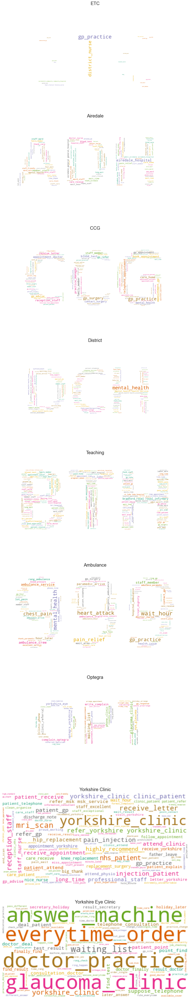

In [345]:
plt.rcParams['figure.figsize']=[100,80]


plt.subplot(9,1,1)
plt.imshow(wordcloud_ETC, interpolation='bilinear')
plt.axis("off")
plt.title("ETC",fontsize=20)

plt.subplot(9,1,2)
plt.imshow(wordcloud_air, interpolation='bilinear')
plt.axis("off")
plt.title("Airedale",fontsize=20)

plt.subplot(9,1,3)
plt.imshow(wordcloud_CCG, interpolation='bilinear')
plt.axis("off")
plt.title("CCG",fontsize=20)

plt.subplot(9,1,4)
plt.imshow(wordcloud_dc, interpolation='bilinear')
plt.axis("off")
plt.title("District",fontsize=20)

plt.subplot(9,1,5)
plt.imshow(wordcloud_th, interpolation='bilinear')
plt.axis("off")
plt.title("Teaching",fontsize=20)

plt.subplot(9,1,6)
plt.imshow(wordcloud_amb, interpolation='bilinear')
plt.axis("off")
plt.title("Ambulance",fontsize=20)

plt.subplot(9,1,7)
plt.imshow(wordcloud_opt, interpolation='bilinear')
plt.axis("off")
plt.title("Optegra",fontsize=20)

plt.subplot(9,1,8)
plt.imshow(wordcloud_YC, interpolation='bilinear')
plt.axis("off")
plt.title("Yorkshire Clinic",fontsize=20)

plt.subplot(9,1,9)
plt.imshow(wordcloud_EC, interpolation='bilinear')
plt.axis("off")
plt.title("Yorkshire Eye Clinic",fontsize=20)

# Sentiment Analysis

**Sentiment using spacy**

In [346]:
!pip3 install spacytextblob

In [347]:
from spacytextblob.spacytextblob import SpacyTextBlob

In [348]:
en.add_pipe('spacytextblob')

In [349]:
def sentiment(text):
    doc = en(text)
    sentiment = doc._.blob.polarity
    sentiment = round(sentiment,2)
    return sentiment

    
#url_sent_label.append(sent_label)
#url_sent_score.append(sentiment)

In [350]:
df['spacy_sentiment_score'] = df['patient_feedback'].apply(sentiment)

In [351]:
df['sentiment_score'] = df['cleaned_feedback'].apply(sentiment)

In [352]:
def analysis(score):
    if score > 0:
        sentiment = "Positive"
    elif score < 0:
        sentiment = "Negative"
    else:
        sentiment = "Neutral"
        
    return sentiment   


In [353]:
df['spacy_sentiment'] = df['spacy_sentiment_score'].apply(analysis)

In [354]:
df['sentiment'] = df['sentiment_score'].apply(analysis)

In [355]:
df.head()

,date,survey,services,patient_feedback,year,month,organisation,third_party,GP,service,...,primary_care,cleaned_feedback,feedback_w/o_stopwords,lemma,lemma_w/o_custom_stopwords,pos_tag,spacy_sentiment_score,sentiment_score,spacy_sentiment,sentiment
0,2021-08-31,CCG,"NHS Bradford District Care Trust, Mental Heal...",The CAMHS service needs to be proactive and no...,2021,August,NHS Bradford District Care Trust,not mentioned,not mentioned,"Mental Health,Mental Health",...,not mentioned,the camhs service needs to be proactive and no...,camhs service needs proactive reactive took ap...,camhs service need proactive reactive take app...,service proactive reactive approach issue,"[(camhs, NOUN), (service, NOUN), (needs, VERB)...",-0.17,-0.17,Negative,Negative
1,2018-04-03,Care,"Community, Inpatient, Secondary care services...","My Mother was in Airedale District hospital, b...",2018,April,NHS Airedale Hospital Foundation Trust,not mentioned,not mentioned,"Community,Inpatient",...,not mentioned,my mother was in airedale district hospital bu...,mother airedale district hospital obvious near...,mother airedale district hospital obvious near...,airedale district hospital obvious nearing end...,"[(mother, PROPN), (airedale, PROPN), (district...",0.02,0.02,Positive,Positive
2,2018-04-03,Care,"Inpatient, Secondary care services, NHS Aired...",I attended the emergency department at Airedal...,2018,April,NHS Airedale Hospital Foundation Trust,not mentioned,not mentioned,Inpatient,...,not mentioned,i attended the emergency department at airedal...,attended emergency department airedale hospita...,attend emergency department airedale hospital ...,attend emergency department airedale hospital ...,"[(attended, VERB), (emergency, NOUN), (departm...",0.28,0.31,Positive,Positive
3,2018-05-10,Care,"Ambulance, Inpatient, Secondary care services...",from 999 call and calming helpful operator to ...,2018,May,NHS Airedale Hospital Foundation Trust,not mentioned,not mentioned,"Ambulance,Inpatient",...,not mentioned,from call and calming helpful operator to firs...,calming helpful operator responder ambulance s...,calm helpful operator responder ambulance staf...,calm helpful operator responder ambulance staf...,"[(calming, VERB), (helpful, ADJ), (operator, N...",0.27,0.27,Positive,Positive
5,2018-07-03,Care,NHS Bradford Teaching Hospitals Foundation Tr...,I am currently 33 weeks and the service I have...,2018,July,NHS Bradford Teaching Hospitals Foundation Trust,not mentioned,not mentioned,"Inpatient,Maternity",...,not mentioned,i am currently weeks and the service i have re...,currently weeks service received bri amazing f...,currently week service receive bri amazing far...,currently service receive bri amazing far time...,"[(currently, ADV), (weeks, VERB), (service, NO...",0.23,0.23,Positive,Positive


In [356]:
#spacy sentiment analysis -1 to 1
#spacy sentiment upon the raw patient feedback
df['spacy_sentiment'].value_counts()

Positive    4421
Negative    2083
Neutral      679
Name: spacy_sentiment, dtype: int64

In [357]:
#spacy sentiment upon the cleaned patient feedback
df['sentiment'].value_counts()

Positive    4366
Negative    2145
Neutral      672
Name: sentiment, dtype: int64

In [358]:
df['length'] = df['patient_feedback'].apply(len)

In [359]:
#df.to_csv('verification.csv')

In [360]:
len("hi hello".split())

2

In [361]:
px.histogram(df, x='length', nbins=50)

In [362]:
fig = px.histogram(df, x='sentiment')
fig.update_layout(bargap=0.2)

# Sentiment Visualisation

Text(0.5, 1.0, 'Sentiment Count')

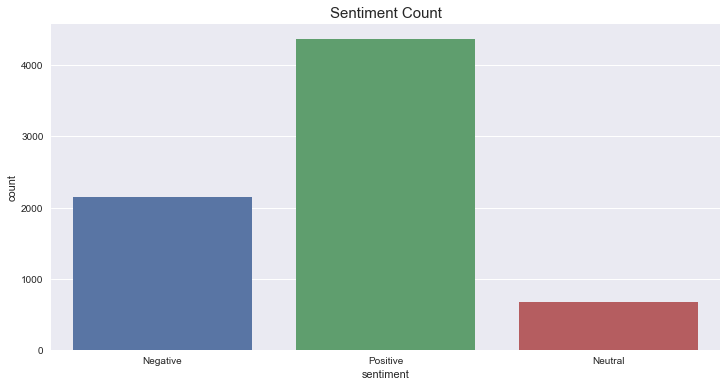

In [363]:
plt.figure(figsize=(12,6))
sns.countplot(x='sentiment',data=df)
plt.title('Sentiment Count',fontsize=15)

Text(0.5, 1.0, 'Sentiment Count')

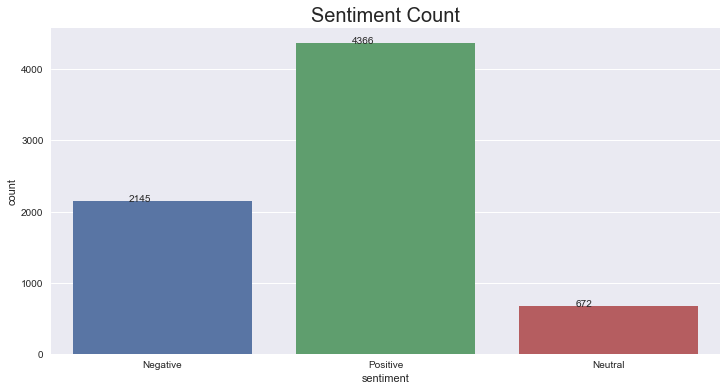

In [364]:
plt.figure(figsize=(12,6))
ax=sns.countplot(x='sentiment',data=df)
for p in ax.patches:
   ax.annotate('{}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()))
plt.title('Sentiment Count',fontsize=20)

# Word Cloud for sentiment

**Word Cloud for spacy sentiment**

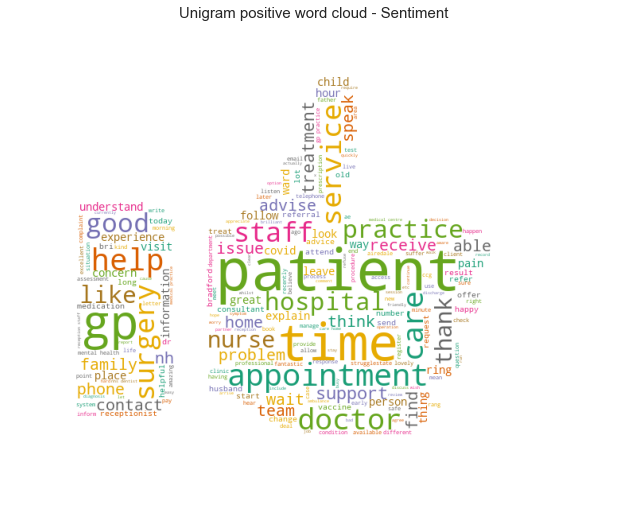

In [365]:
spacy_pos_comment_words = '' 
#stopwords = set(STOPWORDS) 
  
spacy_positive = df[df["sentiment"]== "Positive"] 
# iterate through the csv file 
for val in spacy_positive['lemma_w/o_custom_stopwords']: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    spacy_pos_comment_words += " ".join(tokens)+" "

positive_mask = np.array(PIL.Image.open("S://UOB//CourseWork//SEM3//Dissertation//Data_NHS//Thumbs.png"))
colormap = ImageColorGenerator(positive_mask)
wc_spacy_pos = WordCloud(stopwords=stop_words,
              mask=positive_mask,
              max_words=200,
              background_color="white",
              #contour_color="black",
              #contour_width=1,
              colormap="Dark2",
              #max_font_size=30
              ).generate(spacy_pos_comment_words)
#wc.recolor(color_func=colormap)
plt.figure(figsize=(15, 9))
plt.imshow(wc_spacy_pos)
plt.axis("off")
plt.title("Unigram positive word cloud - Sentiment",fontsize=15)
#plt.tight_layout(pad=0)
plt.show() 


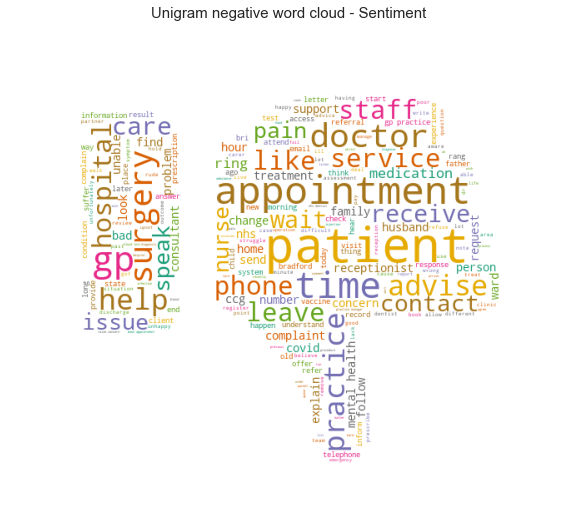

In [366]:
spacy_neg_comment_words = '' 
#stopwords = set(STOPWORDS) 
  
spacy_negative = df[df["sentiment"]== "Negative"] 
# iterate through the csv file 
for val in spacy_negative['lemma_w/o_custom_stopwords']: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    spacy_neg_comment_words += " ".join(tokens)+" "

negative_mask = np.array(PIL.Image.open("S://UOB//CourseWork//SEM3//Dissertation//Data_NHS//Thumb_down.png"))
colormap = ImageColorGenerator(negative_mask)
wc_spacy_neg = WordCloud(stopwords=stop_words,
              mask=negative_mask,
              max_words=200,
              background_color="white",
              #contour_color="black",
              #contour_width=1,
              colormap="Dark2",
              #max_font_size=30
              ).generate(spacy_neg_comment_words)
#wc.recolor(color_func=colormap)
plt.figure(figsize=(15, 9))
plt.imshow(wc_spacy_neg)
plt.axis("off")
plt.title("Unigram negative word cloud - Sentiment",fontsize=15)
#plt.tight_layout(pad=0)
plt.show() 

**Bi-gram Word Cloud for spacy sentiment**

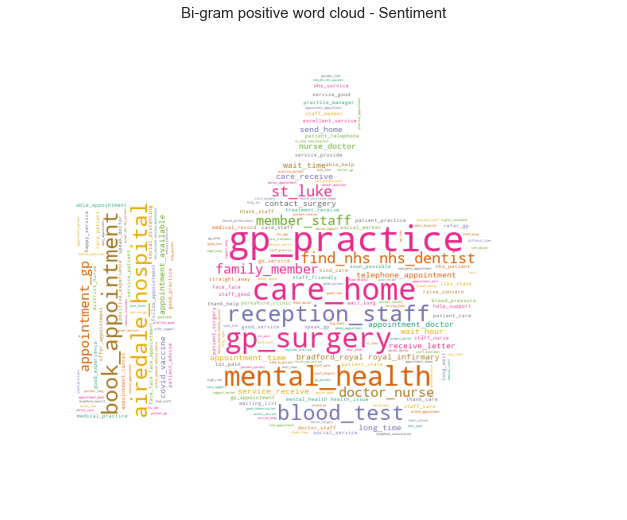

In [367]:
bigram_spacy_positive = df[df["sentiment"]== "Positive"]
bigram_spacy_positive_words = [" ".join(text) for text in bigram_spacy_positive['lemma_w/o_custom_stopwords'].str.split(' ')]
bigram_spacy_positive_words = " ".join(bigram_spacy_positive_words)

bi_gram_spositive = get_ngrams(bigram_spacy_positive_words,2)

positive_mask = np.array(PIL.Image.open("S://UOB//CourseWork//SEM3//Dissertation//Data_NHS//Thumbs.png"))
colormap = ImageColorGenerator(positive_mask)
wc_spos = WordCloud(stopwords=stop_words,
              mask=positive_mask,
              max_words=200,
              background_color="white",
              #contour_color="black",
              #contour_width=1,
              colormap="Dark2",
              #max_font_size=30
              ).generate(bi_gram_spositive)
#wc.recolor(color_func=colormap)
plt.figure(figsize=(15, 9))
plt.imshow(wc_spos)
plt.axis("off")
plt.title("Bi-gram positive word cloud - Sentiment",fontsize=15)
#plt.tight_layout(pad=0)
plt.show() 

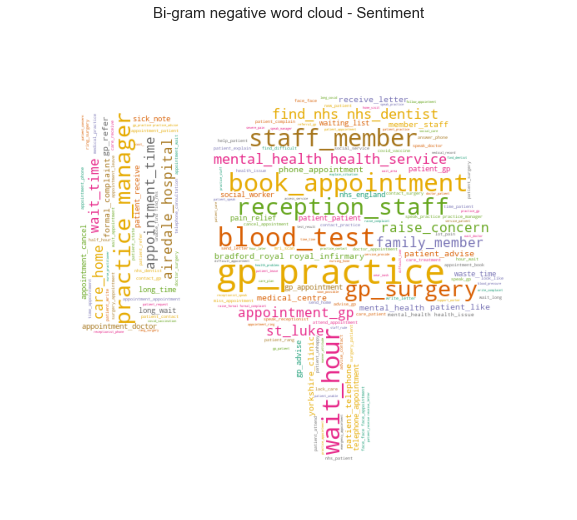

In [368]:
bigram_spacy_negative = df[df["sentiment"]== "Negative"]
bigram_spacy_negative_words = [" ".join(text) for text in bigram_spacy_negative['lemma_w/o_custom_stopwords'].str.split(' ')]
bigram_spacy_negative_words = " ".join(bigram_spacy_negative_words)

bi_gram_snegative = get_ngrams(bigram_spacy_negative_words,2)

negative_mask = np.array(PIL.Image.open("S://UOB//CourseWork//SEM3//Dissertation//Data_NHS//Thumb_down.png"))
colormap = ImageColorGenerator(negative_mask)
wc_sneg = WordCloud(stopwords=stop_words,
              mask=negative_mask,
              max_words=200,
              background_color="white",
              #contour_color="black",
              #contour_width=1,
              colormap="Dark2",
              #max_font_size=30
              ).generate(bi_gram_snegative)
#wc.recolor(color_func=colormap)
plt.figure(figsize=(15, 9))
plt.imshow(wc_sneg)
plt.axis("off")
plt.title("Bi-gram negative word cloud - Sentiment",fontsize=15)
#plt.tight_layout(pad=0)
plt.show() 

# Finding most Common Words

# **Spacy 1-gram most common words**

**Positive Words**

In [369]:
from collections import Counter
#vpositive_words
split_it = spacy_pos_comment_words.split()
Counter = Counter(split_it)
most_occur = Counter.most_common(20)
#print(most_occur)
spacy_temp = pd.DataFrame(most_occur)
spacy_temp.columns = ['Common_words','count']

In [370]:
fig = px.bar(spacy_temp, x="count", y="Common_words", title='Commmon Words in Selected Text', orientation='h', 
             width=700, height=700,color='Common_words')
fig.show()

**Negative Words**

In [371]:
from collections import Counter
#vpositive_words
neg_split_it = spacy_neg_comment_words.split()
neg_Counter = Counter(neg_split_it)
neg_most_occur = neg_Counter.most_common(20)
#print(most_occur)
spacy_neg_temp = pd.DataFrame(neg_most_occur)
spacy_neg_temp.columns = ['Neg_Common_words','count']

In [372]:
fig = px.bar(spacy_neg_temp, x="count", y="Neg_Common_words", title='Negative Commmon Words in Selected Text', orientation='h', 
             width=700, height=700,color='Neg_Common_words')
fig.show()

# Spacy Bi-gram most common words

**Positive Words**

In [373]:
from collections import Counter
#vpositive_words
bi_pos_split_it = bi_gram_spositive.split()
bi_pos_counter = Counter(bi_pos_split_it)
bi_pos_most_occur = bi_pos_counter.most_common(20)
#print(most_occur)
spacy_bi_pos_temp = pd.DataFrame(bi_pos_most_occur)
spacy_bi_pos_temp.columns = ['Bi_Pos_Common_words','count']

In [374]:
fig = px.bar(spacy_bi_pos_temp, x="count", y="Bi_Pos_Common_words", title='Bi-gram Positive Commmon Words in Selected Text', orientation='h', 
             width=700, height=700,color='Bi_Pos_Common_words')
fig.show()

**Negative Words**

In [375]:
from collections import Counter
#vpositive_words
bi_neg_split_it = bi_gram_snegative.split()
bi_neg_counter = Counter(bi_neg_split_it)
bi_neg_most_occur = bi_neg_counter.most_common(20)
#print(most_occur)
spacy_bi_neg_temp = pd.DataFrame(bi_neg_most_occur)
spacy_bi_neg_temp.columns = ['Bi_Neg_Common_words','count']

In [376]:
fig = px.bar(spacy_bi_neg_temp, x="count", y="Bi_Neg_Common_words", title='Bi-gram Negative Commmon Words in Selected Text', orientation='h', 
             width=700, height=700,color='Bi_Neg_Common_words')
fig.show()

# Sentiment Analysis based on the Organisation

**Organisation NHS Bradford CCG**

In [377]:
CCG_analysis = df[df['organisation'].str.contains('NHS Bradford CCG')]

In [378]:
CCG_ssentiment_count = CCG_analysis.groupby('sentiment').count()['patient_feedback'].reset_index().sort_values(by='patient_feedback',ascending=False)
sns.set_style("white")
#sns.set_palette("Dark2")
CCG_ssentiment_count.style.background_gradient()

,sentiment,patient_feedback
2,Positive,1904
0,Negative,1127
1,Neutral,261


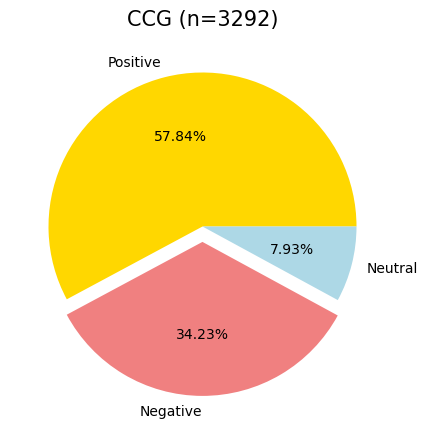

In [546]:
plt.figure(figsize=(7,5))
plt.style.use('default')

py= np.array([CCG_ssentiment_count['patient_feedback'][2],CCG_ssentiment_count['patient_feedback'][0],CCG_ssentiment_count['patient_feedback'][1]])
mylabels = ["Positive","Negative","Neutral"]
myexplode = [0, 0.1, 0]
mycolors = ["gold", "lightcoral", "lightblue"]
plt.pie(py, labels = mylabels, explode = myexplode, colors=mycolors, autopct='%1.2f%%')
plt.title("CCG (n=3292)",fontsize=15)

plt.show()

In [380]:
fig = px.scatter(CCG_analysis, 
                 x='sentiment_score', 
                 #y='Subjectivity', 
                 color = 'sentiment',
                 #size='Subjectivity'
                )

#add a vertical line at x=0 for Netural Reviews
fig.update_layout(title='Sentiment Analysis',
                  shapes=[dict(type= 'line',
                              yref= 'paper', y0= 0, y1= 1, 
                              xref= 'x', x0= 0, x1= 0)])
fig.show()

**Organisation Airedale**

In [381]:
Airdale_analysis = df[df['organisation'].str.contains('NHS Airedale Hospital Foundation Trust')]

In [382]:
Airedale_ssentiment_count = Airdale_analysis.groupby('sentiment').count()['patient_feedback'].reset_index().sort_values(by='patient_feedback',ascending=False)
sns.set_style("white")
#sns.set_palette("Dark2")
Airedale_ssentiment_count.style.background_gradient()

,sentiment,patient_feedback
2,Positive,415
0,Negative,106
1,Neutral,21


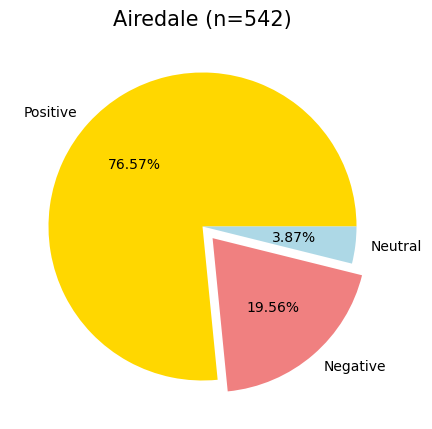

In [547]:
plt.figure(figsize=(7,5))

y= np.array([Airedale_ssentiment_count['patient_feedback'][2],Airedale_ssentiment_count['patient_feedback'][0],Airedale_ssentiment_count['patient_feedback'][1]])
mylabels = ["Positive","Negative","Neutral"]
myexplode = [0, 0.1, 0]
mycolors = ["gold", "lightcoral", "lightblue"]
plt.pie(y, labels = mylabels, explode = myexplode, colors=mycolors, autopct='%1.2f%%')
plt.title("Airedale (n=542)",fontsize=15)
plt.show()

In [384]:
fig = px.scatter(Airdale_analysis, 
                 x='sentiment_score', 
                 #y='Subjectivity', 
                 color = 'sentiment',
                 #size='Subjectivity'
                )

#add a vertical line at x=0 for Netural Reviews
fig.update_layout(title='Sentiment Analysis',
                  shapes=[dict(type= 'line',
                              yref= 'paper', y0= 0, y1= 1, 
                              xref= 'x', x0= 0, x1= 0)])
fig.show()

**Organisation District Care Hospital**

In [385]:
DC_analysis = df[df['organisation'].str.contains('NHS Bradford District Care Trust')]

In [548]:
DC_ssentiment_count = DC_analysis.groupby('sentiment').count()['patient_feedback'].reset_index().sort_values(by='patient_feedback',ascending=False)
sns.set_style("white")
#sns.set_palette("Dark2")
DC_ssentiment_count.style.background_gradient()

,sentiment,patient_feedback
2,Positive,435
0,Negative,193
1,Neutral,81


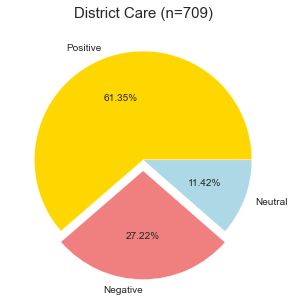

In [387]:
plt.figure(figsize=(7,5))

y= np.array([DC_ssentiment_count['patient_feedback'][2],DC_ssentiment_count['patient_feedback'][0],DC_ssentiment_count['patient_feedback'][1]])
mylabels = ["Positive","Negative","Neutral"]
myexplode = [0, 0.1, 0]
mycolors = ["gold", "lightcoral", "lightblue"]
plt.pie(y, labels = mylabels, explode = myexplode, colors=mycolors, autopct='%1.2f%%')
plt.title("District Care (n=709)",fontsize=15)
plt.show()

In [388]:
#plt.subplot(1,1,1)
fig = px.scatter(DC_analysis, 
                 x='sentiment_score', 
                 #y='Subjectivity', 
                 color = 'sentiment',
                 #size='Subjectivity'
                )

#add a vertical line at x=0 for Netural Reviews
fig.update_layout(title='Sentiment Analysis',
                  shapes=[dict(type= 'line',
                              yref= 'paper', y0= 0, y1= 1, 
                              xref= 'x', x0= 0, x1= 0)])
fig.show()

**Organisation Teaching Hospital**

In [389]:
TH_analysis = df[df['organisation'].str.contains('NHS Bradford Teaching Hospitals Foundation Trust')]

In [390]:
TH_ssentiment_count = TH_analysis.groupby('sentiment').count()['patient_feedback'].reset_index().sort_values(by='patient_feedback',ascending=False)
sns.set_style("white")
#sns.set_palette("Dark2")
TH_ssentiment_count.style.background_gradient()

,sentiment,patient_feedback
2,Positive,761
0,Negative,313
1,Neutral,91


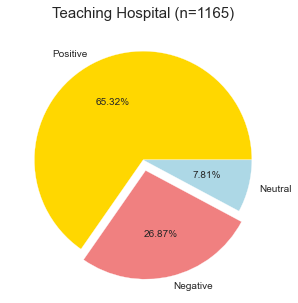

In [391]:
plt.figure(figsize=(7,5))

y= np.array([TH_ssentiment_count['patient_feedback'][2],TH_ssentiment_count['patient_feedback'][0],TH_ssentiment_count['patient_feedback'][1]])
mylabels = ["Positive","Negative","Neutral"]
myexplode = [0, 0.1, 0]
mycolors = ["gold", "lightcoral", "lightblue"]
plt.pie(y, labels = mylabels, explode = myexplode, colors=mycolors, autopct='%1.2f%%')
plt.title("Teaching Hospital (n=1165)",fontsize=15)
plt.show()

In [392]:
#plt.subplot(1,1,1)
fig = px.scatter(TH_analysis, 
                 x='sentiment_score', 
                 #y='Subjectivity', 
                 color = 'sentiment',
                 #size='Subjectivity'
                )

#add a vertical line at x=0 for Netural Reviews
fig.update_layout(title='Sentiment Analysis',
                  shapes=[dict(type= 'line',
                              yref= 'paper', y0= 0, y1= 1, 
                              xref= 'x', x0= 0, x1= 0)])
fig.show()

**Organisation Ambulance Service**

In [393]:
amb_analysis = df[df['organisation'].str.contains('Yorkshire Ambulance Services')]

In [394]:
amb_ssentiment_count = amb_analysis.groupby('sentiment').count()['patient_feedback'].reset_index().sort_values(by='patient_feedback',ascending=False)
sns.set_style("white")
#sns.set_palette("Dark2")
amb_ssentiment_count.style.background_gradient()

,sentiment,patient_feedback
2,Positive,122
0,Negative,55
1,Neutral,7


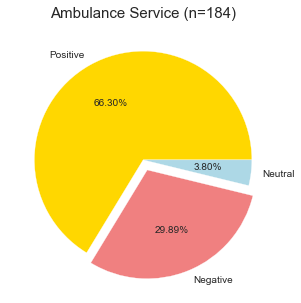

In [395]:
plt.figure(figsize=(7,5))

y= np.array([amb_ssentiment_count['patient_feedback'][2],amb_ssentiment_count['patient_feedback'][0],amb_ssentiment_count['patient_feedback'][1]])
mylabels = ["Positive","Negative","Neutral"]
myexplode = [0, 0.1, 0]
mycolors = ["gold", "lightcoral", "lightblue"]
plt.pie(y, labels = mylabels, explode = myexplode, colors=mycolors, autopct='%1.2f%%')
plt.title("Ambulance Service (n=184)",fontsize=15)

plt.show()

In [396]:
#plt.subplot(1,1,1)
fig = px.scatter(amb_analysis, 
                 x='sentiment_score', 
                 #y='Subjectivity', 
                 color = 'sentiment',
                 #size='Subjectivity'
                )

#add a vertical line at x=0 for Netural Reviews
fig.update_layout(title='Sentiment Analysis',
                  shapes=[dict(type= 'line',
                              yref= 'paper', y0= 0, y1= 1, 
                              xref= 'x', x0= 0, x1= 0)])
fig.show()

**Organisation Yorkshire Clinic Service**

In [397]:
YC_analysis = df[df['organisation'].str.contains('The Yorkshire clinic')]

In [398]:
YC_ssentiment_count = YC_analysis.groupby('sentiment').count()['patient_feedback'].reset_index().sort_values(by='patient_feedback',ascending=False)
sns.set_style("white")
#sns.set_palette("Dark2")
YC_ssentiment_count.style.background_gradient()

,sentiment,patient_feedback
2,Positive,65
0,Negative,28
1,Neutral,12


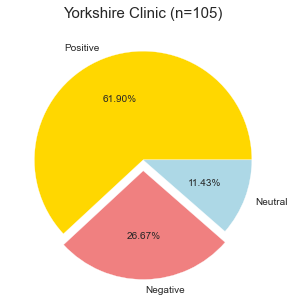

In [399]:
plt.figure(figsize=(7,5))

y= np.array([YC_ssentiment_count['patient_feedback'][2],YC_ssentiment_count['patient_feedback'][0],YC_ssentiment_count['patient_feedback'][1]])
mylabels = ["Positive","Negative","Neutral"]
myexplode = [0, 0.1, 0]
mycolors = ["gold", "lightcoral", "lightblue"]
plt.pie(y, labels = mylabels, explode = myexplode, colors=mycolors, autopct='%1.2f%%')
plt.title("Yorkshire Clinic (n=105)",fontsize=15)
plt.show()

In [400]:
#plt.subplot(1,1,1)
fig = px.scatter(YC_analysis, 
                 x='sentiment_score', 
                 #y='Subjectivity', 
                 color = 'sentiment',
                 #size='Subjectivity'
                )

#add a vertical line at x=0 for Netural Reviews
fig.update_layout(title='Sentiment Analysis',
                  shapes=[dict(type= 'line',
                              yref= 'paper', y0= 0, y1= 1, 
                              xref= 'x', x0= 0, x1= 0)])
fig.show()

**Organisation ETC**

In [401]:
ETC_analysis = df[df['organisation'].str.contains('Eccleshill Treatment Centre')]

In [402]:
ETC_ssentiment_count = ETC_analysis.groupby('sentiment').count()['patient_feedback'].reset_index().sort_values(by='patient_feedback',ascending=False)
sns.set_style("white")
#sns.set_palette("Dark2")
ETC_ssentiment_count.style.background_gradient()

,sentiment,patient_feedback
0,Negative,4
1,Neutral,2
2,Positive,2


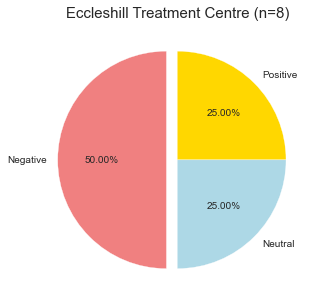

In [403]:
plt.figure(figsize=(7,5))

y= np.array([ETC_ssentiment_count['patient_feedback'][2],ETC_ssentiment_count['patient_feedback'][0],ETC_ssentiment_count['patient_feedback'][1]])
mylabels = ["Positive","Negative","Neutral"]
myexplode = [0, 0.1, 0]
mycolors = ["gold", "lightcoral", "lightblue"]
plt.pie(y, labels = mylabels, explode = myexplode, colors=mycolors, autopct='%1.2f%%')
plt.title("Eccleshill Treatment Centre (n=8)",fontsize=15)
plt.show()

In [404]:
#plt.subplot(1,1,1)
fig = px.scatter(ETC_analysis, 
                 x='sentiment_score', 
                 #y='Subjectivity', 
                 color = 'sentiment',
                 #size='Subjectivity'
                )

#add a vertical line at x=0 for Netural Reviews
fig.update_layout(title='Sentiment Analysis',
                  shapes=[dict(type= 'line',
                              yref= 'paper', y0= 0, y1= 1, 
                              xref= 'x', x0= 0, x1= 0)])
fig.show()

**Organisation Eye Clinic**

In [405]:
EC_analysis = df[df['organisation'].str.contains('Yorkshire Eye clinic')]

In [406]:
EC_ssentiment_count = EC_analysis.groupby('sentiment').count()['patient_feedback'].reset_index().sort_values(by='patient_feedback',ascending=False)
sns.set_style("white")
#sns.set_palette("Dark2")
EC_ssentiment_count.style.background_gradient()

,sentiment,patient_feedback
0,Negative,3
1,Neutral,2
2,Positive,2


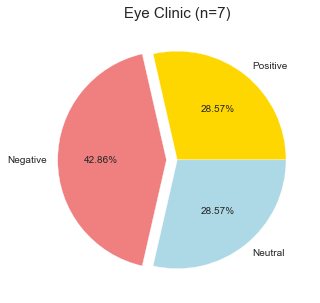

In [407]:
plt.figure(figsize=(7,5))

y= np.array([EC_ssentiment_count['patient_feedback'][2],EC_ssentiment_count['patient_feedback'][0],EC_ssentiment_count['patient_feedback'][1]])
mylabels = ["Positive","Negative","Neutral"]
myexplode = [0, 0.1, 0]
mycolors = ["gold", "lightcoral", "lightblue"]
plt.pie(y, labels = mylabels, explode = myexplode, colors=mycolors, autopct='%1.2f%%')
plt.title("Eye Clinic (n=7)",fontsize=15)

plt.show()

In [408]:
#plt.subplot(1,1,1)
fig = px.scatter(EC_analysis, 
                 x='sentiment_score', 
                 #y='Subjectivity', 
                 color = 'sentiment',
                 #size='Subjectivity'
                )

#add a vertical line at x=0 for Netural Reviews
fig.update_layout(title='Sentiment Analysis',
                  shapes=[dict(type= 'line',
                              yref= 'paper', y0= 0, y1= 1, 
                              xref= 'x', x0= 0, x1= 0)])
fig.show()

**Organisation Optegra**

In [409]:
opt_analysis = df[df['organisation'].str.contains('Optegra')]

In [410]:
opt_ssentiment_count = opt_analysis.groupby('sentiment').count()['patient_feedback'].reset_index().sort_values(by='patient_feedback',ascending=False)
sns.set_style("white")
#sns.set_palette("Dark2")
opt_ssentiment_count.style.background_gradient()

,sentiment,patient_feedback
0,Negative,1


#  Latent Dirichlet Allocation - Topic Modelling

In [411]:
!pip install pyLDAvis

In [412]:
#from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
#from sklearn.model_selection import GridSearchCV
#from sklearn.decomposition import LatentDirichletAllocation
import pyLDAvis
#import pyLDAvis.sklearn
import pyLDAvis.gensim_models
pyLDAvis.enable_notebook()

In [413]:
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
#from gensim.models import coherencemodel

In [414]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Spacy Combo

In [415]:
spacy_combo = df[(df["sentiment"]== "Negative") | (df["sentiment"]== "Neutral")]

In [416]:
#spacy_combo = df[(df["spacy_sentiment"]== "Negative") | (df["spacy_sentiment"]== "Neutral")]

In [417]:
spacy_combo.shape

(2817, 22)

In [418]:
spacy_data = spacy_combo['lemma_w/o_custom_stopwords']

In [419]:
spacy_combo.dtypes

date                          datetime64[ns]
survey                                object
services                              object
patient_feedback                      object
year                                   int64
month                                 object
organisation                          object
third_party                           object
GP                                    object
service                               object
priority_area                         object
primary_care                          object
cleaned_feedback                      object
feedback_w/o_stopwords                object
lemma                                 object
lemma_w/o_custom_stopwords            object
pos_tag                               object
spacy_sentiment_score                float64
sentiment_score                      float64
spacy_sentiment                       object
sentiment                             object
length                                 int64
dtype: obj

In [420]:
spacy_feedback = spacy_combo['patient_feedback'].tolist()

In [421]:
#spacy_data = spacy_combo['cleaned_feedback']

In [422]:
def gen_spacy_words(texts):
    spacy_final = []
    for text in texts:
        new = gensim.utils.simple_preprocess(text,deacc=True)
        spacy_final.append(new)
    return spacy_final

spacy_data_words=gen_spacy_words(spacy_data)

In [423]:
spacy_id2word = corpora.Dictionary(spacy_data_words)

In [424]:
len(spacy_id2word)

8116

In [425]:
#spacy_id2word.filter_extremes(no_below=5, no_above=0.5, keep_n=1000)
#spacy_id2word.filter_extremes(no_above=0.5)

In [426]:
spacy_corpus = []
for text in spacy_data_words:
    new = spacy_id2word.doc2bow(text)
    spacy_corpus.append(new)

In [427]:
spacy_lda_model = gensim.models.ldamodel.LdaModel(corpus=spacy_corpus,
                                           id2word=spacy_id2word,
                                           num_topics=10,
                                           random_state=110,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha="auto")

In [428]:
spacy_lda_model1 = gensim.models.ldamodel.LdaModel(corpus=spacy_corpus,
                                           id2word=spacy_id2word,
                                           num_topics=11,
                                           random_state=1111,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha="auto")

In [429]:
spacy_lda_model2 = gensim.models.ldamodel.LdaModel(corpus=spacy_corpus,
                                           id2word=spacy_id2word,
                                           num_topics=12,
                                           random_state=1112,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha="auto")

In [430]:
spacy_lda_model3 = gensim.models.ldamodel.LdaModel(corpus=spacy_corpus,
                                           id2word=spacy_id2word,
                                           num_topics=13,
                                           random_state=1113,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha="auto")

In [431]:
spacy_lda_model4 = gensim.models.ldamodel.LdaModel(corpus=spacy_corpus,
                                           id2word=spacy_id2word,
                                           num_topics=14,
                                           random_state=1114,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha="auto")

In [432]:
spacy_lda_model5 = gensim.models.ldamodel.LdaModel(corpus=spacy_corpus,
                                           id2word=spacy_id2word,
                                           num_topics=15,
                                           random_state=1115,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha="auto")

In [433]:
spacy_lda_model0 = gensim.models.ldamodel.LdaModel(corpus=spacy_corpus,
                                           id2word=spacy_id2word,
                                           num_topics=20,
                                           random_state=1120,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha="auto")

In [434]:
## CALCULATE COHERENCE SCORE ###

# Set up coherence model
coherence_model_lda = gensim.models.CoherenceModel(model=spacy_lda_model1, texts=spacy_data_words, dictionary=spacy_id2word, coherence='c_v')

# Calculate and print coherence
coherence_lda = coherence_model_lda.get_coherence()
print('-'*50)
print('\nCoherence Score:', coherence_lda)
print('-'*50)

--------------------------------------------------

Coherence Score: 0.4238932499750986
--------------------------------------------------


In [435]:
## CALCULATE COHERENCE SCORE ###

# Set up coherence model
coherence_model_lda = gensim.models.CoherenceModel(model=spacy_lda_model2, texts=spacy_data_words, dictionary=spacy_id2word, coherence='c_v')

# Calculate and print coherence
coherence_lda = coherence_model_lda.get_coherence()
print('-'*50)
print('\nCoherence Score:', coherence_lda)
print('-'*50)

--------------------------------------------------

Coherence Score: 0.44380676113591716
--------------------------------------------------


In [436]:
## CALCULATE COHERENCE SCORE ###

# Set up coherence model
coherence_model_lda = gensim.models.CoherenceModel(model=spacy_lda_model3, texts=spacy_data_words, dictionary=spacy_id2word, coherence='c_v')

# Calculate and print coherence
coherence_lda = coherence_model_lda.get_coherence()
print('-'*50)
print('\nCoherence Score:', coherence_lda)
print('-'*50)

--------------------------------------------------

Coherence Score: 0.4458354061748634
--------------------------------------------------


In [437]:
## CALCULATE COHERENCE SCORE ###

# Set up coherence model
coherence_model_lda = gensim.models.CoherenceModel(model=spacy_lda_model4, texts=spacy_data_words, dictionary=spacy_id2word, coherence='c_v')

# Calculate and print coherence
coherence_lda = coherence_model_lda.get_coherence()
print('-'*50)
print('\nCoherence Score:', coherence_lda)
print('-'*50)

--------------------------------------------------

Coherence Score: 0.4573068736831066
--------------------------------------------------


In [438]:
## CALCULATE COHERENCE SCORE ###

# Set up coherence model
coherence_model_lda = gensim.models.CoherenceModel(model=spacy_lda_model5, texts=spacy_data_words, dictionary=spacy_id2word, coherence='c_v')

# Calculate and print coherence
coherence_lda = coherence_model_lda.get_coherence()
print('-'*50)
print('\nCoherence Score:', coherence_lda)
print('-'*50)

--------------------------------------------------

Coherence Score: 0.4243913101419096
--------------------------------------------------


In [439]:
## CALCULATE COHERENCE SCORE ###

# Set up coherence model
coherence_model_lda = gensim.models.CoherenceModel(model=spacy_lda_model0, texts=spacy_data_words, dictionary=spacy_id2word, coherence='c_v')

# Calculate and print coherence
coherence_lda = coherence_model_lda.get_coherence()
print('-'*50)
print('\nCoherence Score:', coherence_lda)
print('-'*50)

--------------------------------------------------

Coherence Score: 0.4011686826019959
--------------------------------------------------


In [440]:
## CALCULATE COHERENCE SCORE ###

# Set up coherence model
#coherence_model_lda = gensim.models.CoherenceModel(model=spacy_lda_model, texts=spacy_data_words, dictionary=spacy_id2word, coherence='c_v')

# Calculate and print coherence
#coherence_lda = coherence_model_lda.get_coherence()
#print('-'*50)
#print('\nCoherence Score:', coherence_lda)
#print('-'*50)

In [441]:
vis=pyLDAvis.gensim_models.prepare(spacy_lda_model,spacy_corpus,spacy_id2word,sort_topics=False,mds="mmds",R=30)
vis

S:\Installation\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:246: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.345427 -0.129522       1        1  23.876655
1     -0.065288 -0.345534       2        1   5.238991
2     -0.377782  0.016033       3        1   3.338627
3     -0.288965  0.324980       4        1   6.583987
4      0.258654 -0.367396       5        1  28.000047
5      0.428135  0.157503       6        1  15.319093
6      0.087544  0.423085       7        1   7.427881
7     -0.318716 -0.277574       8        1   7.333584
8     -0.124746  0.039241       9        1   1.359362
9      0.055737  0.159184      10        1   1.521773, topic_info=           Term         Freq        Total Category  logprob  loglift
209     patient  2088.000000  2088.000000  Default  30.0000  30.0000
593    practice  1271.000000  1271.000000  Default  29.0000  29.0000
324          gp  1368.000000  1368.000000  Default  28.0000  28.0000
45          nhs   543.000000   543.000000  Default  27.0000  27.0000
598      advise   870.000000   870.000000  Default  26.0000  26.0000
...         ...          ...          ...      ...      ...      ...
523    relevant    12.386901    13.114575  Topic10  -4.8192   4.1282
228      worsen    12.212668    12.940444  Topic10  -4.8334   4.1274
1813   positive    10.395567    11.122990  Topic10  -4.9944   4.1177
5920  undertake    10.117496    10.845462  Topic10  -5.0216   4.1158
514    instance     9.290222    10.017734  Topic10  -5.1069   4.1099

[402 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
1244      1  0.986159       able
1244      6  0.012891       able
628       1  0.994704     access
1138      8  0.991251        act
1245      2  0.990113     action
...     ...       ...        ...
6922      6  0.988475         xx
5494      2  0.993064       xxxx
115       7  0.992582        yes
766       4  0.972299  yesterday
627       8  0.990905  yorkshire

[451 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10])

In [442]:
vis=pyLDAvis.gensim_models.prepare(spacy_lda_model5,spacy_corpus,spacy_id2word,sort_topics=False,mds="mmds",R=30)
vis

S:\Installation\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:246: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.243464  0.249224       1        1   4.087305
1      0.153455 -0.362033       2        1   1.944557
2     -0.447036 -0.283464       3        1  27.601585
3     -0.138651  0.457671       4        1  23.204546
4      0.461397 -0.194679       5        1  11.617694
5      0.062159 -0.123434       6        1   0.483087
6      0.142485  0.461505       7        1  16.847092
7     -0.064819 -0.180932       8        1   0.755653
8     -0.349920  0.030007       9        1   2.898952
9      0.367069  0.073327      10        1   2.777231
10     0.108502 -0.051330      11        1   0.388360
11    -0.026465  0.057866      12        1   0.887369
12    -0.163315 -0.091619      13        1   1.009116
13    -0.326946  0.253215      14        1   4.610220
14    -0.021379 -0.295326      15        1   0.887233, topic_info=             Term         Freq        Total Category  logprob  loglift
209       patient  2619.000000  2619.000000  Default  30.0000  30.0000
9     appointment  1531.000000  1531.000000  Default  29.0000  29.0000
45            nhs   706.000000   706.000000  Default  28.0000  28.0000
324            gp  1684.000000  1684.000000  Default  27.0000  27.0000
593      practice  1594.000000  1594.000000  Default  26.0000  26.0000
...           ...          ...          ...      ...      ...      ...
1720        claim     0.049206     0.882068  Topic15  -9.8080   1.8386
5855  constituent     0.049293     0.888772  Topic15  -9.8063   1.8328
1495       regard     0.049283     0.888976  Topic15  -9.8065   1.8323
2660    concerned     0.049301     0.895995  Topic15  -9.8061   1.8248
6922           xx     0.049246     0.898974  Topic15  -9.8072   1.8204

[604 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
1244      4  0.257185        able
1244      5  0.735549        able
1420     15  0.955034      abroad
865       1  0.991451  absolutely
628       3  0.997826      access
...     ...       ...         ...
1126     14  0.988950     worried
423       3  0.998533       write
115       1  0.986257         yes
766      12  0.986048   yesterday
263       5  0.990837       young

[497 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15])

In [443]:
vis=pyLDAvis.gensim_models.prepare(spacy_lda_model2,spacy_corpus,spacy_id2word,sort_topics=False,mds="mmds",R=30)
vis

S:\Installation\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:246: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.071849 -0.424593       1        1   8.900405
1      0.164293 -0.291076       2        1   3.081453
2     -0.430054 -0.015039       3        1  17.120840
3     -0.031897  0.304272       4        1   1.230240
4      0.268543  0.060238       5        1   0.938627
5      0.404332 -0.185351       6        1   5.001802
6      0.086169  0.148707       7        1   0.632385
7     -0.346510 -0.288519       8        1  26.898023
8     -0.035294  0.039126       9        1   0.637905
9      0.285274  0.377768      10        1   7.052805
10     0.101265 -0.008442      11        1   0.672032
11    -0.394272  0.282909      12        1  27.833483, topic_info=             Term         Freq        Total Category  logprob  loglift
209       patient  2374.000000  2374.000000  Default  30.0000  30.0000
324            gp  1527.000000  1527.000000  Default  29.0000  29.0000
593      practice  1445.000000  1445.000000  Default  28.0000  28.0000
45            nhs   638.000000   638.000000  Default  27.0000  27.0000
9     appointment  1176.000000  1176.000000  Default  26.0000  26.0000
...           ...          ...          ...      ...      ...      ...
182       contact   421.240321   640.281645  Topic12  -4.1990   0.8602
1021        covid   283.334414   389.392818  Topic12  -4.5956   0.9610
284          hear   239.768665   300.690883  Topic12  -4.7625   1.0525
190       explain   214.408967   311.859499  Topic12  -4.8743   0.9043
47          phone   213.200968   428.572475  Topic12  -4.8800   0.5807

[465 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
1244      8  0.968146       able
1244     12  0.029881       able
463       7  0.867615   absolute
903       7  0.981683     accept
1138      6  0.991634        act
...     ...       ...        ...
423       8  0.814226      write
423      12  0.098598      write
302       3  0.993855      wrong
6922      8  0.994110         xx
766      10  0.987046  yesterday

[473 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12])

In [444]:
from pprint import pprint
pprint(spacy_lda_model2.print_topics())

[(0,
  '0.059*"complaint" + 0.050*"ccg" + 0.028*"vaccine" + 0.024*"member" + '
  '0.023*"team" + 0.022*"manager" + 0.019*"vaccination" + 0.014*"anxiety" + '
  '0.014*"wish" + 0.013*"diagnosis"'),
 (1,
  '0.046*"upset" + 0.038*"believe" + 0.037*"september" + 0.027*"die" + '
  '0.027*"forward" + 0.024*"chest" + 0.019*"voice" + 0.019*"low" + '
  '0.018*"respond" + 0.018*"lead"'),
 (2,
  '0.045*"doctor" + 0.036*"staff" + 0.031*"like" + 0.023*"raise" + '
  '0.023*"leave" + 0.018*"hour" + 0.018*"receptionist" + 0.015*"bad" + '
  '0.015*"medication" + 0.014*"change"'),
 (3,
  '0.130*"father" + 0.076*"social" + 0.068*"report" + 0.054*"require" + '
  '0.051*"chc" + 0.024*"quality" + 0.024*"weight" + 0.022*"dst" + 0.019*"kid" '
  '+ 0.014*"push"'),
 (4,
  '0.075*"pharmacy" + 0.057*"mask" + 0.055*"concerned" + 0.043*"round" + '
  '0.040*"pharmacist" + 0.035*"shipley" + 0.029*"choice" + 0.029*"chemist" + '
  '0.028*"deliver" + 0.023*"learn"'),
 (5,
  '0.081*"pain" + 0.042*"consultant" + 0.027*"dis

**Dominant topic and its percentage contribution in each document**

In [445]:
for i, row_list in enumerate(spacy_lda_model[spacy_corpus]):
    print(i)
    print(row_list)
    #print(spacy_lda_model.per_word_topics)
    #print(row_list[0])
    #print(len(row_list))
    k=[]
    for j in range(len(row_list)):
        k.append([row_list[j][0]])
    #print(k)
    #print(topic_no)        
    #print(row_list[0][0])
    row = row_list[0] if spacy_lda_model.per_word_topics else row_list
    #print(row)
    row = sorted(row, key=lambda x: (x[1]), reverse=True)
    print(row)
    print(row[0])
    #topic = []
    #topic=topic.append(row, key=lambda x:(x[0]))
    #print(topic)

0
[(0, 0.28536797), (1, 0.042585447), (2, 0.02968636), (3, 0.05369055), (4, 0.23521599), (5, 0.1495235), (6, 0.062495336), (7, 0.063118085), (8, 0.013110961), (9, 0.06520584)]
[(0, 0.28536797), (4, 0.23521599), (5, 0.1495235), (9, 0.06520584), (7, 0.063118085), (6, 0.062495336), (3, 0.05369055), (1, 0.042585447), (2, 0.02968636), (8, 0.013110961)]
(0, 0.28536797)
1
[(0, 0.28735822), (1, 0.046520505), (2, 0.043522), (3, 0.08813054), (4, 0.17088513), (5, 0.08779838), (6, 0.2293908), (7, 0.039440658)]
[(0, 0.28735822), (6, 0.2293908), (4, 0.17088513), (3, 0.08813054), (5, 0.08779838), (1, 0.046520505), (2, 0.043522), (7, 0.039440658)]
(0, 0.28735822)
2
[(0, 0.29519033), (1, 0.04671279), (2, 0.041888572), (3, 0.04962059), (4, 0.20159267), (5, 0.10372606), (6, 0.053953893), (7, 0.18187478), (8, 0.020412901)]
[(0, 0.29519033), (4, 0.20159267), (7, 0.18187478), (5, 0.10372606), (6, 0.053953893), (3, 0.04962059), (1, 0.04671279), (2, 0.041888572), (8, 0.020412901)]
(0, 0.29519033)
3
[(0, 0.065

In [446]:
#def format_topics_sentences(ldamodel=ldamodel, corpus=corpus, texts=texts):
def format_topics_sentences(ldamodel, corpus, texts,feedback):
    # Init output
    sent_topics_ds = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        # print(row)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_ds = sent_topics_ds.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_ds.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    comment = pd.Series(feedback)
    sent_topics_ds = pd.concat([sent_topics_ds, contents,comment], axis=1)
    return(sent_topics_ds)


#ds_topic_sents_keywords = format_topics_sentences(ldamodel=spacy_lda_model, corpus=spacy_corpus, texts=spacy_data_words,feedback=spacy_feedback)
ds_topic_sents_keywords = format_topics_sentences(ldamodel=spacy_lda_model2, corpus=spacy_corpus, texts=spacy_data_words,feedback=spacy_feedback)

# Format
ds_dominant_topic = ds_topic_sents_keywords.reset_index()
ds_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text','Feedback']
ds_dominant_topic.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text,Feedback
0,0,7.0,0.3140,"care, health, hospital, help, service, concern...","[service, proactive, reactive, approach, issue]",The CAMHS service needs to be proactive and no...
1,1,11.0,0.2833,"patient, gp, practice, appointment, advise, ti...","[specialist, december, suspect, aps, antibody,...",I Came to see specialist in December with susp...
2,2,5.0,0.2526,"pain, consultant, discharge, ward, child, dad,...","[ae, wednesday, evening, small, leg, wound, re...",I went to A&E on Wednesday evening with a smal...
3,3,2.0,0.5257,"doctor, staff, like, raise, leave, hour, recep...","[ago, present, accident, emergency, department...",more than three months ago I presented at the ...
4,4,7.0,0.3037,"care, health, hospital, help, service, concern...","[recent, visit, ambulatory, care, send, home, ...",Upon a recent visit to Ambulatory Care I was s...
5,5,7.0,0.2705,"care, health, hospital, help, service, concern...","[whilst, tcu, visit, times, additional, deny, ...",Whilst on the TCU m4 during visiting times my ...
6,6,11.0,0.2812,"patient, gp, practice, appointment, advise, ti...","[sort, health, problem, douther, fir, apportme...",Its 2yrs and i still cant sort health problem ...
7,7,11.0,0.2794,"patient, gp, practice, appointment, advise, ti...","[extremely, unstaisfied, awful, doctor, time, ...","Extremely unstaisfied . Awful doctor, didn’t e..."
8,8,2.0,0.2416,"doctor, staff, like, raise, leave, hour, recep...","[rush, ward, gp, referal, concern, possible, p...",My wife was rushed into ward 20 via a GP refer...
9,9,7.0,0.3031,"care, health, hospital, help, service, concern...","[attend, ae, midnight, constant, excruciating,...",Had to attend A@E around midnight due to const...


In [447]:
ds_dominant_topic['Dominant_Topic'].unique()

array([ 7., 11.,  5.,  2.,  1.,  0.,  9.])

In [448]:
def topic_calc(document_number):
    k=[]
    for i in (spacy_lda_model[spacy_corpus[document_number]]):
        k.append(i[0])
    return k
        
ds_dominant_topic['Topics'] = ds_dominant_topic['Document_No'].apply(lambda x: topic_calc(x)) 

In [449]:
ds_dominant_topic.loc[2814]['Feedback']

'xxx had bad tooth ache its ongoing problem but not been sorted.'

**most representative sentence for each topic**

In [450]:
# Display setting to show more characters in column
pd.options.display.max_colwidth = 100

sent_topics_sorteddf_mallet = pd.DataFrame()
sent_topics_outdf_grpd = ds_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=False).head(1)], 
                                            axis=0)

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Representative Text","Feedback"]

# Show
sent_topics_sorteddf_mallet.head(10)

,Topic_Num,Topic_Perc_Contrib,Keywords,Representative Text,Feedback
0,0.0,0.3709,"complaint, ccg, vaccine, member, team, manager, vaccination, anxiety, wish, diagnosis","[social, medium, myth, impact, masts, impact, vaccine, mainly, fake, vaccine, fake, pandemic, rh...","Social Media Myths • Impact of 5 G Masts• Impact of Vaccines -mainly around: fake vaccine, fake ..."
1,1.0,0.3362,"upset, believe, september, die, forward, chest, voice, low, respond, lead","[gp, refer, cardiology, rapid, access, chest, pain, nurse, pain, neck, shoulder, arm, chest, gp,...",My gp referred me to see a cardiology rapid access chest pain nurse. I was having pain in my n...
2,2.0,0.5869,"doctor, staff, like, raise, leave, hour, receptionist, bad, medication, change","[attempt, follow, procedure, appointment, morning, phone, number, message, dial, incorrectly, ti...",I attempted to follow the procedure to make an appointment this morning. When I phoned the numbe...
3,5.0,0.2548,"pain, consultant, discharge, ward, child, dad, sign, pick, ae, act","[doctor, proper, pain, killer, paracetamol, pain, killer, pain]","Doctors don't give you proper pain killers, they only give you Paracetamols. They do not give y..."
4,7.0,0.6630,"care, health, hospital, help, service, concern, issue, mental, home, family","[monday, sept, unfortunately, ring, husband, deteriorate, condition, operator, immediately, disp...",On Monday 28th Sept. I unfortunately had to ring 999 for my husbands deteriorating condition. Th...
5,9.0,0.4078,"nhs, find, pay, sort, area, vulnerable, new, head, list, booster","[find, nhs, dentist, urgently, find, nhs, dentist, desperate, root, canal, filling, tooth, priva...","Finding a NHS Dentist. I urgently need to find a NHS dentist, I am desperate for a root canal & ..."
6,11.0,0.6881,"patient, gp, practice, appointment, advise, time, surgery, receive, telephone, speak","[receive, text, massage, telephone, consultation, gp, blood, result, telephone, wait, time, long...",I received text massage last week asking to make a telephone consultation with a GP for my blood...


In [451]:
sent_topics_sorteddf_mallet['Feedback'][6]

"I received text massage last week asking to make a telephone consultation with a GP for my blood results. I tried last week but telephone waiting time too long . I called in the surgery this morning to be told i.had to  phone that  i couldnt make appointment by coming in . I explained i have tired but waiting time too long 18 & 19 in line .  The receptionist  said i had to just keep phoning . If i have received a text from the surgery to make appointment why have i to phone & wait in line why couldn't appointment be made when i came to the surgery .  2 days i have tried on phone. Hope my blood results are not urgent."

In [452]:
ds_dominant_topic.shape

(2817, 7)

In [453]:
#ds_dominant_topic[(ds_dominant_topic['Dominant_Topic']==6.0)&
ds_dominant_topic[ds_dominant_topic['Feedback'].str.contains("area")]

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text,Feedback,Topics
13,13,2.0,0.3625,"doctor, staff, like, raise, leave, hour, receptionist, bad, medication, change","[find, triage, nurse, arrogant, dismissivei, accompany, friend, lot, pain, coxyic, recttum, area...",Found the triage nurse arrogant and very dismissiveI accompanied a friend who was in a lot of pa...,"[0, 1, 2, 3, 4, 5, 6, 7]"
20,20,7.0,0.2451,"care, health, hospital, help, service, concern, issue, mental, home, family","[oohgp, near, bradford, area, immediately, shock, find, hospital, ambulance, arrive, hospital, s...","After been to a OOHGP near Bradford area, we was immediately shocked to find that we was having ...","[0, 1, 2, 3, 4, 5, 6, 7, 8]"
24,24,2.0,0.3587,"doctor, staff, like, raise, leave, hour, receptionist, bad, medication, change","[time, visit, yorkshire, clinic, previous, time, pleasant, issue, visit, today, annoyed, way, tr...",25.09.2019Today is the 4th time I visited Yorkshire Clinic with my mother and I have to say the ...,"[0, 3, 4, 5, 6, 7, 9]"
30,30,7.0,0.2650,"care, health, hospital, help, service, concern, issue, mental, home, family","[chronic, gynaecological, condition, regular, ultrasounds, usually, keighley, health, centre, st...",Due to a chronic gynaecological condition I have to have regular ultrasounds and usually go to K...,"[0, 1, 2, 4, 5, 6, 7, 8]"
34,34,2.0,0.2694,"doctor, staff, like, raise, leave, hour, receptionist, bad, medication, change","[follow, second, visit, elderly, motheri, leave, disgusted, attitude, staff, time, greet, rude, ...","Following a second visit with my elderly mother,I am left disgusted by the attitude of the staff...","[0, 1, 2, 3, 4, 5, 6, 7]"
...,...,...,...,...,...,...,...
2712,2712,2.0,0.2185,"doctor, staff, like, raise, leave, hour, receptionist, bad, medication, change","[hi, xxxx, client, children, picton, medical, centre, attachment, area, find, new, practice, rec...",Hi my name is xxxx i was a client along with my three children at picton medical centre due to n...,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]"
2755,2755,7.0,0.3061,"care, health, hospital, help, service, concern, issue, mental, home, family","[appointment, neurologist, follow, second, seizure, neurologist, thorough, soon, realise, fainti...","I had an appointment with a Neurologist last week, following what may have been a second seizure...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]"
2779,2779,11.0,0.3964,"patient, gp, practice, appointment, advise, time, surgery, receive, telephone, speak","[patient, rang, raise, formal, complaint, practice, stocking, unable, obtain, appointment, measu...",Patient rang after raising a formal complaint with practice around her stockings. She has been u...,"[0, 1, 3, 4, 5, 6, 7, 9]"
2781,2781,11.0,0.4320,"patient, gp, practice, appointment, advise, time, surgery, receive, telephone, speak","[patient, telephone, area, find, gp, register, practice, close, patient, bevan]",Patient telephoned he had moved into the area and had tried to find a GP to register - NHS111 ha...,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]"


In [454]:
ds_dominant_topic[ds_dominant_topic['Dominant_Topic'] == 11.0].head(15)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text,Feedback,Topics
1,1,11.0,0.2833,"patient, gp, practice, appointment, advise, time, surgery, receive, telephone, speak","[specialist, december, suspect, aps, antibody, jun, follow, blood, test, jul, appointment, pregn...","I Came to see specialist in December with suspected APS due to antibodies, was told would be see...","[0, 1, 2, 3, 4, 5, 6, 7]"
6,6,11.0,0.2812,"patient, gp, practice, appointment, advise, time, surgery, receive, telephone, speak","[sort, health, problem, douther, fir, apportment, got, await, time, redirect, ent, awite, time, ...",Its 2yrs and i still cant sort health problem my douther who was 4yrs and now almost 6. Firs app...,"[0, 1, 2, 3, 4, 5, 6, 7]"
7,7,11.0,0.2794,"patient, gp, practice, appointment, advise, time, surgery, receive, telephone, speak","[extremely, unstaisfied, awful, doctor, time, listen, properly, satify, middle, conversation, go...","Extremely unstaisfied . Awful doctor, didn’t even have the time to listen to me properly or sati...","[0, 1, 2, 3, 4, 5, 6, 7]"
11,11,11.0,0.2916,"patient, gp, practice, appointment, advise, time, surgery, receive, telephone, speak","[wait, hour, communication, staff, delay, got, feed, wait, home, treatment, appalling]","Waited over 5 hours, no communication from staff about delays. Some people got fed up of waiting...","[0, 1, 2, 3, 4, 5, 6, 7, 9]"
12,12,11.0,0.4314,"patient, gp, practice, appointment, advise, time, surgery, receive, telephone, speak","[turn, away, book, appointment, appointment, list, annoyed, angry, live, death, situation]",My mother was turned away even though they booked the appointment but there was no appointment o...,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]"
22,22,11.0,0.4202,"patient, gp, practice, appointment, advise, time, surgery, receive, telephone, speak","[symptom, refer, gp, suspect, thoracic, endometriosis, attend, appointment, april, opportunity, ...",After 4 years of symptoms I was referred by my GP for suspected thoracic endometriosis. Attended...,"[0, 1, 3, 4, 5, 6, 7, 8]"
23,23,11.0,0.4265,"patient, gp, practice, appointment, advise, time, surgery, receive, telephone, speak","[practice, bring, new, system, appointment, doctor, phone, appointment, tall, time, system, good...",This practice has brought in a new system where you can't have an appointment to see a doctor un...,"[0, 1, 2, 3, 4, 5, 6, 7]"
26,26,11.0,0.2422,"patient, gp, practice, appointment, advise, time, surgery, receive, telephone, speak","[sister, leave, form, fill, metro, bus, today, recieve, visit, sergery, phone, brother, twice, r...",My sister left a form to fill in regarding metro bus as of today 3 weeks still not recieved back...,"[0, 1, 2, 3, 4, 5, 6, 7]"
27,27,11.0,0.4649,"patient, gp, practice, appointment, advise, time, surgery, receive, telephone, speak","[impressed, service, provide, today, family, practice, issue, practice, recently, sad, long, pat...",Not Impressed with the service provided today. My family have been with the practice for over 3...,"[0, 1, 2, 3, 4, 5, 6, 7]"
31,31,11.0,0.3248,"patient, gp, practice, appointment, advise, time, surgery, receive, telephone, speak","[attend, hour, yesterday, friend, locum, doctor, rude, explain, reason, visit, time, today, frie...",I attended at the out of hours yesterday with a friend. The locum doctor was very rude. After ex...,"[0, 1, 3, 4, 5, 6, 7]"


In [455]:
ds_dominant_topic.loc[23]['Feedback']

"This practice has brought in a new system where you can't have an appointment to see a doctor until after you have a phone appointment first but they can't tall you what time you will be called, this system is no good for people who are working as you can't be waiting for phone calls all day if you are working, if you miss the appointment you then have to re-book another phone appointment, they have pretty much made it impossible for me to see a doctor."

In [456]:
ds_dominant_topic[(ds_dominant_topic['Feedback'].str.contains('mental')) & (ds_dominant_topic['Dominant_Topic']==7.0)]

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text,Feedback,Topics
29,29,7.0,0.4645,"care, health, hospital, help, service, concern, issue, mental, home, family","[young, relative, disclose, struggle, suicidal, thought, experience, panic, attack, affect, slee...",A young relative disclosed to me that they had been struggling with suicidal thoughts and was ex...,"[0, 1, 3, 4, 5, 6, 7]"
54,54,7.0,0.6407,"care, health, hospital, help, service, concern, issue, mental, home, family","[admit, ward, deteriorate, mental, health, issue, mean, risk, address, bradford, doctor, address...","My son was admitted onto ward 4 with deteriorating mental health issues, which meant he was a ri...","[0, 1, 2, 3, 4, 5, 6, 7]"
60,60,7.0,0.4212,"care, health, hospital, help, service, concern, issue, mental, home, family","[critical, bad, experience, response, right, review, publish, contact, response, multiple, time,...",Its critical that those who have had a bad experience with first response also have the right to...,"[0, 4, 5, 6, 7]"
80,80,7.0,0.3894,"care, health, hospital, help, service, concern, issue, mental, home, family","[past, brother, access, emergency, dental, treatment, avail, prescribe, antibiotic, december, de...",For the past 10 months my brother has been calling 111 to access emergency dental treatment to n...,"[0, 1, 2, 3, 4, 5, 6, 7, 8]"
122,122,7.0,0.4388,"care, health, hospital, help, service, concern, issue, mental, home, family","[bradford, nhs, trust, absolutely, dreadful, absolutely, concern, mental, health, ony, phone, li...","Bradford NHS Trust is absolutely dreadful, there is absolutely no concern shown for mental healt...","[0, 1, 2, 3, 4, 5, 6, 7]"
...,...,...,...,...,...,...,...
2758,2758,7.0,0.4855,"care, health, hospital, help, service, concern, issue, mental, home, family","[advise, friend, mp, write, hope, help, write, behalf, brother, sadly, severely, disabled, unabl...",I have been advised by a friends daughter XXX MP to write to you in hope you can help me. I am w...,"[0, 1, 2, 3, 4, 5, 6, 7, 9]"
2764,2764,7.0,0.3311,"care, health, hospital, help, service, concern, issue, mental, home, family","[complaint, bdcft, wait, time, band, bradford, airedale, service]",Complaint made to BDCFT regarding waiting time in BANDS (Bradford and Airedale Neurodevelopmenta...,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]"
2765,2765,7.0,0.3494,"care, health, hospital, help, service, concern, issue, mental, home, family","[recently, admit, mental, health, hospital, againshe, ill, mentally, massive, impact, mental, he...","My daughter has recently been admitted to a mental health hospital again,she's very ill mentally...","[0, 1, 2, 3, 4, 5, 6, 7]"
2777,2777,7.0,0.3705,"care, health, hospital, help, service, concern, issue, mental, home, family","[write, local, ccg, ongoing, issue, company, sciensus, provide, healthcare, home, service, deliv...",I am writing to you as my local CCG regarding an ongoing issue with a company named Sciensus who...,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]"


In [457]:
ds_dominant_topic[(ds_dominant_topic['Feedback'].str.contains('email'))&(ds_dominant_topic['Dominant_Topic']==0.0)]

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text,Feedback,Topics


In [458]:
topic_count = ds_dominant_topic.groupby('Dominant_Topic').count()['Feedback'].reset_index().sort_values(by='Feedback',ascending=False)
sns.set_style("white")
#sns.set_palette("Dark2")
topic_count.style.background_gradient()

,Dominant_Topic,Feedback
6,11.000000,1434
4,7.000000,1105
2,2.000000,194
5,9.000000,58
0,0.000000,17
1,1.000000,6
3,5.000000,3


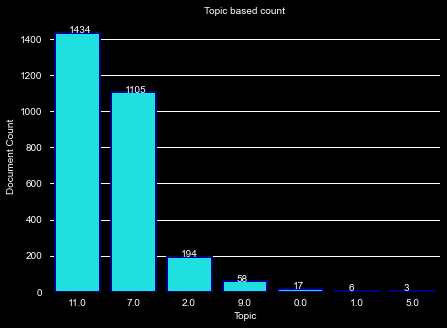

In [542]:
plt.figure(figsize=(7,5))
#plt.style.use('default')
plt.style.use('dark_background')
ax=sns.countplot(x='Dominant_Topic',data=ds_dominant_topic,order = ds_dominant_topic['Dominant_Topic'].value_counts().index,color='cyan',edgecolor='navy',linewidth=2)
ax.set_title('Topic based count',fontsize=10)
ax.set_xlabel("Topic",fontsize=10)
ax.set_ylabel("Document Count",fontsize=10)
for p in ax.patches:
   ax.annotate('{}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()))
plt.show()

**#Decided Topics for this model,**

Topic 1.0 - Appointment Issues

Topic 4.0 - General Complaints

Topic 5.0 - Mental health service issues

Topic 11.0 - Access Issues

Topic 14.0 - Carer/Interpretter issues


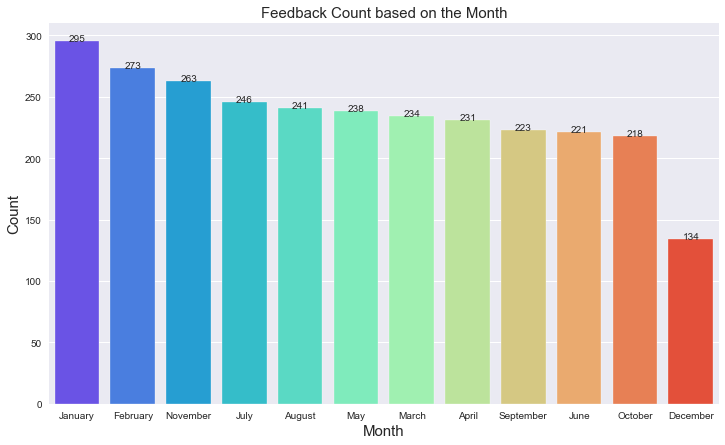

In [540]:
plt.figure(figsize=(12,7))
plt.style.use('seaborn')
ax=sns.countplot(x='month',data=spacy_combo,order = spacy_combo['month'].value_counts().index,palette='rainbow')
ax.set_title('Feedback Count based on the Month',fontsize=15)
ax.set_xlabel("Month",fontsize=15)
ax.set_ylabel("Count",fontsize=15)
for p in ax.patches:
   ax.annotate('{}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()))
plt.show()

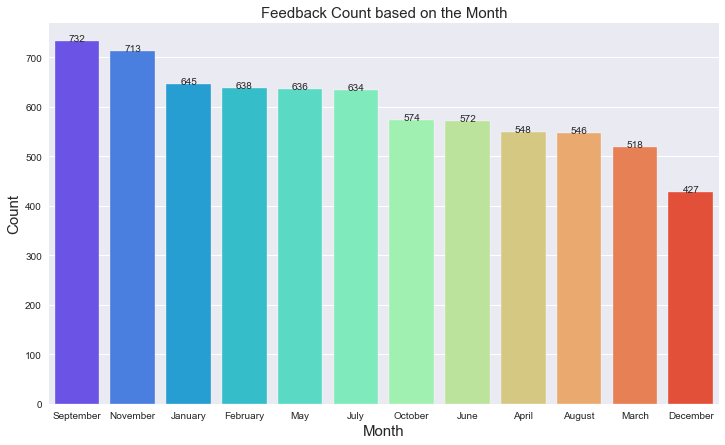

In [461]:
plt.figure(figsize=(12,7))
plt.style.use('seaborn')
ax=sns.countplot(x='month',data=df,order = df['month'].value_counts().index,palette='rainbow')
ax.set_title('Feedback Count based on the Month',fontsize=15)
ax.set_xlabel("Month",fontsize=15)
ax.set_ylabel("Count",fontsize=15)
for p in ax.patches:
   ax.annotate('{}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()))
plt.show()

# Exploratory Analysis - Sentiment Analysis

In [462]:
spacy_combo_CCG = spacy_combo[spacy_combo['organisation'].str.contains('NHS Bradford CCG')]

In [463]:
spacy_combo_CCG.shape

(1388, 22)

[Text(0, 0, '933'),
 Text(0, 0, '61'),
 Text(0, 0, '52'),
 Text(0, 0, '51'),
 Text(0, 0, '20'),
 Text(0, 0, '20'),
 Text(0, 0, '19'),
 Text(0, 0, '12'),
 Text(0, 0, '11'),
 Text(0, 0, '11')]

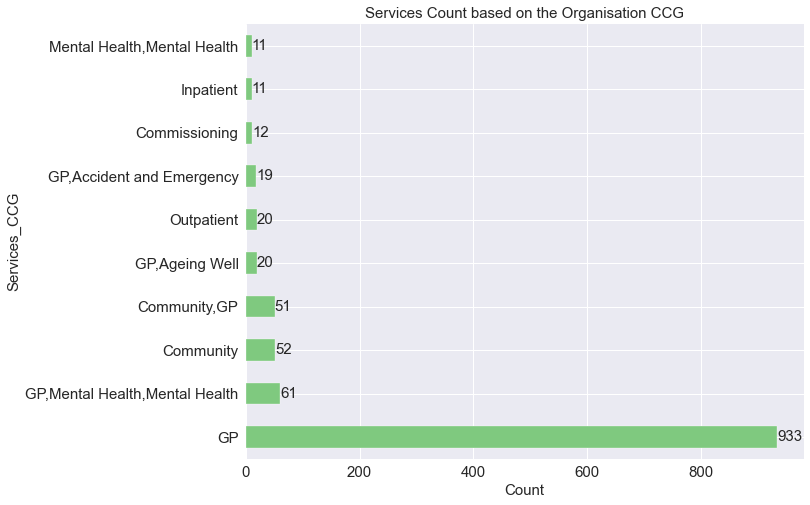

In [464]:
plt.figure(figsize=(10,8))
ax = spacy_combo_CCG[spacy_combo_CCG['service']!="not mentioned"]['service'].value_counts().sort_values(ascending=False).head(10).plot.barh(colormap='Accent',fontsize=15)
ax.set_title('Services Count based on the Organisation CCG',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Services_CCG",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
#plt.title("Services count based on Organisation CCG")

[Text(0, 0, '39'),
 Text(0, 0, '34'),
 Text(0, 0, '26'),
 Text(0, 0, '25'),
 Text(0, 0, '22'),
 Text(0, 0, '22'),
 Text(0, 0, '21'),
 Text(0, 0, '20'),
 Text(0, 0, '20'),
 Text(0, 0, '18')]

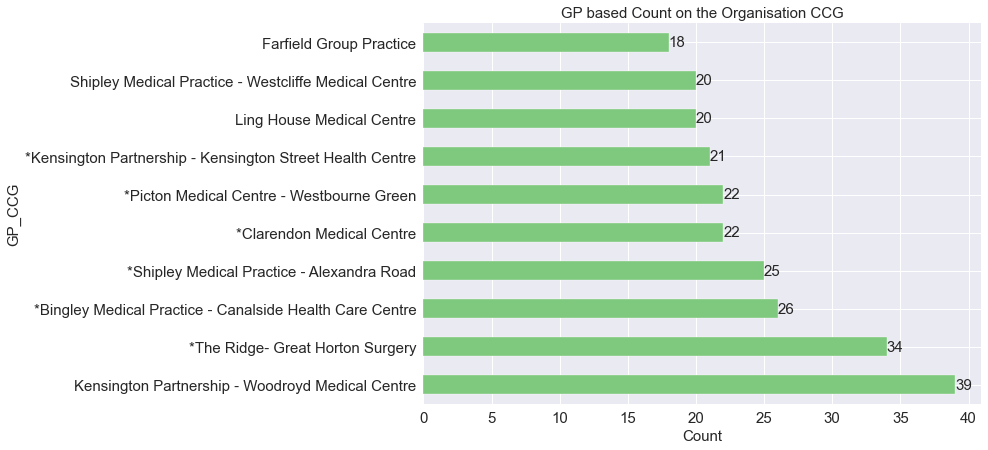

In [465]:
#CCG_GP = found.groupby("GP")
plt.figure(figsize=(10,7))
#ax = spacy_combo_CCG[spacy_combo_CCG['service']!="not mentioned"]['service'].value_counts().sort_values(ascending=False).head(10).plot.barh(colormap='Accent',fontsize=15)
ax = spacy_combo_CCG[spacy_combo_CCG['GP']!="not mentioned"]['GP'].value_counts().sort_values(ascending=False).head(10).plot.barh(colormap='Accent',fontsize=15)
ax.set_title('GP based Count on the Organisation CCG',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("GP_CCG",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
#plt.title("Services count based on Organisation CCG")

**Ambulance Service**

In [466]:
#Org_Ambulance = df[df['organisation'].str.contains('Ambulance')]
spacy_combo_amb = spacy_combo[spacy_combo['organisation'].str.contains('Ambulance')]

[Text(0, 0, '14'),
 Text(0, 0, '8'),
 Text(0, 0, '6'),
 Text(0, 0, '4'),
 Text(0, 0, '3'),
 Text(0, 0, '3'),
 Text(0, 0, '3'),
 Text(0, 0, '3'),
 Text(0, 0, '2'),
 Text(0, 0, '2')]

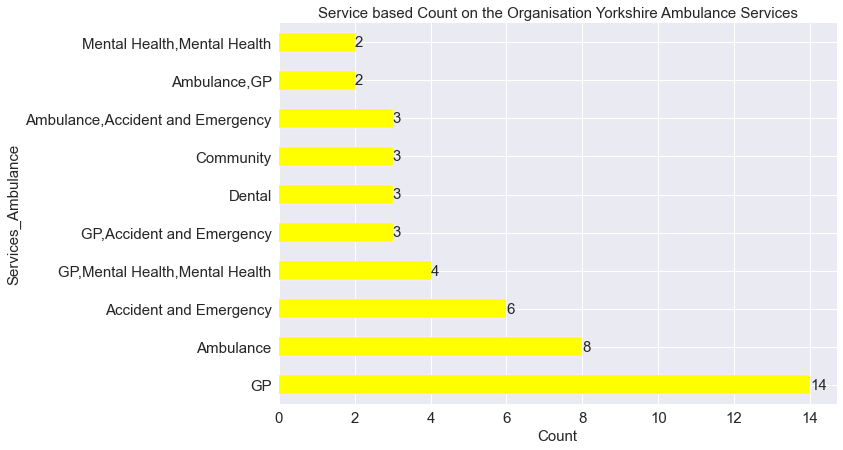

In [467]:
plt.figure(figsize=(10,7))
ax = spacy_combo_amb[spacy_combo_amb['service']!="not mentioned"]['service'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='yellow',fontsize=15)
ax.set_title('Service based Count on the Organisation Yorkshire Ambulance Services',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Services_Ambulance",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

Text(0.5, 1.0, 'GP Services Vs Count')

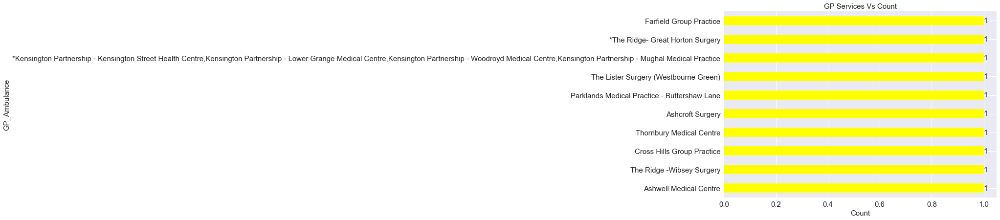

In [468]:
plt.figure(figsize=(10,7))
ax = spacy_combo_amb[spacy_combo_amb['GP']!="not mentioned"]['GP'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='yellow',fontsize=15)
#ax.set_title('Service based Count on the Organisation Yorkshire Ambulance Services',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("GP_Ambulance",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
plt.title("GP Services Vs Count",fontsize=15)

In [469]:
spacy_combo_amb[spacy_combo_amb['GP']!="not mentioned"]['GP'].value_counts()

Ashwell Medical Centre                                                                                                                                                                                              1
The Ridge -Wibsey Surgery                                                                                                                                                                                           1
Cross Hills Group Practice                                                                                                                                                                                          1
Thornbury Medical Centre                                                                                                                                                                                            1
Ashcroft Surgery                                                                                                                                

**Teaching Hospital**

In [470]:
spacy_combo_Teaching = spacy_combo[spacy_combo['organisation'].str.contains('Teaching')]

[Text(0, 0, '98'),
 Text(0, 0, '50'),
 Text(0, 0, '44'),
 Text(0, 0, '29'),
 Text(0, 0, '27'),
 Text(0, 0, '10'),
 Text(0, 0, '9'),
 Text(0, 0, '8'),
 Text(0, 0, '5'),
 Text(0, 0, '4')]

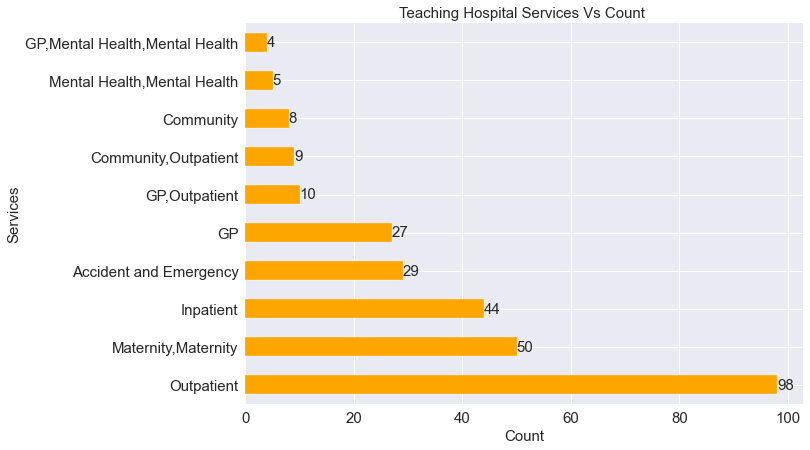

In [471]:
plt.figure(figsize=(10,7))
ax = spacy_combo_Teaching[spacy_combo_Teaching['service']!="not mentioned"]['service'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='orange',fontsize=15)
ax.set_title('Teaching Hospital Services Vs Count ',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Services",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

[Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '2'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1'),
 Text(0, 0, '1')]

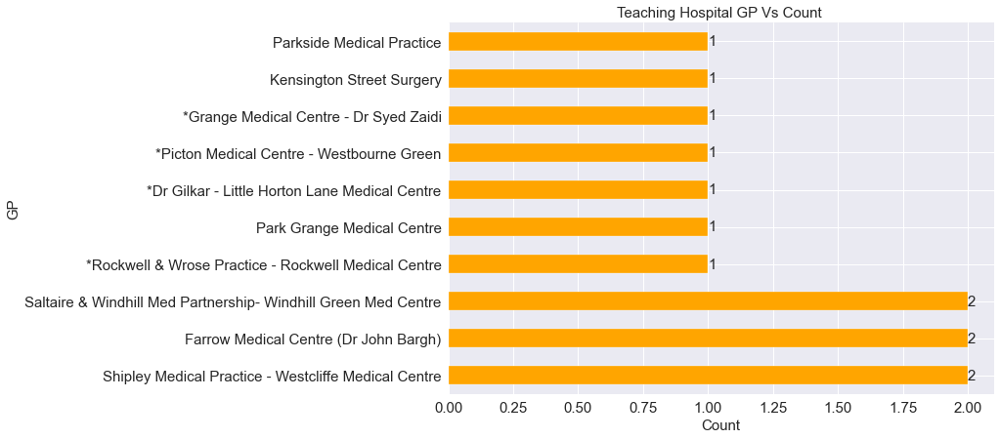

In [472]:
plt.figure(figsize=(10,7))
ax = spacy_combo_Teaching[spacy_combo_Teaching['GP']!="not mentioned"]['GP'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='orange',fontsize=15)
ax.set_title('Teaching Hospital GP Vs Count ',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("GP",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)

**District Care**

In [473]:
spacy_combo_DC = spacy_combo[spacy_combo['organisation'].str.contains('District')]

Text(0.5, 1.0, 'District Care Services Vs Count')

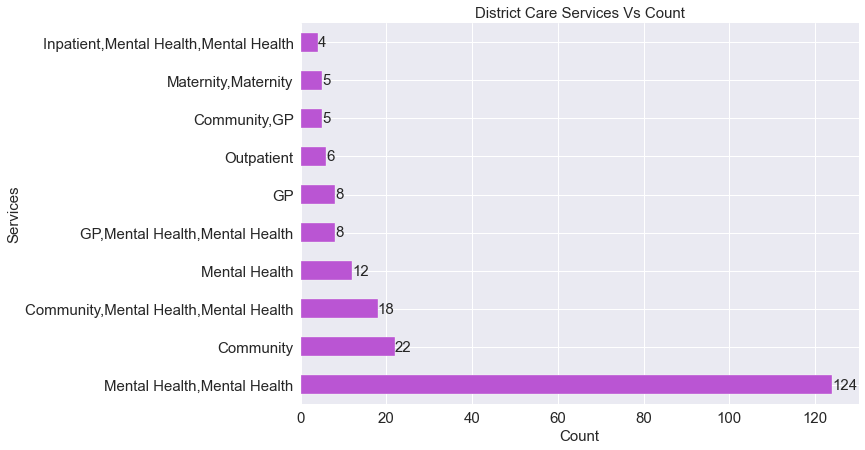

In [474]:
plt.figure(figsize=(10,7))
ax = spacy_combo_DC[spacy_combo_DC['service']!="not mentioned"]['service'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='mediumorchid',fontsize=15)
#ax.set_title('Service based Count on the Organisation Yorkshire Ambulance Services',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Services",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
plt.title("District Care Services Vs Count",fontsize=15)

Text(0.5, 1.0, 'GP Services Vs Count')

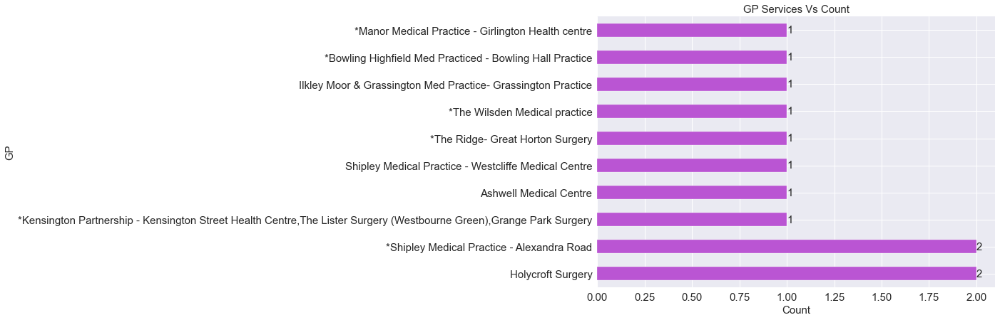

In [475]:
plt.figure(figsize=(10,7))
ax = spacy_combo_DC[spacy_combo_DC['GP']!="not mentioned"]['GP'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='mediumorchid',fontsize=15)
#ax.set_title('Service based Count on the Organisation Yorkshire Ambulance Services',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("GP",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
plt.title("GP Services Vs Count",fontsize=15)

**Airedale Hospital**

In [476]:
spacy_combo_air = spacy_combo[spacy_combo['organisation'].str.contains('Airedale')]

Text(0.5, 1.0, 'Airedale Hospital Services Vs Count')

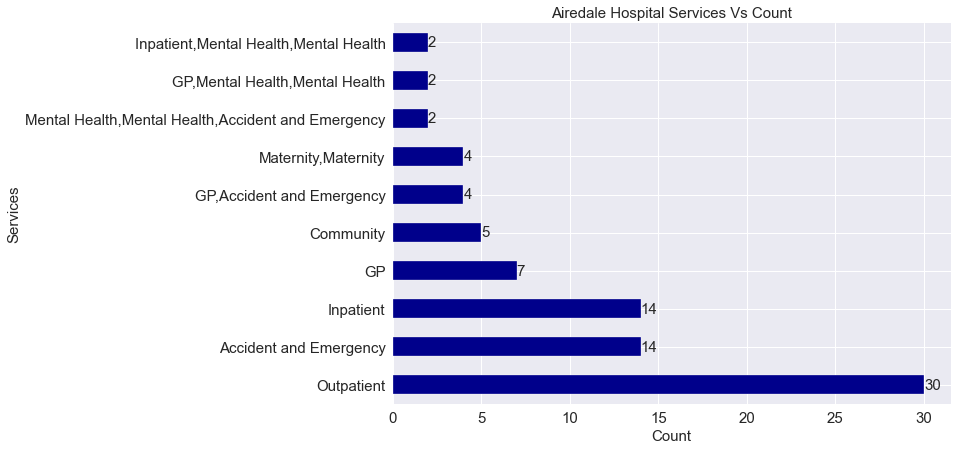

In [477]:
plt.figure(figsize=(10,7))
ax = spacy_combo_air[spacy_combo_air['service']!="not mentioned"]['service'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='darkblue',fontsize=15)
#ax.set_title('Service based Count on the Organisation Yorkshire Ambulance Services',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("Services",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
plt.title("Airedale Hospital Services Vs Count",fontsize=15)

Text(0.5, 1.0, 'Airedale Hospital GP Vs Count')

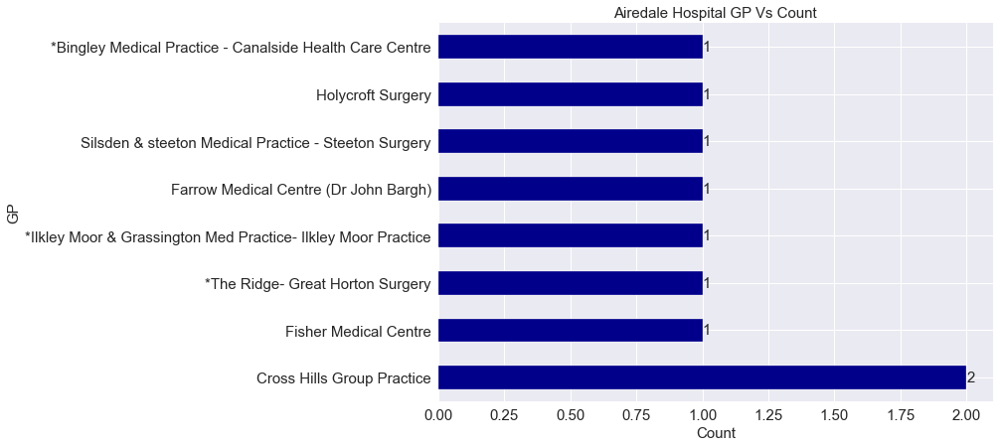

In [478]:
plt.figure(figsize=(10,7))
ax = spacy_combo_air[spacy_combo_air['GP']!="not mentioned"]['GP'].value_counts().sort_values(ascending=False).head(10).plot.barh(color='darkblue',fontsize=15)
#ax.set_title('Service based Count on the Organisation Yorkshire Ambulance Services',fontsize=15)
ax.set_xlabel("Count",fontsize=15)
ax.set_ylabel("GP",fontsize=15)
ax.bar_label(ax.containers[0],fontsize=15)
plt.title("Airedale Hospital GP Vs Count",fontsize=15)

**Topic Allocation**

In [479]:
#import pickle

#spacy_combo.to_pickle("./spacy_combo.pkl")

In [480]:
#spacy_da.to_pickle("./spacy_combo.pkl")

In [481]:
#spacy_corpus.to_pickle("./spacy_corpus.pkl")

In [482]:
#import pickle
  
# Create a variable
  
# Use dumps() to make it serialized
#serialized = pickle.dumps(spacy_combo)
  
#print(serialized)

In [483]:
spacy_combo.to_csv('NN.csv')

In [484]:
df['patient_feedback'].loc[685]

'Suppose to have telephone consultation at 9.30.At 10.30 told doctor not even dealing with patients yet but will call at some point.At 12.00 called and told can’t find my test results.At 13.30 doctor finally called. Can’t find my results and secretary not in and does not know when she will be in. She might be on holiday.A week later called them still not had call. Put through to an answering machine. So appointments given at times when doctor not available.No cover when people on holidayConstantly passed to different people then put through to an answering machine, that’s if they don’t just cut you off.'

# Added Negative comment Analysis

**CCG**

In [485]:
spacy_combo.shape

(2817, 22)

In [486]:
spacy_combo.dtypes

date                          datetime64[ns]
survey                                object
services                              object
patient_feedback                      object
year                                   int64
month                                 object
organisation                          object
third_party                           object
GP                                    object
service                               object
priority_area                         object
primary_care                          object
cleaned_feedback                      object
feedback_w/o_stopwords                object
lemma                                 object
lemma_w/o_custom_stopwords            object
pos_tag                               object
spacy_sentiment_score                float64
sentiment_score                      float64
spacy_sentiment                       object
sentiment                             object
length                                 int64
dtype: obj

In [487]:
spacy_combo_CCG.shape

(1388, 22)

In [488]:
spacy_combo_CCG['lemma_w/o_custom_stopwords']

78      place absolute joke worse suicidal psychiatrist chop change medication like pick drug think goog...
125     practice bring new system appointment doctor phone appointment tall time system good wait phone ...
130     sister leave form fill metro bus today recieve visit sergery phone brother twice responce notify...
142     impressed service provide today family practice issue practice recently sad long patient money h...
145     surgery clean doctor good receptionist staff awful undertraine communicate innefectively cut cor...
                                                       ...                                                 
7470             propose ccg information video yes agree subtitle include video clip bare mind equality act
7472    propose ccgcontacte correct service hard minute patient cause contact centre instead direct acce...
7491    stress staff rude good willing help possible rest agree attitude problem think patient caller id...
7499                        

In [489]:
ccg_negative = [" ".join(text)for text in spacy_combo_CCG['lemma_w/o_custom_stopwords'].str.split(' ')]

In [490]:
ccg_negative_corpus = " ".join(ccg_negative)

In [491]:
ccg_negative_bigram = get_ngrams(ccg_negative_corpus,2)

In [492]:
ccg_neg_split_it = ccg_negative_bigram.split()
ccg_neg_counter = Counter(ccg_neg_split_it)
ccg_neg_most_occur = ccg_neg_counter.most_common(20)
ccg_bi_neg_temp = pd.DataFrame(ccg_neg_most_occur)
ccg_bi_neg_temp.columns = ['bigram','count']

In [493]:
ccg_bi_neg_temp

,bigram,count
0,gp_practice,194
1,mental_health,111
2,practice_manager,87
3,book_appointment,77
4,medical_centre,75
5,blood_test,66
6,medical_practice,65
7,raise_concern,62
8,patient_rang,57
9,gp_surgery,56


S:\Installation\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



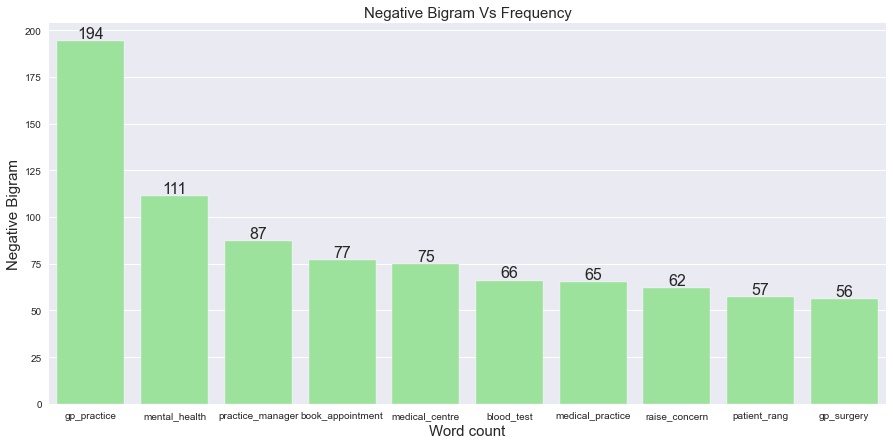

In [494]:
plt.figure(figsize=(15,7))
ax=sns.barplot(ccg_bi_neg_temp['bigram'].head(10),ccg_bi_neg_temp['count'].head(10),color='lightgreen')
plt.xlabel('Word count',fontsize=15)
plt.ylabel('Negative Bigram',fontsize=15)
plt.title('Negative Bigram Vs Frequency',fontsize=15)
plt.bar_label(ax.containers[0],size=16)
plt.show()

**Teaching Hospital**

In [495]:
th_negative = [" ".join(text)for text in spacy_combo_Teaching['lemma_w/o_custom_stopwords'].str.split(' ')]
th_negative_corpus = " ".join(th_negative)
th_negative_bigram = get_ngrams(th_negative_corpus,2)
th_neg_split_it = th_negative_bigram.split()
th_neg_counter = Counter(th_neg_split_it)
th_neg_most_occur = th_neg_counter.most_common(20)
th_bi_neg_temp = pd.DataFrame(th_neg_most_occur)
th_bi_neg_temp.columns = ['bigram','count']

In [496]:
th_bi_neg_temp

,bigram,count
0,st_luke,52
1,bradford_royal,36
2,royal_infirmary,34
3,mental_health,27
4,wait_hour,23
5,st_lukes,20
6,blood_test,19
7,wait_time,19
8,gp_practice,17
9,yorkshire_clinic,15


S:\Installation\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



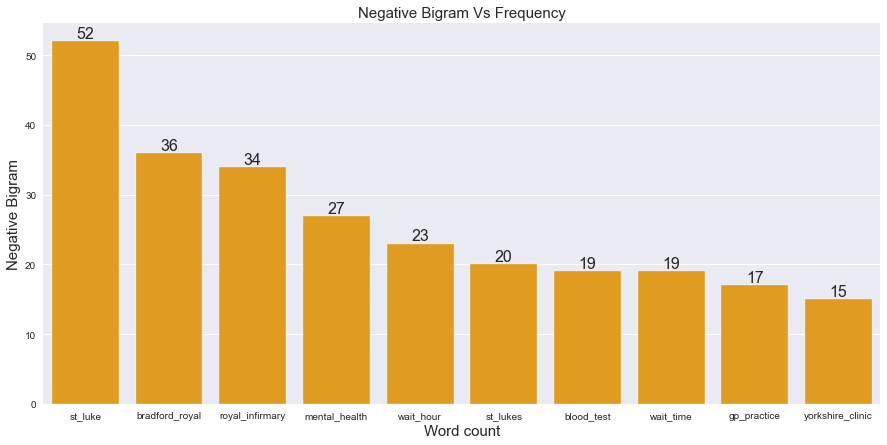

In [497]:
plt.figure(figsize=(15,7))
ax=sns.barplot(th_bi_neg_temp['bigram'].head(10),th_bi_neg_temp['count'].head(10),color='orange')
plt.xlabel('Word count',fontsize=15)
plt.ylabel('Negative Bigram',fontsize=15)
plt.title('Negative Bigram Vs Frequency',fontsize=15)
plt.bar_label(ax.containers[0],size=16)
plt.show()

**District Care**

In [498]:
dc_negative = [" ".join(text)for text in spacy_combo_DC['lemma_w/o_custom_stopwords'].str.split(' ')]
dc_negative_corpus = " ".join(dc_negative)
dc_negative_bigram = get_ngrams(dc_negative_corpus,2)
dc_neg_split_it = dc_negative_bigram.split()
dc_neg_counter = Counter(dc_neg_split_it)
dc_neg_most_occur = dc_neg_counter.most_common(20)
dc_bi_neg_temp = pd.DataFrame(dc_neg_most_occur)
dc_bi_neg_temp.columns = ['bigram','count']

In [499]:
dc_bi_neg_temp

,bigram,count
0,mental_health,149
1,health_service,35
2,waiting_list,24
3,raise_concern,15
4,lynfield_mount,14
5,receive_letter,12
6,health_team,12
7,staff_member,12
8,health_issue,11
9,wait_time,10


S:\Installation\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



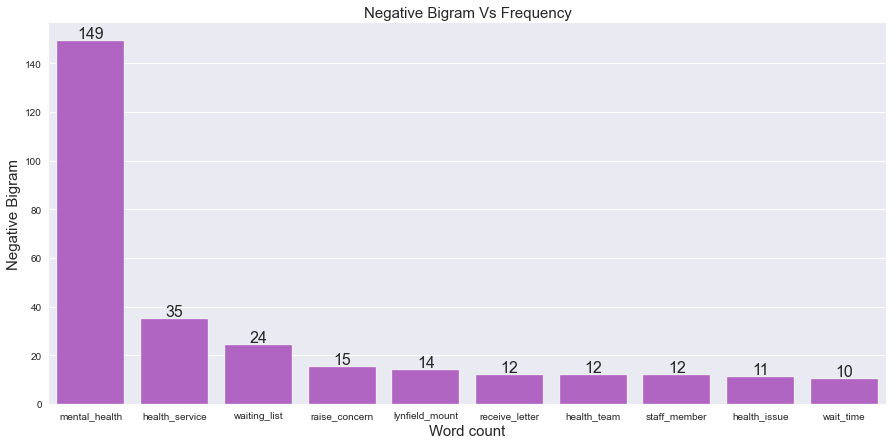

In [500]:
plt.figure(figsize=(15,7))
ax=sns.barplot(dc_bi_neg_temp['bigram'].head(10),dc_bi_neg_temp['count'].head(10),color='mediumorchid')
plt.xlabel('Word count',fontsize=15)
plt.ylabel('Negative Bigram',fontsize=15)
plt.title('Negative Bigram Vs Frequency',fontsize=15)
plt.bar_label(ax.containers[0],size=16)
plt.show()

# Specific to services

In [501]:
spacy_combo_ccg_gp = spacy_combo_CCG[spacy_combo_CCG['service'].str.contains('GP')]

In [502]:
spacy_combo_ccg_gp.shape

(1156, 22)

In [503]:
ccg_gp_negative = [" ".join(text)for text in spacy_combo_ccg_gp['lemma_w/o_custom_stopwords'].str.split(' ')]
ccg_gp_negative_corpus = " ".join(ccg_gp_negative)
ccg_gp_negative_bigram = get_ngrams(ccg_gp_negative_corpus,2)
ccg_gp_neg_split_it = ccg_gp_negative_bigram.split()
ccg_gp_neg_counter = Counter(ccg_gp_neg_split_it)
ccg_gp_neg_most_occur = ccg_gp_neg_counter.most_common(20)
ccg_gp_bi_neg_temp = pd.DataFrame(ccg_gp_neg_most_occur)
ccg_gp_bi_neg_temp.columns = ['bigram','count']

In [504]:
ccg_gp_bi_neg_temp

,bigram,count
0,gp_practice,177
1,practice_manager,87
2,mental_health,78
3,book_appointment,72
4,medical_centre,69
5,blood_test,63
6,medical_practice,61
7,gp_surgery,53
8,raise_concern,47
9,face_face,43


In [505]:
spacy_combo_ccg_gp1 = spacy_combo_CCG[spacy_combo_CCG['service']=='GP']
ccg_gp1_negative = [" ".join(text)for text in spacy_combo_ccg_gp1['lemma_w/o_custom_stopwords'].str.split(' ')]
ccg_gp1_negative_corpus = " ".join(ccg_gp1_negative)
ccg_gp1_negative_bigram = get_ngrams(ccg_gp1_negative_corpus,2)
ccg_gp1_neg_split_it = ccg_gp1_negative_bigram.split()
ccg_gp1_neg_counter = Counter(ccg_gp1_neg_split_it)
ccg_gp1_neg_most_occur = ccg_gp1_neg_counter.most_common(20)
ccg_gp1_bi_neg_temp = pd.DataFrame(ccg_gp1_neg_most_occur)
ccg_gp1_bi_neg_temp.columns = ['bigram','count']

In [506]:
ccg_gp1_bi_neg_temp

,bigram,count
0,gp_practice,134
1,practice_manager,73
2,book_appointment,63
3,blood_test,57
4,medical_centre,55
5,medical_practice,45
6,raise_concern,39
7,patient_rang,39
8,gp_surgery,33
9,face_face,32


In [507]:
spacy_combo_ccg_mh = spacy_combo_CCG[spacy_combo_CCG['service'].str.contains('Mental')]
ccg_mh_negative = [" ".join(text)for text in spacy_combo_ccg_mh['lemma_w/o_custom_stopwords'].str.split(' ')]
ccg_mh_negative_corpus = " ".join(ccg_mh_negative)
ccg_mh_negative_bigram = get_ngrams(ccg_mh_negative_corpus,2)
ccg_mh_neg_split_it = ccg_mh_negative_bigram.split()
ccg_mh_neg_counter = Counter(ccg_mh_neg_split_it)
ccg_mh_neg_most_occur = ccg_mh_neg_counter.most_common(20)
ccg_mh_bi_neg_temp = pd.DataFrame(ccg_mh_neg_most_occur)
ccg_mh_bi_neg_temp.columns = ['bigram','count']

In [508]:
ccg_mh_bi_neg_temp

,bigram,count
0,mental_health,95
1,gp_practice,18
2,medical_practice,12
3,health_problem,11
4,health_issue,11
5,waiting_list,10
6,staff_member,8
7,formal_complaint,8
8,suffer_mental,8
9,health_service,7


In [509]:
spacy_combo_ccg_cm = spacy_combo_CCG[spacy_combo_CCG['service'].str.contains("Community")]
ccg_cm_negative = [" ".join(text)for text in spacy_combo_ccg_cm['lemma_w/o_custom_stopwords'].str.split(' ')]
ccg_cm_negative_corpus = " ".join(ccg_cm_negative)
ccg_cm_negative_bigram = get_ngrams(ccg_cm_negative_corpus,2)
ccg_cm_neg_split_it = ccg_cm_negative_bigram.split()
ccg_cm_neg_counter = Counter(ccg_cm_neg_split_it)
ccg_cm_neg_most_occur = ccg_cm_neg_counter.most_common(20)
ccg_cm_bi_neg_temp = pd.DataFrame(ccg_cm_neg_most_occur)
ccg_cm_bi_neg_temp.columns = ['bigram','count']

In [510]:
ccg_cm_bi_neg_temp

,bigram,count
0,gp_practice,19
1,continue_healthcare,19
2,care_home,13
3,nursing_home,11
4,formal_complaint,10
5,mental_health,10
6,district_nurse,10
7,prescription_send,8
8,staff_member,8
9,social_worker,8


In [511]:
spacy_combo_ccg_op = spacy_combo_CCG[spacy_combo_CCG['service'].str.contains('Outpatient')]
ccg_op_negative = [" ".join(text)for text in spacy_combo_ccg_op['lemma_w/o_custom_stopwords'].str.split(' ')]
ccg_op_negative_corpus = " ".join(ccg_op_negative)
ccg_op_negative_bigram = get_ngrams(ccg_op_negative_corpus,2)
ccg_op_neg_split_it = ccg_op_negative_bigram.split()
ccg_op_neg_counter = Counter(ccg_op_neg_split_it)
ccg_op_neg_most_occur = ccg_op_neg_counter.most_common(20)
ccg_op_bi_neg_temp = pd.DataFrame(ccg_op_neg_most_occur)
ccg_op_bi_neg_temp.columns = ['bigram','count']

In [512]:
ccg_op_bi_neg_temp

,bigram,count
0,st_luke,8
1,appointment_cancel,5
2,patient_attend,5
3,gp_surgery,4
4,appointment_gp,3
5,receive_letter,3
6,yorkshire_clinic,3
7,patient_gp,3
8,patient_telephone,3
9,gp_refer,3


In [513]:
spacy_combo_ccg_cm1 = spacy_combo_CCG[spacy_combo_CCG['service']=='Community']
ccg_cm1_negative = [" ".join(text)for text in spacy_combo_ccg_cm1['lemma_w/o_custom_stopwords'].str.split(' ')]
ccg_cm1_negative_corpus = " ".join(ccg_cm1_negative)
ccg_cm1_negative_bigram = get_ngrams(ccg_cm1_negative_corpus,2)
ccg_cm1_neg_split_it = ccg_cm1_negative_bigram.split()
ccg_cm1_neg_counter = Counter(ccg_cm1_neg_split_it)
ccg_cm1_neg_most_occur = ccg_cm1_neg_counter.most_common(20)
ccg_cm1_bi_neg_temp = pd.DataFrame(ccg_cm1_neg_most_occur)
ccg_cm1_bi_neg_temp.columns = ['bigram','count']

In [514]:
ccg_cm1_bi_neg_temp

,bigram,count
0,continue_healthcare,14
1,care_home,9
2,nursing_home,9
3,commission_department,6
4,social_service,6
5,staff_member,5
6,assessment_eligibility,5
7,formal_complaint,5
8,decision_support,5
9,support_tool,5


**Teaching Hospital**

In [515]:
spacy_combo_th_mt = spacy_combo_Teaching[spacy_combo_Teaching['service'].str.contains('Maternity')]
th_mt_negative = [" ".join(text)for text in spacy_combo_th_mt['lemma_w/o_custom_stopwords'].str.split(' ')]
th_mt_negative_corpus = " ".join(th_mt_negative)
th_mt_negative_bigram = get_ngrams(th_mt_negative_corpus,2)
th_mt_neg_split_it = th_mt_negative_bigram.split()
th_mt_neg_counter = Counter(th_mt_neg_split_it)
th_mt_neg_most_occur = th_mt_neg_counter.most_common(20)
th_mt_bi_neg_temp = pd.DataFrame(th_mt_neg_most_occur)
th_mt_bi_neg_temp.columns = ['bigram','count']

In [516]:
th_mt_bi_neg_temp

,bigram,count
0,tongue_tie,6
1,health_visitor,4
2,mental_health,3
3,bradford_royal,3
4,royal_infirmary,3
5,care_receive,3
6,c_section,3
7,speak_english,3
8,maternity_care,3
9,visitor_doctor,3


In [517]:
spacy_combo_th_gp = spacy_combo_Teaching[spacy_combo_Teaching['service'].str.contains('GP')]
th_gp_negative = [" ".join(text)for text in spacy_combo_th_gp['lemma_w/o_custom_stopwords'].str.split(' ')]
th_gp_negative_corpus = " ".join(th_gp_negative)
th_gp_negative_bigram = get_ngrams(th_gp_negative_corpus,2)
th_gp_neg_split_it = th_gp_negative_bigram.split()
th_gp_neg_counter = Counter(th_gp_neg_split_it)
th_gp_neg_most_occur = th_gp_neg_counter.most_common(20)
th_gp_bi_neg_temp = pd.DataFrame(th_gp_neg_most_occur)
th_gp_bi_neg_temp.columns = ['bigram','count']

In [518]:
th_gp_bi_neg_temp

,bigram,count
0,gp_practice,13
1,st_luke,11
2,gp_refer,8
3,blood_test,7
4,chest_pain,7
5,inside_mouth,6
6,westcliffe_medical,6
7,medical_centre,6
8,bradford_royal,6
9,royal_infirmary,6


In [519]:
spacy_combo_th_gp1 = spacy_combo_Teaching[spacy_combo_Teaching['service']=='GP']
th_gp1_negative = [" ".join(text)for text in spacy_combo_th_gp1['lemma_w/o_custom_stopwords'].str.split(' ')]
th_gp1_negative_corpus = " ".join(th_gp1_negative)
th_gp1_negative_bigram = get_ngrams(th_gp1_negative_corpus,2)
th_gp1_neg_split_it = th_gp1_negative_bigram.split()
th_gp1_neg_counter = Counter(th_gp1_neg_split_it)
th_gp1_neg_most_occur = th_gp1_neg_counter.most_common(20)
th_gp1_bi_neg_temp = pd.DataFrame(th_gp1_neg_most_occur)
th_gp1_bi_neg_temp.columns = ['bigram','count']

In [520]:
th_gp1_bi_neg_temp

,bigram,count
0,gp_practice,10
1,gp_advise,6
2,bradford_royal,5
3,royal_infirmary,5
4,mri_scan,5
5,refer_msk,5
6,blood_test,4
7,raise_concern,4
8,gp_refer,4
9,nhs_record,4


In [521]:
spacy_combo_th_mh = spacy_combo_Teaching[spacy_combo_Teaching['service'].str.contains('Mental')]
th_mh_negative = [" ".join(text)for text in spacy_combo_th_mh['lemma_w/o_custom_stopwords'].str.split(' ')]
th_mh_negative_corpus = " ".join(th_mh_negative)
th_mh_negative_bigram = get_ngrams(th_mh_negative_corpus,2)
th_mh_neg_split_it = th_mh_negative_bigram.split()
th_mh_neg_counter = Counter(th_mh_neg_split_it)
th_mh_neg_most_occur = th_mh_neg_counter.most_common(20)
th_mh_bi_neg_temp = pd.DataFrame(th_mh_neg_most_occur)
th_mh_bi_neg_temp.columns = ['bigram','count']

In [522]:
th_mh_bi_neg_temp

,bigram,count
0,mental_health,27
1,health_care,7
2,care_assistant,6
3,ms_medication,5
4,bradford_royal,4
5,royal_infirmary,4
6,blood_test,3
7,suffer_anxiety,3
8,staff_member,3
9,health_service,3


In [523]:
spacy_combo_th_in = spacy_combo_Teaching[spacy_combo_Teaching['service'].str.contains('Inpatient')]
th_in_negative = [" ".join(text)for text in spacy_combo_th_in['lemma_w/o_custom_stopwords'].str.split(' ')]
th_in_negative_corpus = " ".join(th_in_negative)
th_in_negative_bigram = get_ngrams(th_in_negative_corpus,2)
th_in_neg_split_it = th_in_negative_bigram.split()
th_in_neg_counter = Counter(th_in_neg_split_it)
th_in_neg_most_occur = th_in_neg_counter.most_common(20)
th_in_bi_neg_temp = pd.DataFrame(th_in_neg_most_occur)
th_in_bi_neg_temp.columns = ['bigram','count']

In [524]:
th_in_bi_neg_temp

,bigram,count
0,bradford_royal,11
1,royal_infirmary,10
2,yorkshire_clinic,9
3,st_lukes,8
4,pain_relief,7
5,care_assistant,7
6,staff_ward,6
7,inside_mouth,6
8,westcliffe_medical,6
9,health_care,6


In [525]:
spacy_combo_th_op = spacy_combo_Teaching[spacy_combo_Teaching['service'].str.contains('Outpatient')]
th_op_negative = [" ".join(text)for text in spacy_combo_th_op['lemma_w/o_custom_stopwords'].str.split(' ')]
th_op_negative_corpus = " ".join(th_op_negative)
th_op_negative_bigram = get_ngrams(th_op_negative_corpus,2)
th_op_neg_split_it = th_op_negative_bigram.split()
th_op_neg_counter = Counter(th_op_neg_split_it)
th_op_neg_most_occur = th_op_neg_counter.most_common(20)
th_op_bi_neg_temp = pd.DataFrame(th_op_neg_most_occur)
th_op_bi_neg_temp.columns = ['bigram','count']

In [526]:
th_op_bi_neg_temp

,bigram,count
0,st_luke,37
1,st_lukes,12
2,cancel_appointment,10
3,clinic_run,9
4,bradford_royal,9
5,royal_infirmary,9
6,car_park,7
7,wait_hour,7
8,fast_track,7
9,gp_refer,6


**District Care**

In [527]:
spacy_combo_dc_gp = spacy_combo_DC[spacy_combo_DC['service'].str.contains("GP")]
dc_gp_negative = [" ".join(text)for text in spacy_combo_dc_gp['lemma_w/o_custom_stopwords'].str.split(' ')]
dc_gp_negative_corpus = " ".join(dc_gp_negative)
dc_gp_negative_bigram = get_ngrams(dc_gp_negative_corpus,2)
dc_gp_neg_split_it = dc_gp_negative_bigram.split()
dc_gp_neg_counter = Counter(dc_gp_neg_split_it)
dc_gp_neg_most_occur = dc_gp_neg_counter.most_common(20)
dc_gp_bi_neg_temp = pd.DataFrame(dc_gp_neg_most_occur)
dc_gp_bi_neg_temp.columns = ['bigram','count']

In [528]:
dc_gp_bi_neg_temp

,bigram,count
0,mental_health,18
1,medical_practice,6
2,waiting_list,5
3,help_gp,4
4,referral_gp,4
5,care_coordinator,4
6,mrs_b,4
7,record_receive,4
8,–_patient,4
9,nhs_record,4


In [529]:
spacy_combo_dc_mh = spacy_combo_DC[spacy_combo_DC['service'].str.contains('Mental')]
dc_mh_negative = [" ".join(text)for text in spacy_combo_dc_mh['lemma_w/o_custom_stopwords'].str.split(' ')]
dc_mh_negative_corpus = " ".join(dc_mh_negative)
dc_mh_negative_bigram = get_ngrams(dc_mh_negative_corpus,2)
dc_mh_neg_split_it = dc_mh_negative_bigram.split()
dc_mh_neg_counter = Counter(dc_mh_neg_split_it)
dc_mh_neg_most_occur = dc_mh_neg_counter.most_common(20)
dc_mh_bi_neg_temp = pd.DataFrame(dc_mh_neg_most_occur)
dc_mh_bi_neg_temp.columns = ['bigram','count']

In [530]:
dc_mh_bi_neg_temp

,bigram,count
0,mental_health,142
1,health_service,35
2,waiting_list,20
3,lynfield_mount,13
4,health_team,11
5,raise_concern,11
6,health_issue,10
7,care_coordinator,9
8,service_user,8
9,health_assessment,8


In [531]:
spacy_combo_dc_op = spacy_combo_DC[spacy_combo_DC['service'].str.contains('Outpatient')]
dc_op_negative = [" ".join(text)for text in spacy_combo_dc_op['lemma_w/o_custom_stopwords'].str.split(' ')]
dc_op_negative_corpus = " ".join(dc_op_negative)
dc_op_negative_bigram = get_ngrams(dc_op_negative_corpus,2)
dc_op_neg_split_it = dc_op_negative_bigram.split()
dc_op_neg_counter = Counter(dc_op_neg_split_it)
dc_op_neg_most_occur = dc_op_neg_counter.most_common(20)
dc_op_bi_neg_temp = pd.DataFrame(dc_op_neg_most_occur)
dc_op_bi_neg_temp.columns = ['bigram','count']

In [532]:
dc_op_bi_neg_temp

,bigram,count
0,mental_health,3
1,health_treatment,2
2,advise_contact,2
3,service_accept,2
4,patient_foot,1
5,foot_problem,1
6,problem_bend,1
7,bend_forward,1
8,forward_cut,1
9,cut_toe,1


In [533]:
spacy_combo_dc_cm = spacy_combo_DC[spacy_combo_DC['service']=='Community,Mental Health,Mental Health']
dc_cm_negative = [" ".join(text)for text in spacy_combo_dc_cm['lemma_w/o_custom_stopwords'].str.split(' ')]
dc_cm_negative_corpus = " ".join(dc_cm_negative)
dc_cm_negative_bigram = get_ngrams(dc_cm_negative_corpus,2)
dc_cm_neg_split_it = dc_cm_negative_bigram.split()
dc_cm_neg_counter = Counter(dc_cm_neg_split_it)
dc_cm_neg_most_occur = dc_cm_neg_counter.most_common(20)
dc_cm_bi_neg_temp = pd.DataFrame(dc_cm_neg_most_occur)
dc_cm_bi_neg_temp.columns = ['bigram','count']

In [534]:
dc_cm_bi_neg_temp

,bigram,count
0,mental_health,12
1,health_service,3
2,community_mental,3
3,health_team,3
4,bad_experience,2
5,time_speak,2
6,staff_desk,2
7,member_staff,2
8,provide_support,2
9,information_disclose,2


In [535]:
spacy_combo_dc_cm['service'].unique()

array(['Community,Mental Health,Mental Health'], dtype=object)

In [536]:
spacy_combo_dc_cm1 = spacy_combo_DC[spacy_combo_DC['service']=="Community"]
dc_cm1_negative = [" ".join(text)for text in spacy_combo_dc_cm1['lemma_w/o_custom_stopwords'].str.split(' ')]
dc_cm1_negative_corpus = " ".join(dc_cm1_negative)
dc_cm1_negative_bigram = get_ngrams(dc_cm1_negative_corpus,2)
dc_cm1_neg_split_it = dc_cm1_negative_bigram.split()
dc_cm1_neg_counter = Counter(dc_cm1_neg_split_it)
dc_cm1_neg_most_occur = dc_cm1_neg_counter.most_common(20)
dc_cm1_bi_neg_temp = pd.DataFrame(dc_cm1_neg_most_occur)
dc_cm1_bi_neg_temp.columns = ['bigram','count']

In [537]:
dc_cm1_bi_neg_temp

,bigram,count
0,district_nurse,6
1,care_home,4
2,toe_nail,3
3,cut_nail,3
4,access_counselling,3
5,staff_member,3
6,case_manager,3
7,bad_weather,3
8,podiatrist_cut,2
9,care_plan,2


In [538]:
spacy_combo_dc_mh1 = spacy_combo_DC[spacy_combo_DC['service']== ('Mental Health,Mental Health')]
dc_mh1_negative = [" ".join(text)for text in spacy_combo_dc_mh1['lemma_w/o_custom_stopwords'].str.split(' ')]
dc_mh1_negative_corpus = " ".join(dc_mh1_negative)
dc_mh1_negative_bigram = get_ngrams(dc_mh1_negative_corpus,2)
dc_mh1_neg_split_it = dc_mh1_negative_bigram.split()
dc_mh1_neg_counter = Counter(dc_mh1_neg_split_it)
dc_mh1_neg_most_occur = dc_mh1_neg_counter.most_common(20)
dc_mh1_bi_neg_temp = pd.DataFrame(dc_mh1_neg_most_occur)
dc_mh1_bi_neg_temp.columns = ['bigram','count']

In [539]:
dc_mh1_bi_neg_temp

,bigram,count
0,mental_health,78
1,health_service,24
2,waiting_list,12
3,lynfield_mount,7
4,service_user,7
5,health_team,6
6,raise_concern,6
7,wait_time,6
8,selective_mutism,5
9,care_coordinator,5
